In [37]:
# Import the required libraries
# I/O tabular y transformaciones

# Operaciones numéricas

# Manejo robusto de rutas multiplataforma
#from pathlib import Path

# constantes de 'quoting' para CSV
#import csv

import seaborn as sns
#import string, os, random
#import calendar

import pandas as pd
import numpy as np
import seaborn
import matplotlib.pyplot as plt
from shapely.geometry import Point
import kaleido
from pathlib import Path
import plotly.graph_objs as go
from plotly.offline import iplot
from collections import Counter
import plotly.io as pio
from datetime import datetime
import re

In [ ]:
BASE_DIR = Path("data")
DATA_DIR = BASE_DIR
IN_FILE  = DATA_DIR / 'gun-violence-data_01-2013_03-2018.csv'
IN_FILE1 = DATA_DIR / 'scprc-est2017-18+pop-res.csv'

# Cargar el archivo de la base de datos Gun Violence Data
df = pd.read_csv(IN_FILE)

# Cargar el archivo de la información de la población link del archivo: https://www2.census.gov/programs-surveys/popest/datasets/2010-2017/state/asrh/scprc-est2017-18+pop-res.csv
StatesPop = pd.read_csv(IN_FILE1)


### Fix a row in the dataset
### According to the author of this dataset, one particular incident is missing from the dataset
### I have manually added this incident
### Related Thread: https://www.kaggle.com/jameslko/gun-violence-data/discussion/55307
missing_row = ['sban_1', '2017-10-01', 'Nevada', 'Las Vegas', 'Mandalay Bay 3950 Blvd S', 59, 489, 'https://en.wikipedia.org/wiki/2017_Las_Vegas_shooting', 'https://en.wikipedia.org/wiki/2017_Las_Vegas_shooting', '-', '-', '-', '-', '-', '36.095', 'Hotel',
               '-115.171667', 47, 'Route 91 Harvest Festiva; concert, open fire from 32nd floor. 47 guns seized; TOTAL:59 kill, 489 inj, number shot TBD,girlfriend Marilou Danley POI', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
df.loc[len(df)] = missing_row

# Create some additional features
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['monthday'] = df['date'].dt.day
df['weekday'] = df['date'].dt.weekday
df['loss'] = df['n_killed'] + df['n_injured']

num_cols = ['latitude', 'longitude']
df[num_cols] = df[num_cols].apply(pd.to_numeric, errors="coerce")

# Usar transform para asignar el promedio de cada estado a sus filas
# Imputamos con
df["latitude"] = df["latitude"].fillna(df.groupby("state")["latitude"].transform("mean"))
df["longitude"] = df["longitude"].fillna(df.groupby("state")["longitude"].transform("mean"))


## Aqui hacemos el one hot encoding para las caracteristicas del incidente

In [40]:
from collections import Counter
big_text = "||".join(df['incident_characteristics'].dropna()).split("||")
incidents = Counter(big_text).most_common(20)
xx = [x[0] for x in incidents]
yy = [x[1] for x in incidents]

trace1 = go.Bar(
    x=yy[::-1],
    y=xx[::-1],
    name='Incident Characterisitcs',
    marker=dict(color='purple'),
    opacity=0.3,
    orientation="h"
)
data = [trace1]
layout = go.Layout(
    barmode='group',
    margin=dict(l=350),
    width=800,
    height=600,
    legend=dict(dict(x=-.1, y=1.2)),
    title = 'Key Incident Characteristics',
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')

# Extraer solo las características
solo_caracteristicas = [caracteristica for caracteristica, _ in incidents]

print(solo_caracteristicas)
# Extraer solo las características
solo_caracteristicas = [caracteristica for caracteristica, _ in incidents]

# Crear columnas binarias para cada característica
for feature in solo_caracteristicas:
    df[feature] = df['incident_characteristics'].apply(
        lambda x: 1 if isinstance(x, str) and feature in x else 0
    )

['Shot - Wounded/Injured', 'Shot - Dead (murder, accidental, suicide)', 'Non-Shooting Incident', 'Shots Fired - No Injuries', 'Possession (gun(s) found during commission of other crimes)', 'Armed robbery with injury/death and/or evidence of DGU found', 'Brandishing/flourishing/open carry/lost/found', 'ATF/LE Confiscation/Raid/Arrest', 'Officer Involved Incident', 'Possession of gun by felon or prohibited person', 'Drug involvement', 'Drive-by (car to street, car to car)', 'Institution/Group/Business', 'Domestic Violence', 'Home Invasion', 'Accidental Shooting', 'Stolen/Illegally owned gun{s} recovered during arrest/warrant', 'Defensive Use', 'Accidental/Negligent Discharge', 'Gun(s) stolen from owner']


In [41]:
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district', 'year', 'month', 'monthday', 'weekday', 'loss',
       'Shot - Wounded/Injured', 'Shot - Dead (murder, accidental, suicide)',
       'Non-Shooting Incident', 'Shots Fired - No Injuries',
       'Possession (gun(s) found during commission of other crimes)',
       'Armed robbery with injury/death and/or evidence of DGU found',
       'Brandishing/flourishing/open carry/lost/found',
       'ATF/LE Confiscation/Raid/

## Aqui hacemos el one hot encoding del status del participante (killed, arrested)

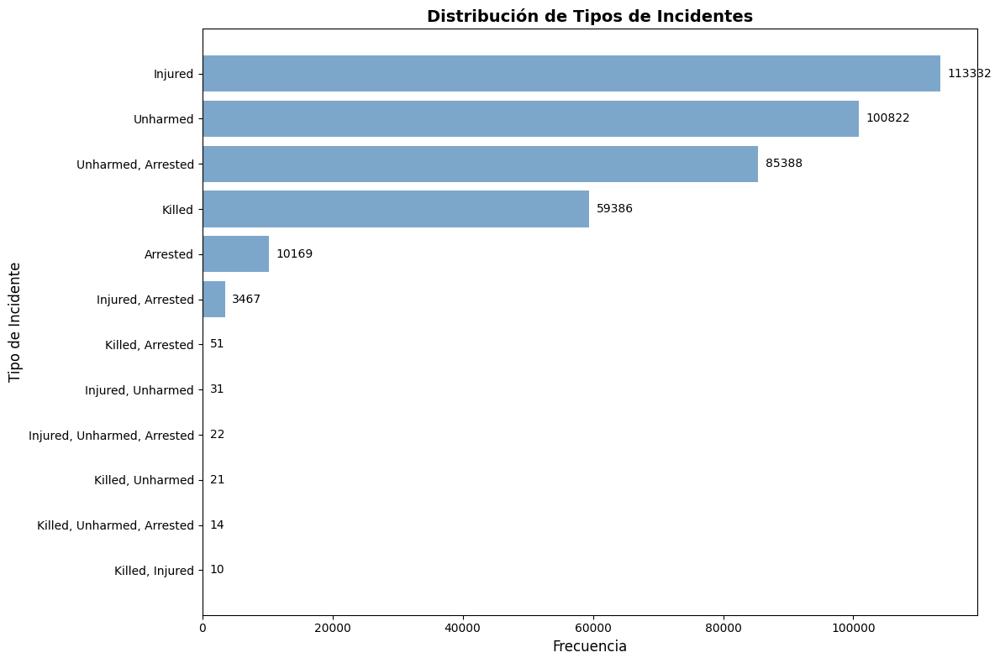


Top 20 tipos de incidentes:
----------------------------------------
 1. Injured                   113332 ocurrencias
 2. Unharmed                  100822 ocurrencias
 3. Unharmed, Arrested        85388 ocurrencias
 4. Killed                    59386 ocurrencias
 5. Arrested                  10169 ocurrencias
 6. Injured, Arrested          3467 ocurrencias
 7. Killed, Arrested             51 ocurrencias
 8. Injured, Unharmed            31 ocurrencias
 9. Injured, Unharmed, Arrested    22 ocurrencias
10. Killed, Unharmed             21 ocurrencias
11. Killed, Unharmed, Arrested    14 ocurrencias
12. Killed, Injured              10 ocurrencias


In [42]:
# Procesar los datos
big_text = "||".join(df['participant_status'].dropna())
all_values = [item.split("::")[1] for item in big_text.split("||") if "::" in item]
incidents = Counter(all_values).most_common(20)

# Preparar datos
categorias = [x[0] for x in incidents]
frecuencias = [x[1] for x in incidents]

# Crear gráfica con matplotlib
plt.figure(figsize=(12, 8))
bars = plt.barh(categorias[::-1], frecuencias[::-1], color='steelblue', alpha=0.7)

# Personalizar la gráfica
plt.xlabel('Frecuencia', fontsize=12)
plt.ylabel('Tipo de Incidente', fontsize=12)
plt.title('Distribución de Tipos de Incidentes', fontsize=14, fontweight='bold')

# Añadir los valores en las barras
for bar, freq in zip(bars, frecuencias[::-1]):
    plt.text(bar.get_width() + max(frecuencias)*0.01, bar.get_y() + bar.get_height()/2,
             f'{freq}', va='center', ha='left', fontsize=10)

plt.tight_layout()
plt.show()

# Opcional: Mostrar tabla con los datos
print("\nTop 20 tipos de incidentes:")
print("-" * 40)
for i, (categoria, freq) in enumerate(incidents, 1):
    print(f"{i:2d}. {categoria:<25} {freq:>5} ocurrencias")


solo_status = [caracteristica for caracteristica, _ in incidents]


# Crear columnas binarias para cada característica
for feature in solo_status:
    df[feature] = df['participant_status'].apply(
        lambda x: 1 if isinstance(x, str) and feature in x else 0
    )

In [43]:
# 2. Seleccionar columnas relevantes
StatesPop = StatesPop[["NAME", "POPESTIMATE2017"]]

# 3. Filtrar filas (excluir US y Puerto Rico)
StatesPop = StatesPop[~StatesPop["NAME"].isin(["United States", "Puerto Rico Commonwealth"])]

# 4. Renombrar columna NAME -> state
StatesPop = StatesPop.rename(columns={"NAME": "state"})

# 5. Convertir a categoría
StatesPop["state"] = StatesPop["state"].astype("category")

In [44]:
solo_caracteristicas[0]

'Shot - Wounded/Injured'

In [45]:
df[solo_caracteristicas[0]] == 1

0          True
1          True
2          True
3         False
4          True
          ...  
239673    False
239674     True
239675    False
239676    False
239677    False
Name: Shot - Wounded/Injured, Length: 239678, dtype: bool

In [10]:
# Hacemos una funcion para graficar

def grafica_maps(the_df):


    # 6. Agrupar el DataFrame de incidentes
    #if not df_aux.empty  :


        #incidentsByState = df_aux.groupby("state").size().reset_index(name="stateIncidents")
          # Aplicar condición cuando existe
    #else:
        #df_aux = df
        #incidentsByState = df.groupby("state").size().reset_index(name="stateIncidents")
    incidentsByState = the_df.groupby("state").size().reset_index(name="stateIncidents")

    # 7. Hacer el merge con población
    incidentsByState = incidentsByState.merge(StatesPop, on="state", how="left")

    # 8. Calcular tasa por 100,000 habitantes
    incidentsByState["Per100000"] = round(
        (incidentsByState["stateIncidents"] / incidentsByState["POPESTIMATE2017"]) * 100000
    )

    #df
    states_df = the_df['state'].value_counts()

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values


    scl = [
        [0.0, 'rgb(255,255,178)'],   # amarillo claro
        [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
        [0.4, 'rgb(253,141,60)'],    # naranja
        [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
        [0.8, 'rgb(227,26,28)'],     # rojo intenso
        [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
    ]

    state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = 'Número de incidentes de violencia con armas de fuego por estado',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )



    fig = dict( data=data, layout=layout )
    iplot( fig, filename='d3-cloropleth-map' )


    states_df = incidentsByState.set_index("state")["Per100000"].sort_values(ascending=False)

    #print(states_df.head())

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values


    scl = [
        [0.0, 'rgb(255,255,178)'],   # amarillo claro
        [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
        [0.4, 'rgb(253,141,60)'],    # naranja
        [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
        [0.8, 'rgb(227,26,28)'],     # rojo intenso
        [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
    ]

    state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = 'Número cada 100000 habitantes de incidentes de violencia con armas de fuego por estado',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )



    fig = dict( data=data, layout=layout )
    iplot( fig, filename='d3-cloropleth-map' )






In [11]:
grafica_maps(df)

In [12]:
#condicion = df[solo_caracteristicas[0]] == 1

grafica_maps(df[df[solo_caracteristicas[0]] == 1])

In [13]:
# Hacemos una funcion para graficar
def grafica_maps(the_df, caracteristica_nombre=""):

    # Crear nombre base para los archivos
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    if caracteristica_nombre:
        base_filename = f"mapa_{caracteristica_nombre}_{timestamp}"
    else:
        base_filename = f"mapa_general_{timestamp}"

    # 1. Agrupar el DataFrame de incidentes
    incidentsByState = the_df.groupby("state").size().reset_index(name="stateIncidents")

    # 2. Hacer el merge con población
    incidentsByState = incidentsByState.merge(StatesPop, on="state", how="left")

    # 3. Calcular tasa por 100,000 habitantes
    incidentsByState["Per100000"] = round(
        (incidentsByState["stateIncidents"] / incidentsByState["POPESTIMATE2017"]) * 100000
    )

    # 4. PRIMER MAPA: Número absoluto de incidentes
    states_df = the_df['state'].value_counts()

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values

    scl = [
        [0.0, 'rgb(255,255,178)'],   # amarillo claro
        [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
        [0.4, 'rgb(253,141,60)'],    # naranja
        [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
        [0.8, 'rgb(227,26,28)'],     # rojo intenso
        [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
    ]

    state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = f'Número de incidentes de violencia con armas de fuego por estado - {caracteristica_nombre}',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )

    fig = dict( data=data, layout=layout )

    # Mostrar el gráfico
    iplot( fig, filename='d3-cloropleth-map' )

    # Guardar como PNG
    filename1 = f"{base_filename}_absoluto.png"
    pio.write_image(fig, filename1, scale=2, width=1200, height=800)
    print(f"Mapa guardado como: {filename1}")

    # 5. SEGUNDO MAPA: Tasa por 100,000 habitantes
    states_df = incidentsByState.set_index("state")["Per100000"].sort_values(ascending=False)

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values

    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = f'Número cada 100000 habitantes de incidentes de violencia con armas de fuego por estado - {caracteristica_nombre}',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )

    fig = dict( data=data, layout=layout )

    # Mostrar el gráfico
    iplot( fig, filename='d3-cloropleth-map' )

    # Guardar como PNG
    filename2 =  f"{base_filename}_tasa_100k.png"
    pio.write_image(fig, filename2, scale=2, width=1200, height=800)
    print(f"Mapa guardado como: {filename2}")

    print(f"Procesada característica: {caracteristica_nombre} - {len(the_df)} incidentes")
    print("-" * 50)

In [14]:
def clean_filename(name):
    # Reemplazar caracteres no válidos con guiones bajos
    cleaned = re.sub(r'[<>:"/\\|?*]', '_', name)
    # Limitar la longitud del nombre
    if len(cleaned) > 50:
        cleaned = cleaned[:50]
    return cleaned.strip()

# Hacemos una funcion para graficar
def grafica_maps(the_df, caracteristica_nombre=""):

    # Limpiar el nombre de la característica para que sea válido como nombre de archivo


    # Crear nombre base para los archivos
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    if caracteristica_nombre:
        clean_name = clean_filename(caracteristica_nombre)
        base_filename = f"mapa_{clean_name}_{timestamp}"
    else:
        base_filename = f"mapa_general_{timestamp}"

    # 1. Agrupar el DataFrame de incidentes
    incidentsByState = the_df.groupby("state").size().reset_index(name="stateIncidents")

    # 2. Hacer el merge con población
    incidentsByState = incidentsByState.merge(StatesPop, on="state", how="left")

    # 3. Calcular tasa por 100,000 habitantes
    incidentsByState["Per100000"] = round(
        (incidentsByState["stateIncidents"] / incidentsByState["POPESTIMATE2017"]) * 100000
    )

    # 4. PRIMER MAPA: Número absoluto de incidentes
    states_df = the_df['state'].value_counts()

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values

    scl = [
        [0.0, 'rgb(255,255,178)'],   # amarillo claro
        [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
        [0.4, 'rgb(253,141,60)'],    # naranja
        [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
        [0.8, 'rgb(227,26,28)'],     # rojo intenso
        [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
    ]

    state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = f'Número de incidentes de violencia con armas de fuego por estado - {caracteristica_nombre}',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )

    fig = dict( data=data, layout=layout )

    # Mostrar el gráfico
    iplot( fig, filename='d3-cloropleth-map' )

    # Guardar como PNG
    filename1 = f"{base_filename}_absoluto.png"
    pio.write_image(fig, filename1, scale=2, width=1200, height=800)
    print(f"Mapa guardado como: {filename1}")

    # 5. SEGUNDO MAPA: Tasa por 100,000 habitantes
    states_df = incidentsByState.set_index("state")["Per100000"].sort_values(ascending=False)

    statesdf = pd.DataFrame()
    statesdf['state'] = states_df.index
    statesdf['counts'] = states_df.values

    statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

    data = [ dict(
            type='choropleth',
            colorscale = scl,
            autocolorscale = False,
            locations = statesdf['state_code'],
            z = statesdf['counts'],
            locationmode = 'USA-states',
            text = statesdf['state'],
            marker = dict(
                line = dict (
                    color = 'rgb(255,255,255)',
                    width = 2
                ) ),
            colorbar = dict(
                title = "Gun Violence Incidents")
            ) ]

    layout = dict(
            title = f'Número cada 100000 habitantes de incidentes de violencia con armas de fuego por estado - {caracteristica_nombre}',
            geo = dict(
                scope='usa',
                projection=dict( type='albers usa' ),
                showlakes = True,
                lakecolor = 'rgb(255, 255, 255)'),
                )

    fig = dict( data=data, layout=layout )

    # Mostrar el gráfico
    iplot( fig, filename='d3-cloropleth-map' )

    # Guardar como PNG
    filename2 = f"{base_filename}_tasa_100k.png"
    pio.write_image(fig, filename2, scale=2, width=1200, height=800)
    print(f"Mapa guardado como: {filename2}")

    print(f"Procesada característica: {caracteristica_nombre} - {len(the_df)} incidentes")
    print("-" * 50)

In [15]:
# Bucle modificado


# correr en terinal
# $ pip install --upgrade kaleido
for caracteristica in solo_caracteristicas:
    print(f"Generando mapas para: {caracteristica}")
    df_filtrado = df[df[caracteristica] == 1]
    grafica_maps(df_filtrado, caracteristica)

Generando mapas para: Shot - Wounded/Injured


Mapa guardado como: mapa_Shot - Wounded_Injured_20251119_233416_absoluto.png


Mapa guardado como: mapa_Shot - Wounded_Injured_20251119_233416_tasa_100k.png
Procesada característica: Shot - Wounded/Injured - 93926 incidentes
--------------------------------------------------
Generando mapas para: Shot - Dead (murder, accidental, suicide)


Mapa guardado como: mapa_Shot - Dead (murder, accidental, suicide)_20251119_233420_absoluto.png


Mapa guardado como: mapa_Shot - Dead (murder, accidental, suicide)_20251119_233420_tasa_100k.png
Procesada característica: Shot - Dead (murder, accidental, suicide) - 53409 incidentes
--------------------------------------------------
Generando mapas para: Non-Shooting Incident


Mapa guardado como: mapa_Non-Shooting Incident_20251119_233425_absoluto.png


Mapa guardado como: mapa_Non-Shooting Incident_20251119_233425_tasa_100k.png
Procesada característica: Non-Shooting Incident - 44837 incidentes
--------------------------------------------------
Generando mapas para: Shots Fired - No Injuries


Mapa guardado como: mapa_Shots Fired - No Injuries_20251119_233430_absoluto.png


Mapa guardado como: mapa_Shots Fired - No Injuries_20251119_233430_tasa_100k.png
Procesada característica: Shots Fired - No Injuries - 35750 incidentes
--------------------------------------------------
Generando mapas para: Possession (gun(s) found during commission of other crimes)


Mapa guardado como: mapa_Possession (gun(s) found during commission of othe_20251119_233434_absoluto.png


Mapa guardado como: mapa_Possession (gun(s) found during commission of othe_20251119_233434_tasa_100k.png
Procesada característica: Possession (gun(s) found during commission of other crimes) - 30863 incidentes
--------------------------------------------------
Generando mapas para: Armed robbery with injury/death and/or evidence of DGU found


Mapa guardado como: mapa_Armed robbery with injury_death and_or evidence of_20251119_233439_absoluto.png


Mapa guardado como: mapa_Armed robbery with injury_death and_or evidence of_20251119_233439_tasa_100k.png
Procesada característica: Armed robbery with injury/death and/or evidence of DGU found - 19723 incidentes
--------------------------------------------------
Generando mapas para: Brandishing/flourishing/open carry/lost/found


Mapa guardado como: mapa_Brandishing_flourishing_open carry_lost_found_20251119_233444_absoluto.png


Mapa guardado como: mapa_Brandishing_flourishing_open carry_lost_found_20251119_233444_tasa_100k.png
Procesada característica: Brandishing/flourishing/open carry/lost/found - 19017 incidentes
--------------------------------------------------
Generando mapas para: ATF/LE Confiscation/Raid/Arrest


Mapa guardado como: mapa_ATF_LE Confiscation_Raid_Arrest_20251119_233448_absoluto.png


Mapa guardado como: mapa_ATF_LE Confiscation_Raid_Arrest_20251119_233448_tasa_100k.png
Procesada característica: ATF/LE Confiscation/Raid/Arrest - 17991 incidentes
--------------------------------------------------
Generando mapas para: Officer Involved Incident


Mapa guardado como: mapa_Officer Involved Incident_20251119_233453_absoluto.png


Mapa guardado como: mapa_Officer Involved Incident_20251119_233453_tasa_100k.png
Procesada característica: Officer Involved Incident - 17988 incidentes
--------------------------------------------------
Generando mapas para: Possession of gun by felon or prohibited person


Mapa guardado como: mapa_Possession of gun by felon or prohibited person_20251119_233457_absoluto.png


Mapa guardado como: mapa_Possession of gun by felon or prohibited person_20251119_233457_tasa_100k.png
Procesada característica: Possession of gun by felon or prohibited person - 17165 incidentes
--------------------------------------------------
Generando mapas para: Drug involvement


Mapa guardado como: mapa_Drug involvement_20251119_233502_absoluto.png


Mapa guardado como: mapa_Drug involvement_20251119_233502_tasa_100k.png
Procesada característica: Drug involvement - 17099 incidentes
--------------------------------------------------
Generando mapas para: Drive-by (car to street, car to car)


Mapa guardado como: mapa_Drive-by (car to street, car to car)_20251119_233507_absoluto.png


Mapa guardado como: mapa_Drive-by (car to street, car to car)_20251119_233507_tasa_100k.png
Procesada característica: Drive-by (car to street, car to car) - 13655 incidentes
--------------------------------------------------
Generando mapas para: Institution/Group/Business


Mapa guardado como: mapa_Institution_Group_Business_20251119_233511_absoluto.png


Mapa guardado como: mapa_Institution_Group_Business_20251119_233511_tasa_100k.png
Procesada característica: Institution/Group/Business - 11046 incidentes
--------------------------------------------------
Generando mapas para: Domestic Violence


Mapa guardado como: mapa_Domestic Violence_20251119_233516_absoluto.png


Mapa guardado como: mapa_Domestic Violence_20251119_233516_tasa_100k.png
Procesada característica: Domestic Violence - 10841 incidentes
--------------------------------------------------
Generando mapas para: Home Invasion


Mapa guardado como: mapa_Home Invasion_20251119_233521_absoluto.png


Mapa guardado como: mapa_Home Invasion_20251119_233521_tasa_100k.png
Procesada característica: Home Invasion - 10641 incidentes
--------------------------------------------------
Generando mapas para: Accidental Shooting


Mapa guardado como: mapa_Accidental Shooting_20251119_233525_absoluto.png


Mapa guardado como: mapa_Accidental Shooting_20251119_233525_tasa_100k.png
Procesada característica: Accidental Shooting - 8213 incidentes
--------------------------------------------------
Generando mapas para: Stolen/Illegally owned gun{s} recovered during arrest/warrant


Mapa guardado como: mapa_Stolen_Illegally owned gun{s} recovered during arr_20251119_233530_absoluto.png


Mapa guardado como: mapa_Stolen_Illegally owned gun{s} recovered during arr_20251119_233530_tasa_100k.png
Procesada característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant - 7560 incidentes
--------------------------------------------------
Generando mapas para: Defensive Use


Mapa guardado como: mapa_Defensive Use_20251119_233534_absoluto.png


Mapa guardado como: mapa_Defensive Use_20251119_233534_tasa_100k.png
Procesada característica: Defensive Use - 7391 incidentes
--------------------------------------------------
Generando mapas para: Accidental/Negligent Discharge


Mapa guardado como: mapa_Accidental_Negligent Discharge_20251119_233539_absoluto.png


Mapa guardado como: mapa_Accidental_Negligent Discharge_20251119_233539_tasa_100k.png
Procesada característica: Accidental/Negligent Discharge - 6422 incidentes
--------------------------------------------------
Generando mapas para: Gun(s) stolen from owner


Mapa guardado como: mapa_Gun(s) stolen from owner_20251119_233543_absoluto.png


Mapa guardado como: mapa_Gun(s) stolen from owner_20251119_233543_tasa_100k.png
Procesada característica: Gun(s) stolen from owner - 6313 incidentes
--------------------------------------------------


In [16]:
condicion.empty

NameError: name 'condicion' is not defined

In [10]:
# 2. Seleccionar columnas relevantes
StatesPop = StatesPop[["NAME", "POPESTIMATE2017"]]

# 3. Filtrar filas (excluir US y Puerto Rico)
StatesPop = StatesPop[~StatesPop["NAME"].isin(["United States", "Puerto Rico Commonwealth"])]

# 4. Renombrar columna NAME -> state
StatesPop = StatesPop.rename(columns={"NAME": "state"})

# 5. Convertir a categoría
StatesPop["state"] = StatesPop["state"].astype("category")

# 6. Agrupar el DataFrame de incidentes
incidentsByState = df.groupby("state").size().reset_index(name="stateIncidents")

# 7. Hacer el merge con población
incidentsByState = incidentsByState.merge(StatesPop, on="state", how="left")

# 8. Calcular tasa por 100,000 habitantes
incidentsByState["Per100000"] = round(
    (incidentsByState["stateIncidents"] / incidentsByState["POPESTIMATE2017"]) * 100000
)

# 9. Ver primeras filas
print(incidentsByState.head())

KeyError: "['NAME'] not in index"

In [46]:
# Leer solo columnas H e I, desde fila 4 hasta 55
elections = pd.read_excel(
    DATA_DIR / "federalelections2016.xlsx",
    sheet_name="Table 2. Electoral &  Pop Vote",
    usecols="H:I",
    skiprows=3,   # empieza en la fila 4 (índice 3)
    nrows=52      # hasta la fila 55 (52 filas)
)

# Concatenar columnas directamente
StatesPop = pd.concat([StatesPop.reset_index(drop=True), elections.reset_index(drop=True)], axis=1)

print(StatesPop.head())
StatesPop.columns

        state  POPESTIMATE2017  republican indicator       mov
0     Alabama        4874747.0                     1  0.277251
1      Alaska         739795.0                     1  0.147306
2     Arizona        7016270.0                     1  0.035456
3    Arkansas        3004279.0                     1  0.269200
4  California       39536653.0                     0  0.301093


Index(['state', 'POPESTIMATE2017', 'republican indicator', 'mov'], dtype='object')

In [47]:
def clean_filename(name):
    cleaned = re.sub(r'[<>:"/\\|?*]', '_', name)
    if len(cleaned) > 50:
        cleaned = cleaned[:50]
    return cleaned.strip()

In [48]:
for caracteristica in solo_caracteristicas:
    print(f"Generando gráfico interactivo para: {caracteristica}")

    # Filtrar incidentes con esa característica
    df_filtrado = df[df[caracteristica] == 1]

    # Agrupar por estado
    incidents_by_state = df_filtrado.groupby("state").size().reset_index(name="incidents")

    # Merge con StatesPop
    merged = incidents_by_state.merge(StatesPop, on="state", how="left")

    # Eje X: polarización firmada
    merged["mov_signed"] = merged.apply(
        lambda row: row["mov"] if row["republican indicator"] == 1 else -row["mov"], axis=1
    )

    # Texto para hover
    merged["hovertext"] = merged.apply(
        lambda row: f"{row['state']}<br>Incidentes: {row['incidents']}<br>Partido: {'Republicano' if row['republican indicator'] == 1 else 'Demócrata'}<br>Polarización: {row['mov_signed']:.3f}", axis=1
    )

    # Crear gráfico interactivo
    trace = go.Scatter(
        x=merged["mov_signed"],
        y=merged["incidents"],
        mode='markers',
        marker=dict(
            size=merged["POPESTIMATE2017"] / 300000,  # escala de tamaño
            color=merged["republican indicator"].map({0: "#3c8dbc", 1: "#dd4b39"}),
            line=dict(width=1, color='white'),
            opacity=0.8
        ),
        text=merged["hovertext"],
        hoverinfo='text'
    )

    layout = go.Layout(
        title=f"Incidentes vs Polarización Electoral - {caracteristica}",
        xaxis=dict(title="Polarización (mov): negativo = demócrata, positivo = republicano"),
        yaxis=dict(title="Número de incidentes con esa característica"),
        height=600,
        margin=dict(l=80, r=40, t=80, b=80),
        showlegend=False
    )

    fig = go.Figure(data=[trace], layout=layout)
    fig.update_layout(template="plotly_white")
    fig.show()


Generando gráfico interactivo para: Shot - Wounded/Injured


Generando gráfico interactivo para: Shot - Dead (murder, accidental, suicide)


Generando gráfico interactivo para: Non-Shooting Incident


Generando gráfico interactivo para: Shots Fired - No Injuries


Generando gráfico interactivo para: Possession (gun(s) found during commission of other crimes)


Generando gráfico interactivo para: Armed robbery with injury/death and/or evidence of DGU found


Generando gráfico interactivo para: Brandishing/flourishing/open carry/lost/found


Generando gráfico interactivo para: ATF/LE Confiscation/Raid/Arrest


Generando gráfico interactivo para: Officer Involved Incident


Generando gráfico interactivo para: Possession of gun by felon or prohibited person


Generando gráfico interactivo para: Drug involvement


Generando gráfico interactivo para: Drive-by (car to street, car to car)


Generando gráfico interactivo para: Institution/Group/Business


Generando gráfico interactivo para: Domestic Violence


Generando gráfico interactivo para: Home Invasion


Generando gráfico interactivo para: Accidental Shooting


Generando gráfico interactivo para: Stolen/Illegally owned gun{s} recovered during arrest/warrant


Generando gráfico interactivo para: Defensive Use


Generando gráfico interactivo para: Accidental/Negligent Discharge


Generando gráfico interactivo para: Gun(s) stolen from owner


Generando gráfico para: Shot - Wounded/Injured
Gráfico guardado como: scatter_Shot - Wounded_Injured_20251119_232709.png


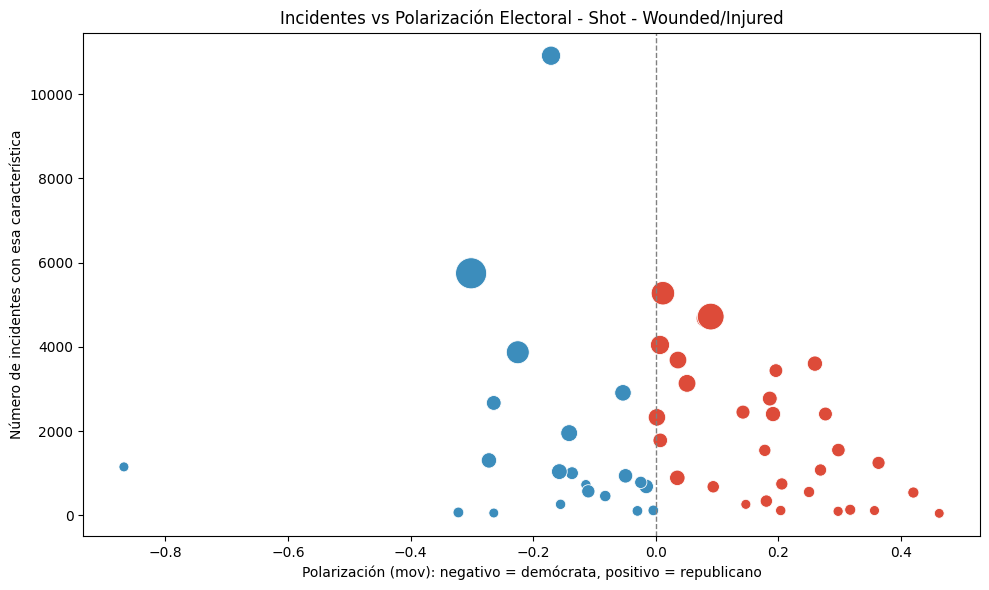

Generando gráfico para: Shot - Dead (murder, accidental, suicide)
Gráfico guardado como: scatter_Shot - Dead (murder, accidental, suicide)_20251119_232710.png


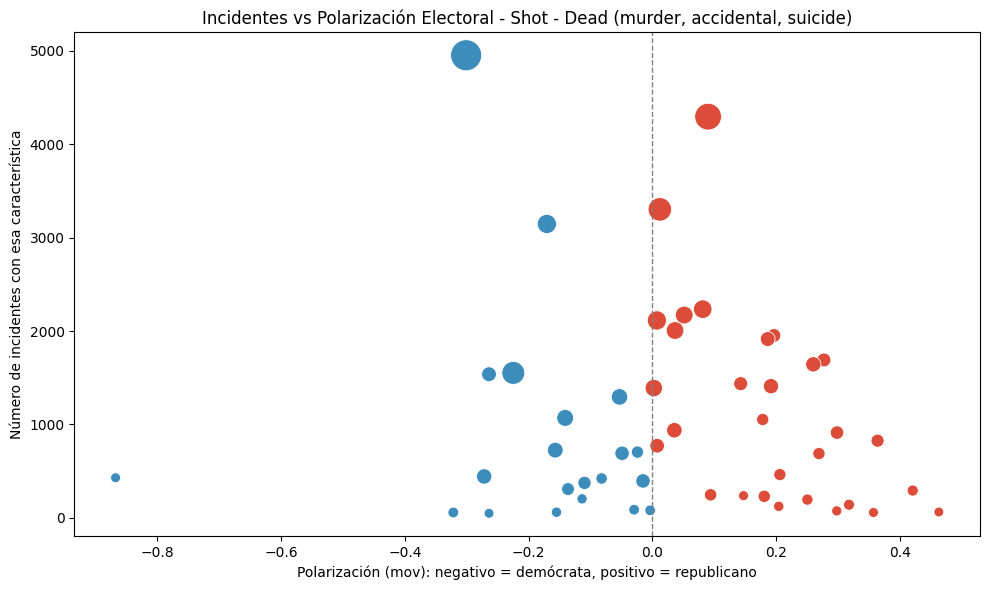

Generando gráfico para: Non-Shooting Incident
Gráfico guardado como: scatter_Non-Shooting Incident_20251119_232710.png


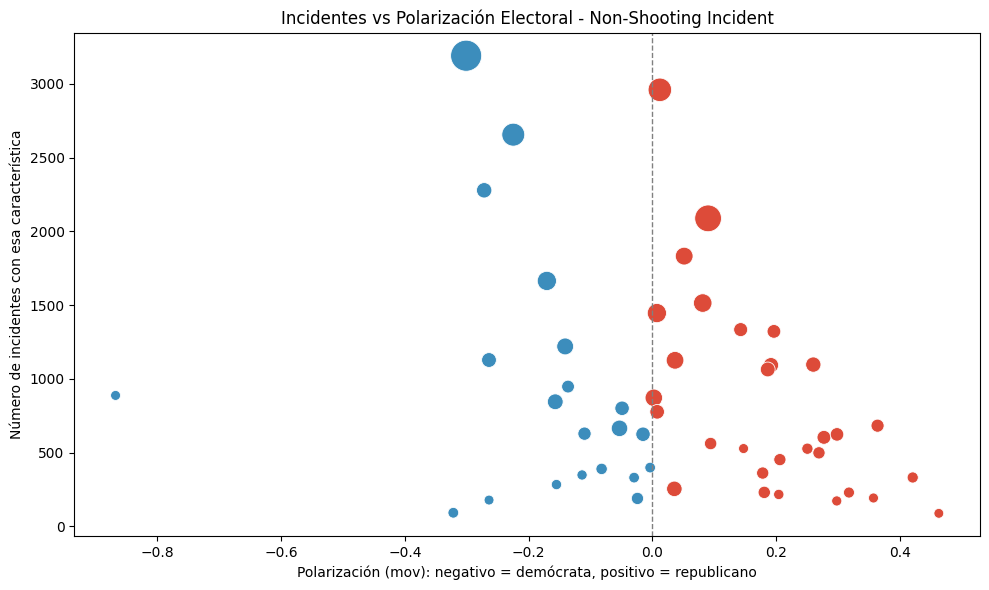

Generando gráfico para: Shots Fired - No Injuries
Gráfico guardado como: scatter_Shots Fired - No Injuries_20251119_232711.png


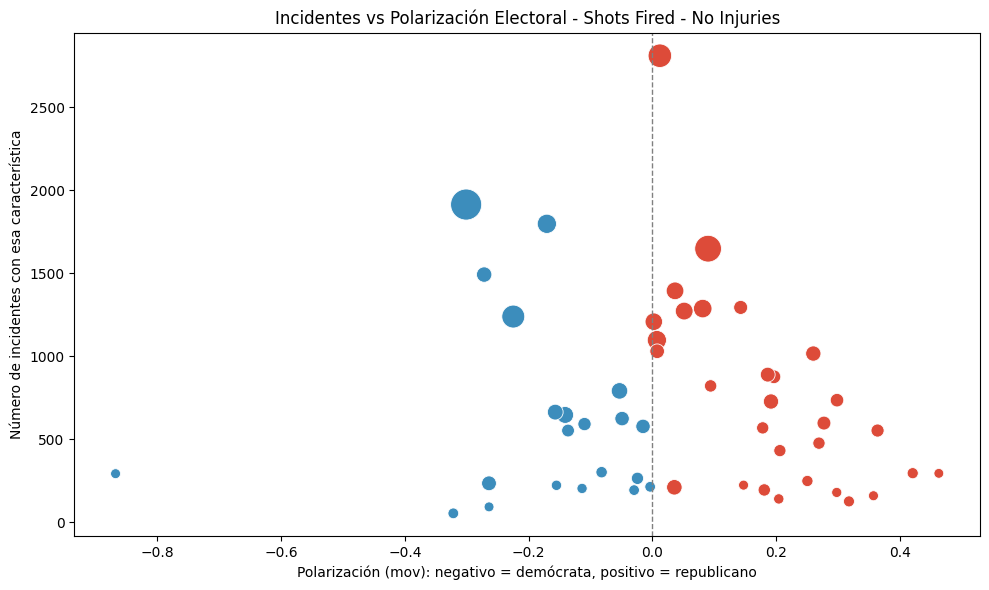

Generando gráfico para: Possession (gun(s) found during commission of other crimes)
Gráfico guardado como: scatter_Possession (gun(s) found during commission of othe_20251119_232711.png


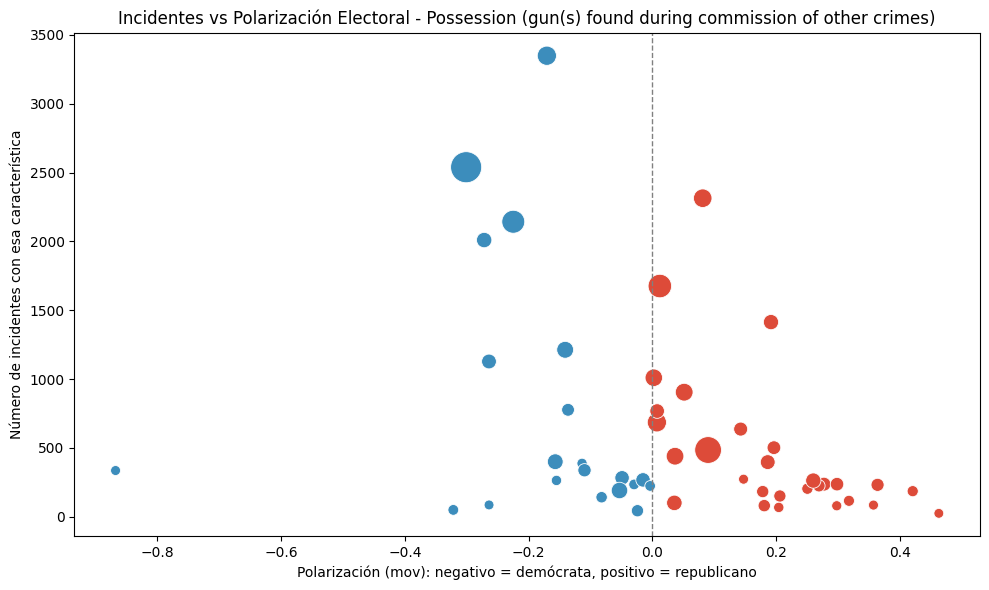

Generando gráfico para: Armed robbery with injury/death and/or evidence of DGU found
Gráfico guardado como: scatter_Armed robbery with injury_death and_or evidence of_20251119_232712.png


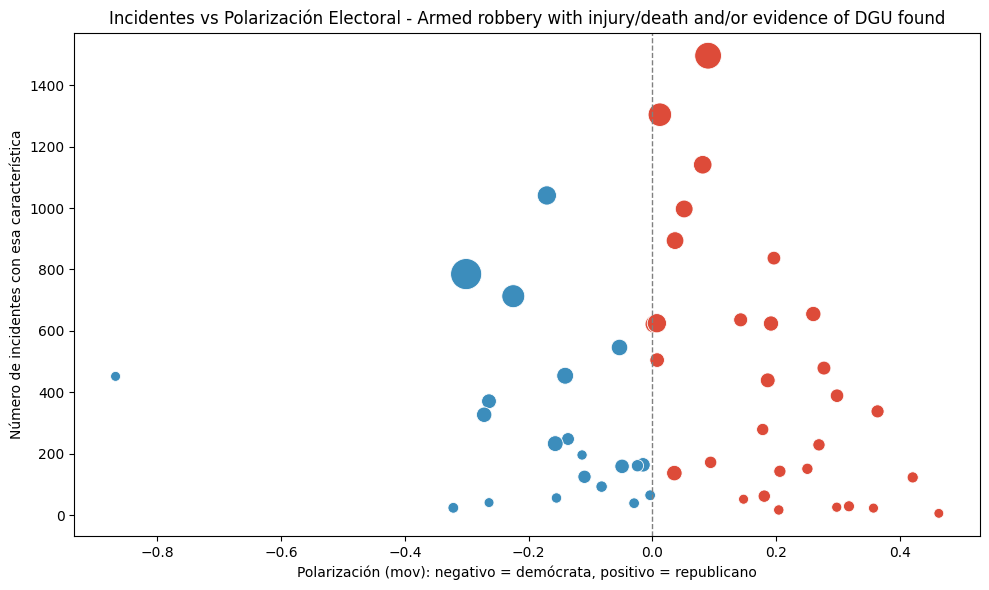

Generando gráfico para: Brandishing/flourishing/open carry/lost/found
Gráfico guardado como: scatter_Brandishing_flourishing_open carry_lost_found_20251119_232713.png


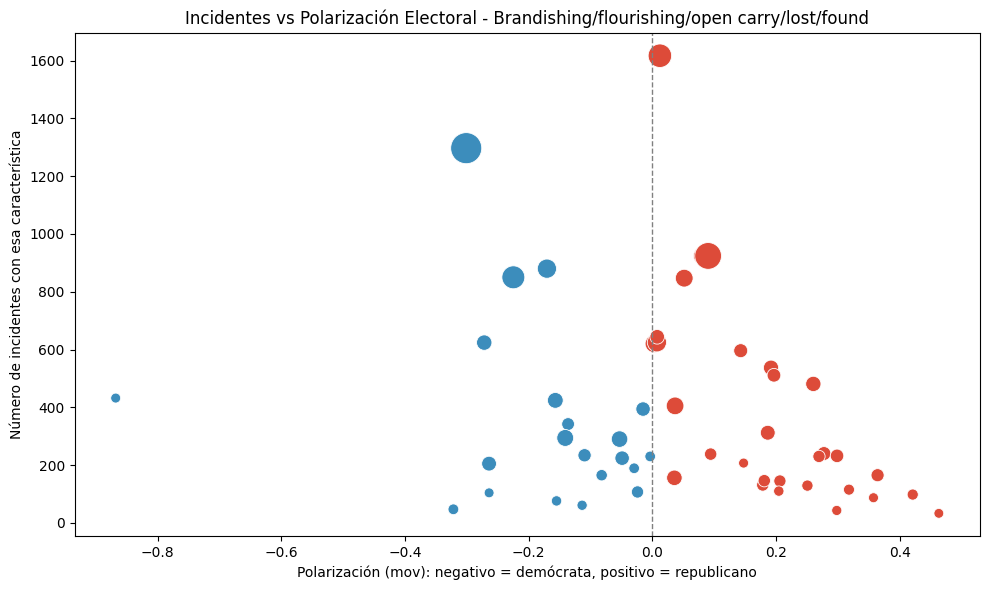

Generando gráfico para: ATF/LE Confiscation/Raid/Arrest
Gráfico guardado como: scatter_ATF_LE Confiscation_Raid_Arrest_20251119_232713.png


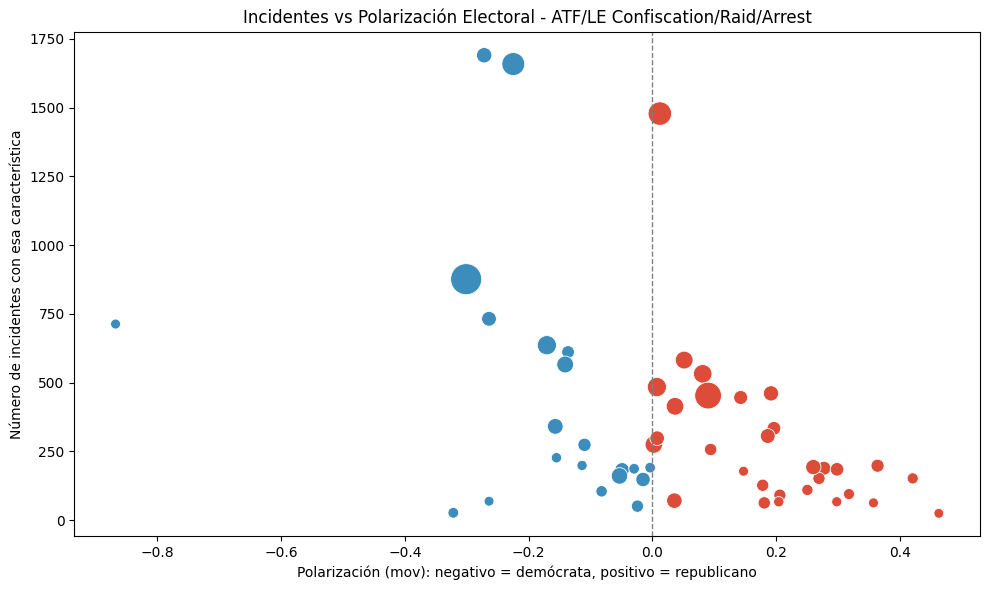

Generando gráfico para: Officer Involved Incident
Gráfico guardado como: scatter_Officer Involved Incident_20251119_232714.png


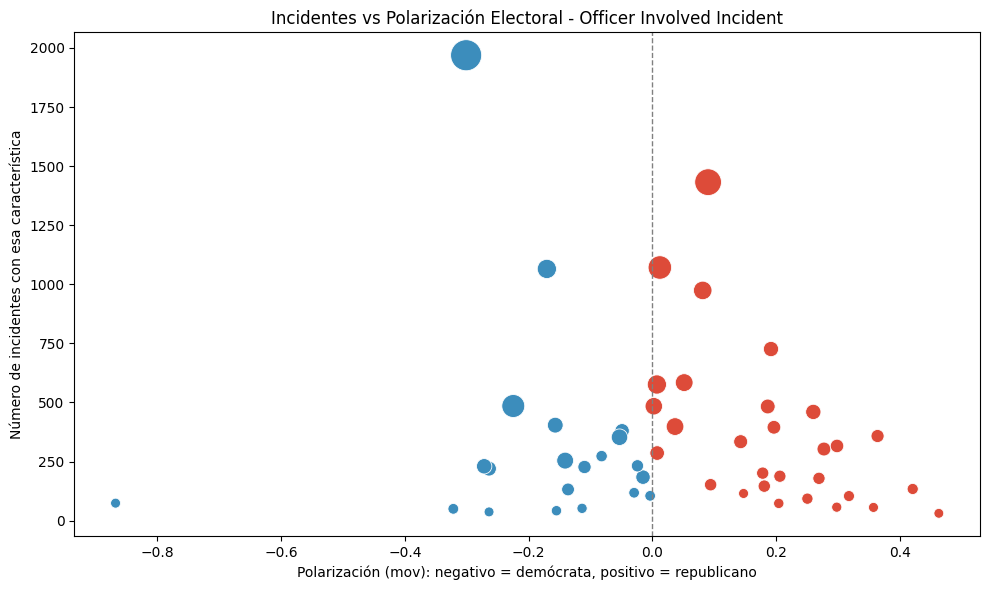

Generando gráfico para: Possession of gun by felon or prohibited person
Gráfico guardado como: scatter_Possession of gun by felon or prohibited person_20251119_232714.png


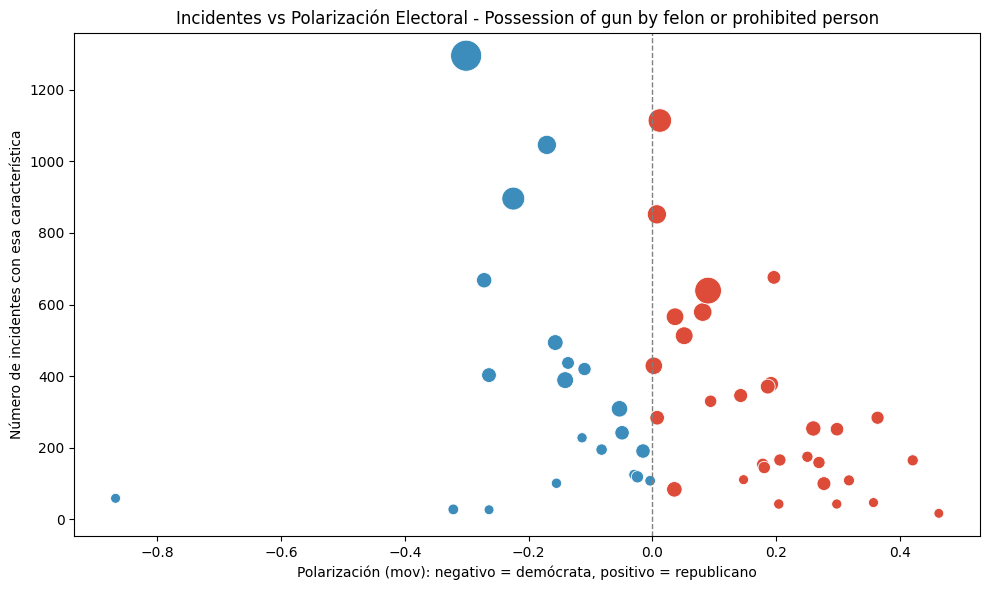

Generando gráfico para: Drug involvement
Gráfico guardado como: scatter_Drug involvement_20251119_232715.png


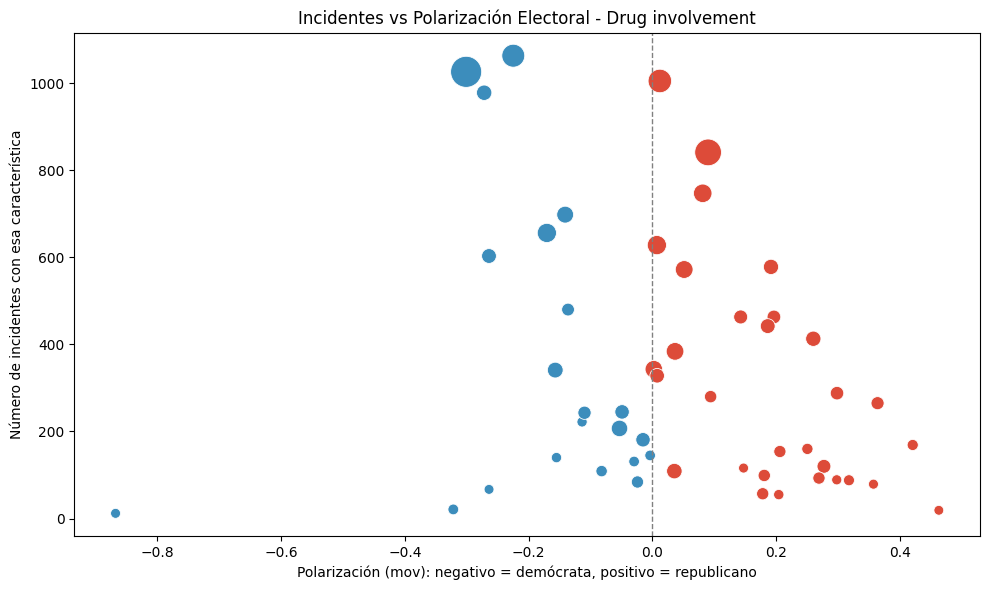

Generando gráfico para: Drive-by (car to street, car to car)
Gráfico guardado como: scatter_Drive-by (car to street, car to car)_20251119_232715.png


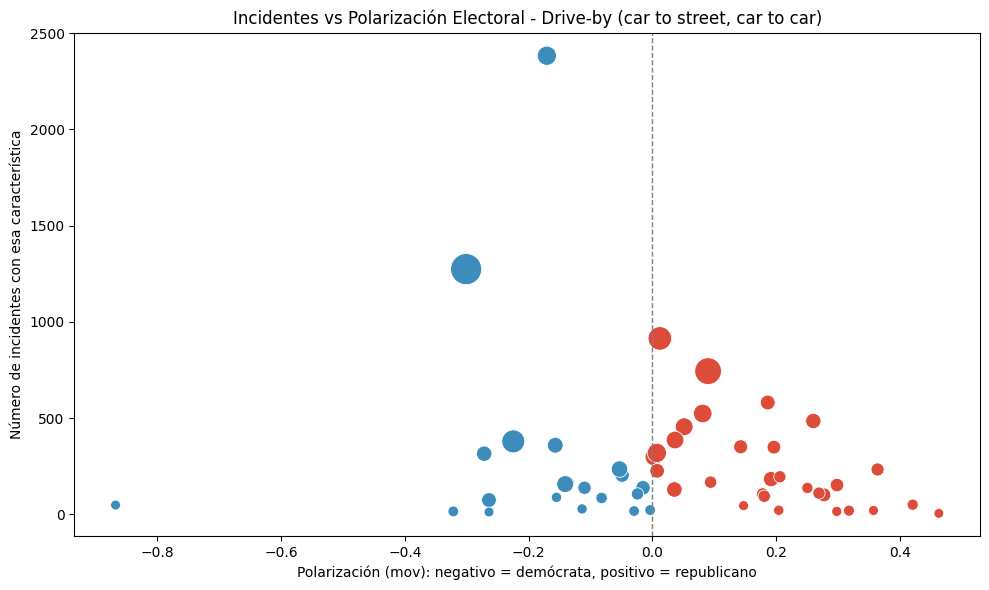

Generando gráfico para: Institution/Group/Business
Gráfico guardado como: scatter_Institution_Group_Business_20251119_232716.png


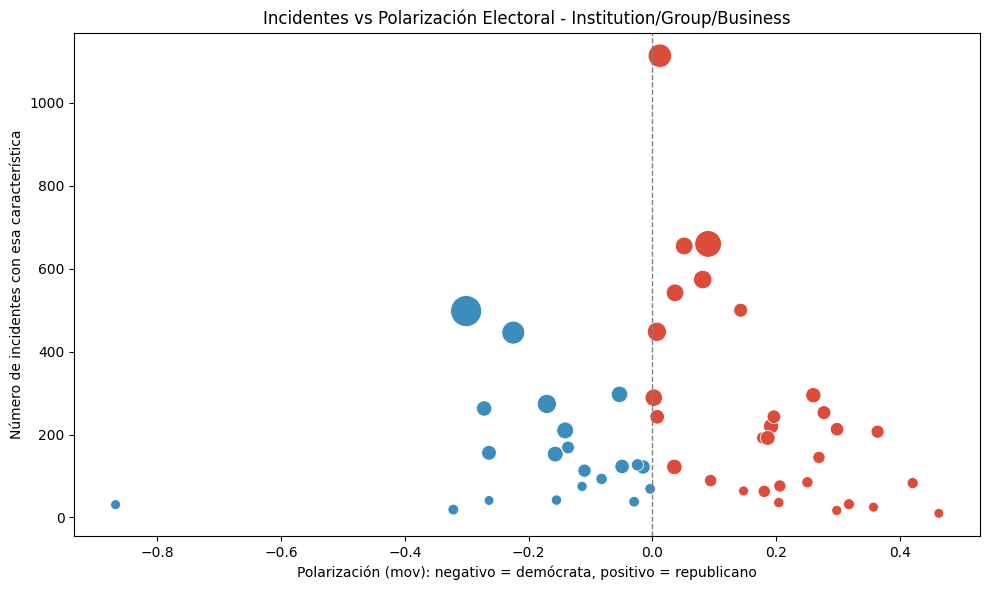

Generando gráfico para: Domestic Violence
Gráfico guardado como: scatter_Domestic Violence_20251119_232716.png


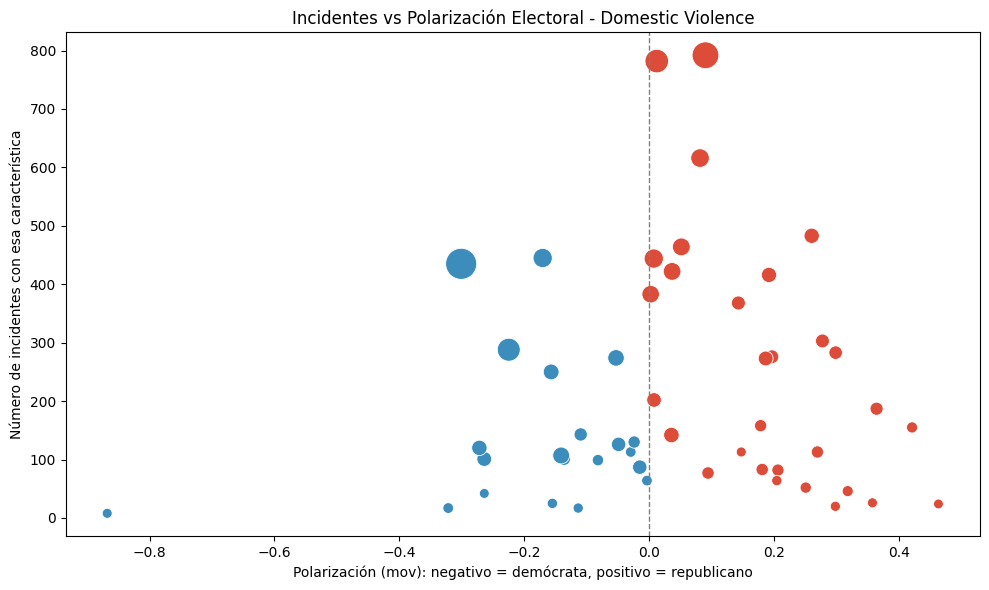

Generando gráfico para: Home Invasion
Gráfico guardado como: scatter_Home Invasion_20251119_232717.png


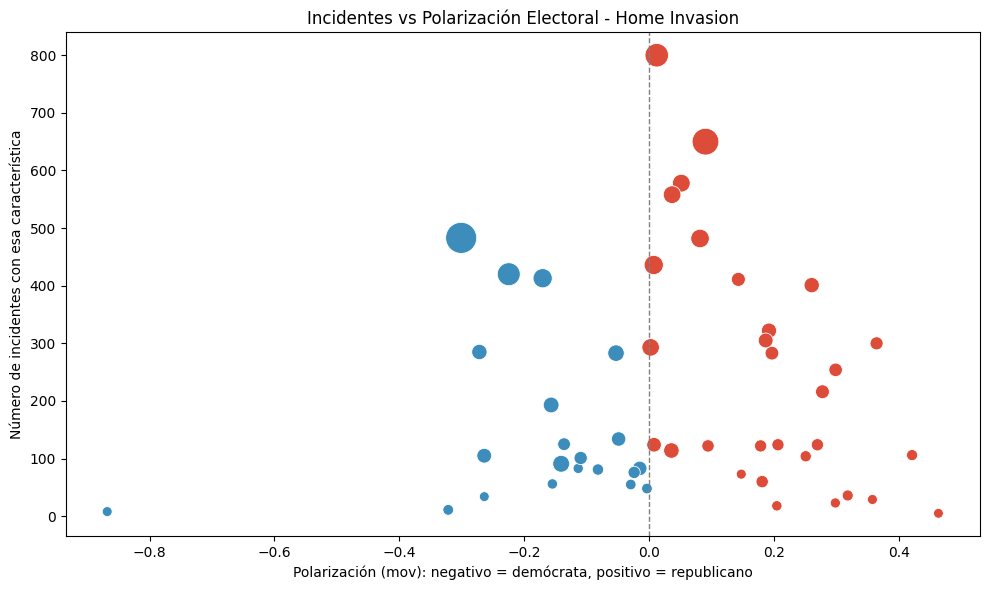

Generando gráfico para: Accidental Shooting
Gráfico guardado como: scatter_Accidental Shooting_20251119_232717.png


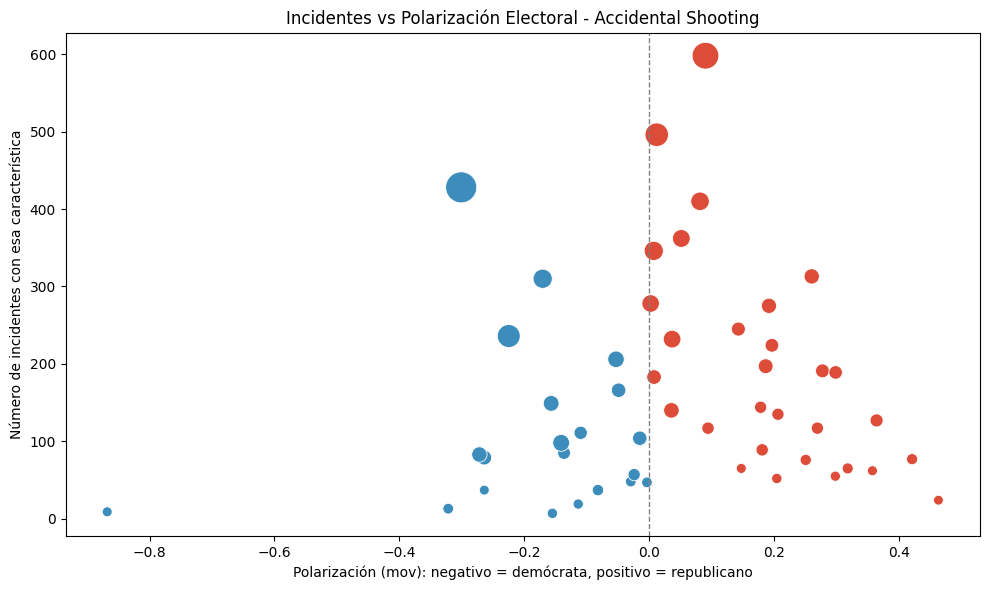

Generando gráfico para: Stolen/Illegally owned gun{s} recovered during arrest/warrant
Gráfico guardado como: scatter_Stolen_Illegally owned gun{s} recovered during arr_20251119_232718.png


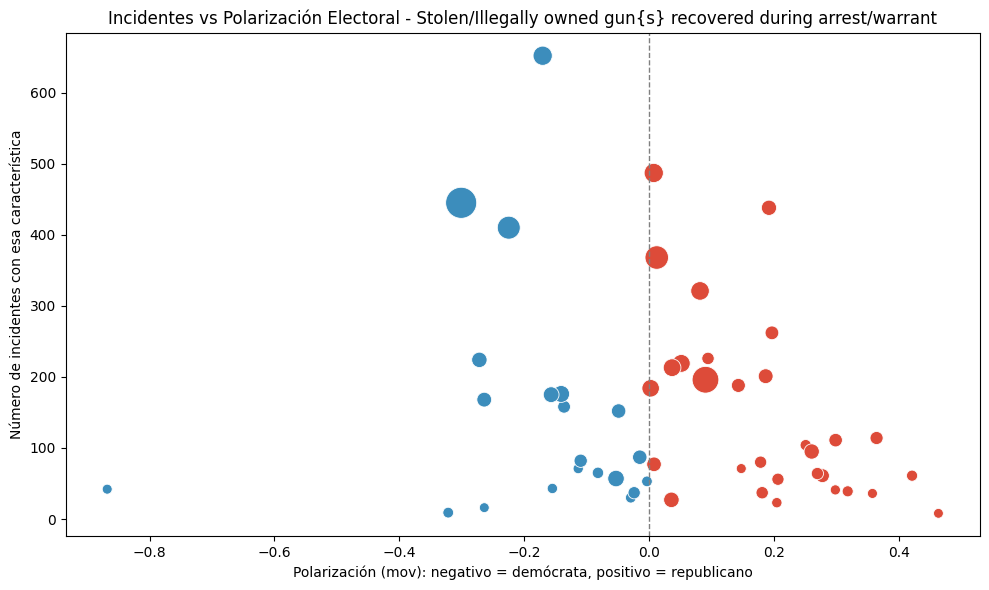

Generando gráfico para: Defensive Use
Gráfico guardado como: scatter_Defensive Use_20251119_232718.png


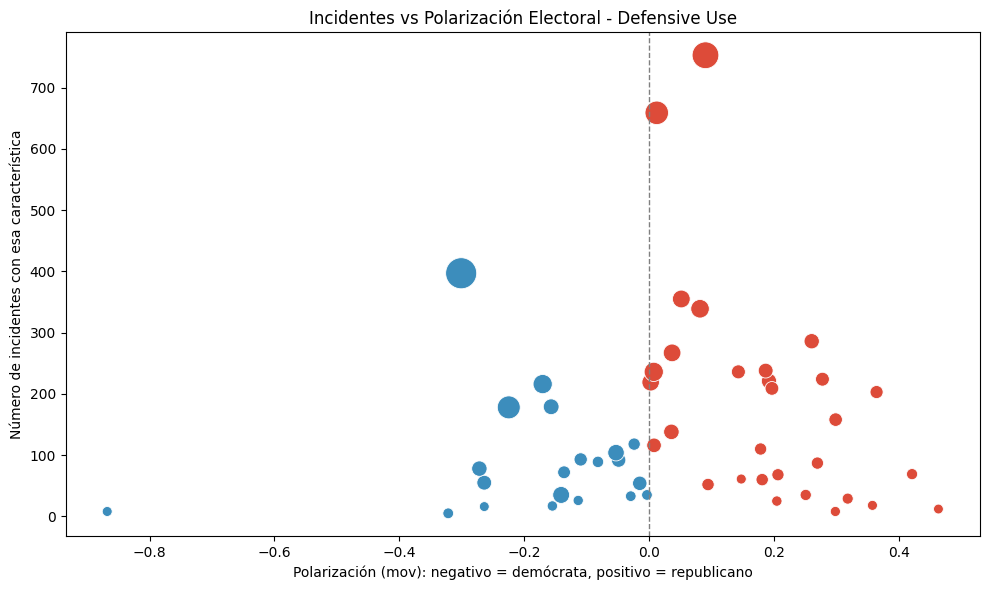

Generando gráfico para: Accidental/Negligent Discharge
Gráfico guardado como: scatter_Accidental_Negligent Discharge_20251119_232719.png


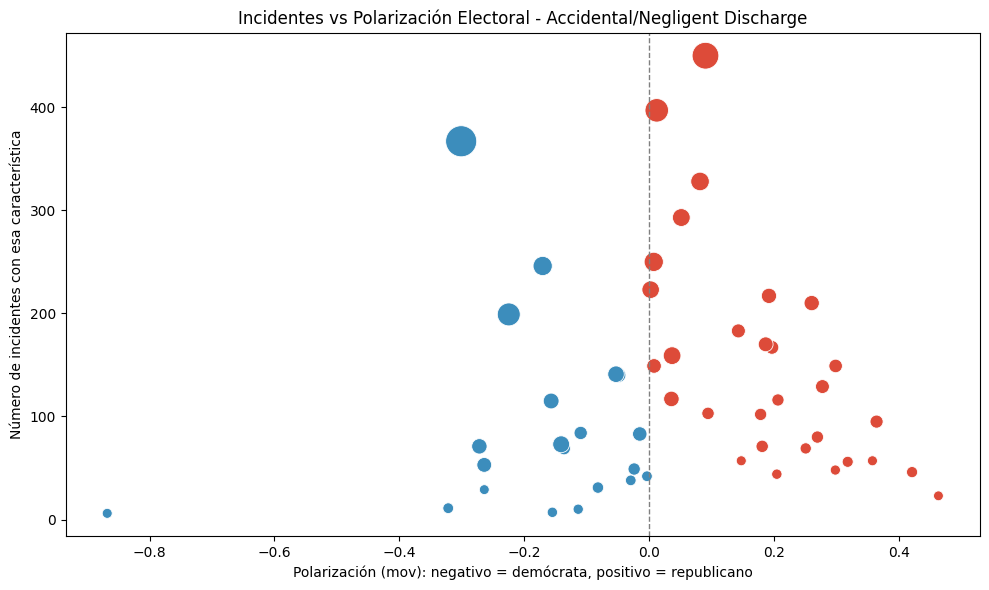

Generando gráfico para: Gun(s) stolen from owner
Gráfico guardado como: scatter_Gun(s) stolen from owner_20251119_232720.png


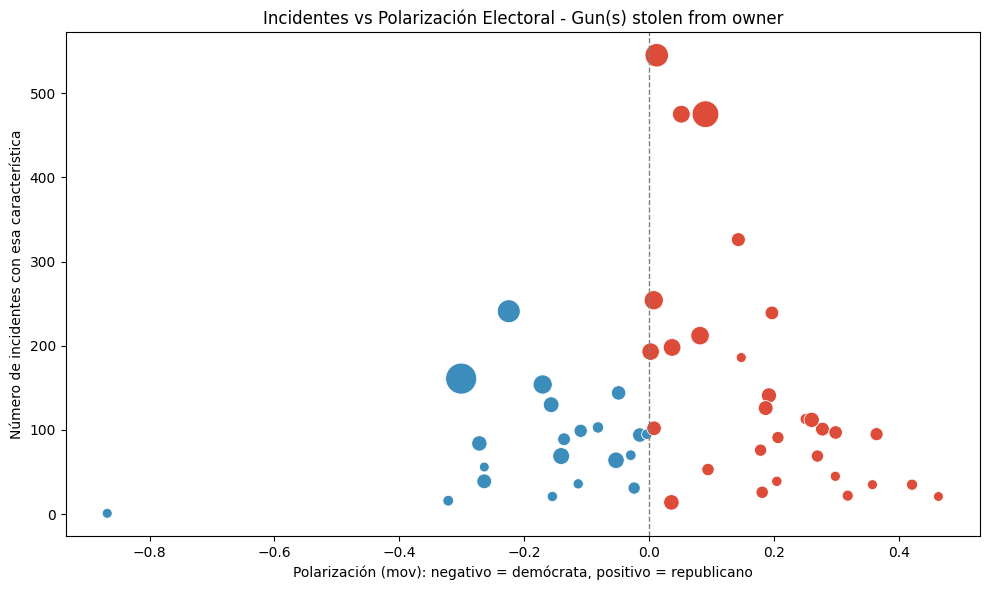

In [ ]:
for caracteristica in solo_caracteristicas:
    print(f"Generando gráfico para: {caracteristica}")

    # Filtrar incidentes con esa característica
    df_filtrado = df[df[caracteristica] == 1]

    # Agrupar por estado y contar incidentes
    incidents_by_state = df_filtrado.groupby("state").size().reset_index(name="incidents")

    # Merge con StatesPop para obtener mov y partido
    merged = incidents_by_state.merge(StatesPop, on="state", how="left")

    # Crear eje X: mov ajustado por partido
    merged["mov_signed"] = merged.apply(
        lambda row: row["mov"] if row["republican indicator"] == 1 else -row["mov"], axis=1
    )

    # Crear gráfico
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=merged,
        x="mov_signed",
        y="incidents",
        size="POPESTIMATE2017",  # opcional: tamaño por población
        hue="republican indicator",  # opcional: color por partido
        palette={0: "#3c8dbc", 1: "#dd4b39"},
        sizes=(50, 500),
        legend=False
    )

    plt.axvline(0, color="gray", linestyle="--", linewidth=1)
    plt.title(f"Incidentes vs Polarización Electoral - {caracteristica}")
    plt.xlabel("Polarización (mov): negativo = demócrata, positivo = republicano")
    plt.ylabel("Número de incidentes con esa característica")
    plt.tight_layout()

    # Guardar imagen
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"scatter_{clean_filename(caracteristica)}_{timestamp}.png"
    plt.savefig(filename, dpi=300)
    print(f"Gráfico guardado como: {filename}")
    plt.show()


In [ ]:
# %pip install plotly
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
# %pip install nbformat>=4.2
import nbformat

states_df = df['state'].value_counts()

statesdf = pd.DataFrame()
statesdf['state'] = states_df.index
statesdf['counts'] = states_df.values

# scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
#             [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

scl = [
    [0.0, 'rgb(255,255,178)'],   # amarillo claro
    [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
    [0.4, 'rgb(253,141,60)'],    # naranja
    [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
    [0.8, 'rgb(227,26,28)'],     # rojo intenso
    [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
]

state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = statesdf['state_code'],
        z = statesdf['counts'],
        locationmode = 'USA-states',
        text = statesdf['state'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Gun Violence Incidents")
        ) ]

layout = dict(
        title = 'Número de incidentes de violencia con armas de fuego por estado',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )

# data = [ dict(
#         type='choropleth',
#         colorscale = scl,
#         autocolorscale = False,
#         locations = statesdf['state_code'],
#         z = statesdf['counts'],
#         locationmode = 'USA-states',
#         text = statesdf['state'],
#         marker = dict(
#             line = dict (
#                 color = 'rgb(255,255,255)',
#                 width = 2
#             ) ),
#         colorbar = dict(
#             title = "Gun Violence Incidents")
#         ) ]

# layout = dict(
#         title = 'State wise number of Gun Violence Incidents',
#         geo = dict(
#             scope='usa',
#             projection=dict( type='albers usa' ),
#             showlakes = True,
#             lakecolor = 'rgb(255, 255, 255)'),
#              )

fig = dict( data=data, layout=layout )
iplot( fig, filename='d3-cloropleth-map' )

In [ ]:
# %pip install plotly
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
# %pip install nbformat>=4.2
import nbformat

states_df = incidentsByState.set_index("state")["Per100000"].sort_values(ascending=False)

print(states_df.head())

statesdf = pd.DataFrame()
statesdf['state'] = states_df.index
statesdf['counts'] = states_df.values

# scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
#             [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

scl = [
    [0.0, 'rgb(255,255,178)'],   # amarillo claro
    [0.2, 'rgb(254,204,92)'],    # amarillo-naranja
    [0.4, 'rgb(253,141,60)'],    # naranja
    [0.6, 'rgb(252,78,42)'],     # rojo anaranjado
    [0.8, 'rgb(227,26,28)'],     # rojo intenso
    [1.0, 'rgb(177,0,38)']       # rojo oscuro / marrón
]

state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
statesdf['state_code'] = statesdf['state'].apply(lambda x : state_to_code[x])

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = statesdf['state_code'],
        z = statesdf['counts'],
        locationmode = 'USA-states',
        text = statesdf['state'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Gun Violence Incidents")
        ) ]

layout = dict(
        title = 'Número cada 100000 habitantes de incidentes de violencia con armas de fuego por estado',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )

# data = [ dict(
#         type='choropleth',
#         colorscale = scl,
#         autocolorscale = False,
#         locations = statesdf['state_code'],
#         z = statesdf['counts'],
#         locationmode = 'USA-states',
#         text = statesdf['state'],
#         marker = dict(
#             line = dict (
#                 color = 'rgb(255,255,255)',
#                 width = 2
#             ) ),
#         colorbar = dict(
#             title = "Gun Violence Incidents")
#         ) ]

# layout = dict(
#         title = 'State wise number of Gun Violence Incidents',
#         geo = dict(
#             scope='usa',
#             projection=dict( type='albers usa' ),
#             showlakes = True,
#             lakecolor = 'rgb(255, 255, 255)'),
#              )

fig = dict( data=data, layout=layout )
iplot( fig, filename='d3-cloropleth-map' )

state
District of Columbia    460.0
Alaska                  182.0
Delaware                175.0
Louisiana               173.0
South Carolina          138.0
Name: Per100000, dtype: float64


In [ ]:
def clean_filename(name):
    cleaned = re.sub(r'[<>:"/\\|?*]', '_', name)
    if len(cleaned) > 50:
        cleaned = cleaned[:50]
    return cleaned.strip()

In [ ]:
def grafica_barras(the_df, caracteristica_nombre=""):
    # Crear nombre base para los archivos
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    if caracteristica_nombre:
        clean_name = clean_filename(caracteristica_nombre)
        base_filename = f"bar_{clean_name}_{timestamp}"
    else:
        base_filename = f"bar_general_{timestamp}"

    # 1. Agrupar el DataFrame de incidentes por estado
    incidentsByState = the_df.groupby("state").size().reset_index(name="stateIncidents")

    # 2. Merge con población
    incidentsByState = incidentsByState.merge(StatesPop, on="state", how="left")

    # 3. Calcular tasa por 100,000 habitantes
    incidentsByState["incidents_per_k"] = round(
        (incidentsByState["stateIncidents"] / incidentsByState["POPESTIMATE2017"]) * 100000, 2
    )

    # 4. Ordenar y seleccionar top 50 estados
    tempdf = incidentsByState.sort_values("incidents_per_k", ascending=False).head(50)

    # 5. Crear gráfica de barras
    trace1 = go.Bar(
        x=tempdf["state"],
        y=tempdf["incidents_per_k"],
        name=caracteristica_nombre,
        orientation='v',
        marker=dict(color='red'),
        opacity=0.7
    )

    data = [trace1]
    layout = go.Layout(
        height=400,
        margin=dict(b=150),
        barmode='group',
        legend=dict(x=-.1, y=1.2),
        title=f'Incidentes por 100,000 habitantes - {caracteristica_nombre}'
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig, filename='grouped-bar')

    # Guardar como PNG
    filename = f"{base_filename}.png"
    pio.write_image(fig, filename, scale=2, width=1200, height=800)
    print(f"Gráfica guardada como: {filename}")
    print(f"Procesada característica: {caracteristica_nombre} - {len(the_df)} incidentes")
    print("-" * 50)


# Bucle para todas las características
for caracteristica in solo_caracteristicas:
    print(f"Generando gráfica de barras para: {caracteristica}")
    df_filtrado = df[df[caracteristica] == 1]
    grafica_barras(df_filtrado, caracteristica)


Generando gráfica de barras para: Shot - Wounded/Injured


Gráfica guardada como: bar_Shot - Wounded_Injured_20251119_003014.png
Procesada característica: Shot - Wounded/Injured - 93926 incidentes
--------------------------------------------------
Generando gráfica de barras para: Shot - Dead (murder, accidental, suicide)


Gráfica guardada como: bar_Shot - Dead (murder, accidental, suicide)_20251119_003017.png
Procesada característica: Shot - Dead (murder, accidental, suicide) - 53409 incidentes
--------------------------------------------------
Generando gráfica de barras para: Non-Shooting Incident


Gráfica guardada como: bar_Non-Shooting Incident_20251119_003019.png
Procesada característica: Non-Shooting Incident - 44837 incidentes
--------------------------------------------------
Generando gráfica de barras para: Shots Fired - No Injuries


Gráfica guardada como: bar_Shots Fired - No Injuries_20251119_003021.png
Procesada característica: Shots Fired - No Injuries - 35750 incidentes
--------------------------------------------------
Generando gráfica de barras para: Possession (gun(s) found during commission of other crimes)


Gráfica guardada como: bar_Possession (gun(s) found during commission of othe_20251119_003023.png
Procesada característica: Possession (gun(s) found during commission of other crimes) - 30863 incidentes
--------------------------------------------------
Generando gráfica de barras para: Armed robbery with injury/death and/or evidence of DGU found


Gráfica guardada como: bar_Armed robbery with injury_death and_or evidence of_20251119_003025.png
Procesada característica: Armed robbery with injury/death and/or evidence of DGU found - 19723 incidentes
--------------------------------------------------
Generando gráfica de barras para: Brandishing/flourishing/open carry/lost/found


Gráfica guardada como: bar_Brandishing_flourishing_open carry_lost_found_20251119_003028.png
Procesada característica: Brandishing/flourishing/open carry/lost/found - 19017 incidentes
--------------------------------------------------
Generando gráfica de barras para: ATF/LE Confiscation/Raid/Arrest


Gráfica guardada como: bar_ATF_LE Confiscation_Raid_Arrest_20251119_003030.png
Procesada característica: ATF/LE Confiscation/Raid/Arrest - 17991 incidentes
--------------------------------------------------
Generando gráfica de barras para: Officer Involved Incident


Gráfica guardada como: bar_Officer Involved Incident_20251119_003032.png
Procesada característica: Officer Involved Incident - 17988 incidentes
--------------------------------------------------
Generando gráfica de barras para: Possession of gun by felon or prohibited person


Gráfica guardada como: bar_Possession of gun by felon or prohibited person_20251119_003034.png
Procesada característica: Possession of gun by felon or prohibited person - 17165 incidentes
--------------------------------------------------
Generando gráfica de barras para: Drug involvement


Gráfica guardada como: bar_Drug involvement_20251119_003036.png
Procesada característica: Drug involvement - 17099 incidentes
--------------------------------------------------
Generando gráfica de barras para: Drive-by (car to street, car to car)


Gráfica guardada como: bar_Drive-by (car to street, car to car)_20251119_003039.png
Procesada característica: Drive-by (car to street, car to car) - 13655 incidentes
--------------------------------------------------
Generando gráfica de barras para: Institution/Group/Business


Gráfica guardada como: bar_Institution_Group_Business_20251119_003041.png
Procesada característica: Institution/Group/Business - 11046 incidentes
--------------------------------------------------
Generando gráfica de barras para: Domestic Violence


Gráfica guardada como: bar_Domestic Violence_20251119_003043.png
Procesada característica: Domestic Violence - 10841 incidentes
--------------------------------------------------
Generando gráfica de barras para: Home Invasion


Gráfica guardada como: bar_Home Invasion_20251119_003045.png
Procesada característica: Home Invasion - 10641 incidentes
--------------------------------------------------
Generando gráfica de barras para: Accidental Shooting


Gráfica guardada como: bar_Accidental Shooting_20251119_003047.png
Procesada característica: Accidental Shooting - 8213 incidentes
--------------------------------------------------
Generando gráfica de barras para: Stolen/Illegally owned gun{s} recovered during arrest/warrant


Gráfica guardada como: bar_Stolen_Illegally owned gun{s} recovered during arr_20251119_003049.png
Procesada característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant - 7560 incidentes
--------------------------------------------------
Generando gráfica de barras para: Defensive Use


Gráfica guardada como: bar_Defensive Use_20251119_003051.png
Procesada característica: Defensive Use - 7391 incidentes
--------------------------------------------------
Generando gráfica de barras para: Accidental/Negligent Discharge


Gráfica guardada como: bar_Accidental_Negligent Discharge_20251119_003054.png
Procesada característica: Accidental/Negligent Discharge - 6422 incidentes
--------------------------------------------------
Generando gráfica de barras para: Gun(s) stolen from owner


Gráfica guardada como: bar_Gun(s) stolen from owner_20251119_003056.png
Procesada característica: Gun(s) stolen from owner - 6313 incidentes
--------------------------------------------------


=== Procesando ratio: incidents_population_ratio ===
   Generando gráfica para característica: Shot - Wounded/Injured
Gráfica guardada como: bar_incidents_population_ratio_20251119_004910.png


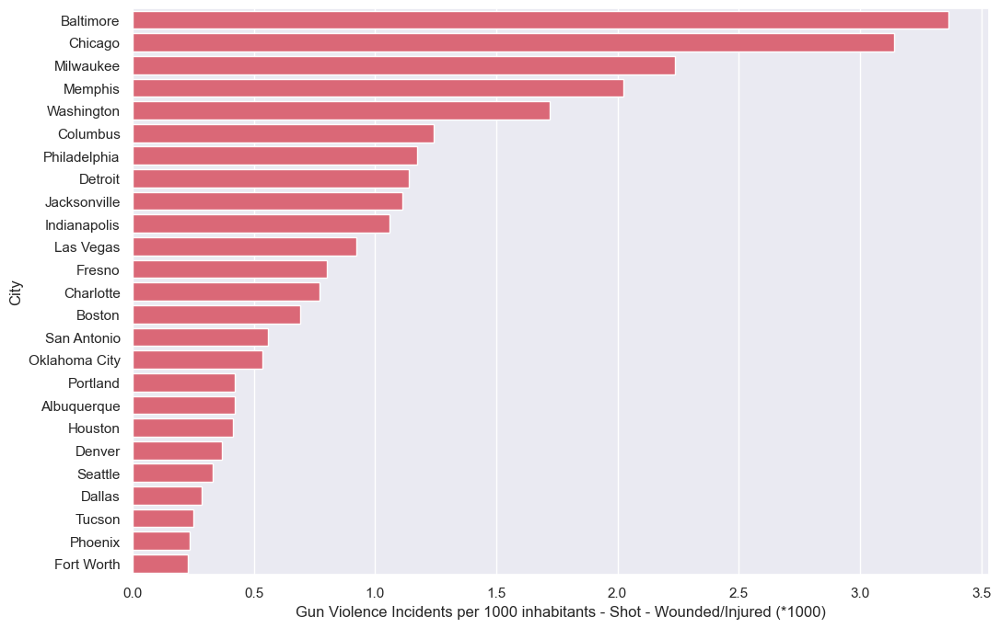

   Generando gráfica para característica: Shot - Dead (murder, accidental, suicide)
Gráfica guardada como: bar_incidents_population_ratio_20251119_004911.png


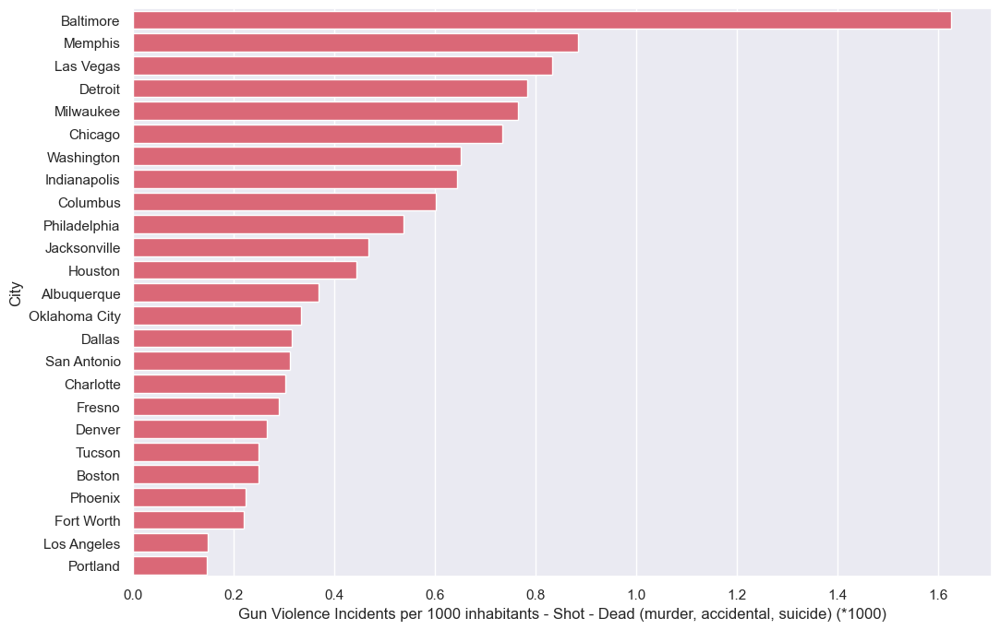

   Generando gráfica para característica: Non-Shooting Incident
Gráfica guardada como: bar_incidents_population_ratio_20251119_004912.png


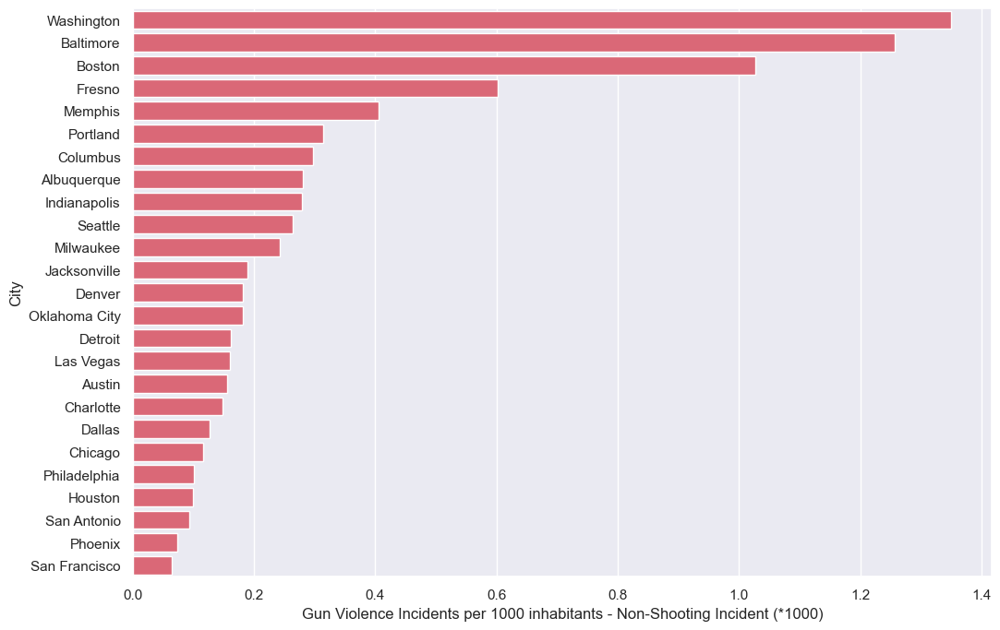

   Generando gráfica para característica: Shots Fired - No Injuries
Gráfica guardada como: bar_incidents_population_ratio_20251119_004913.png


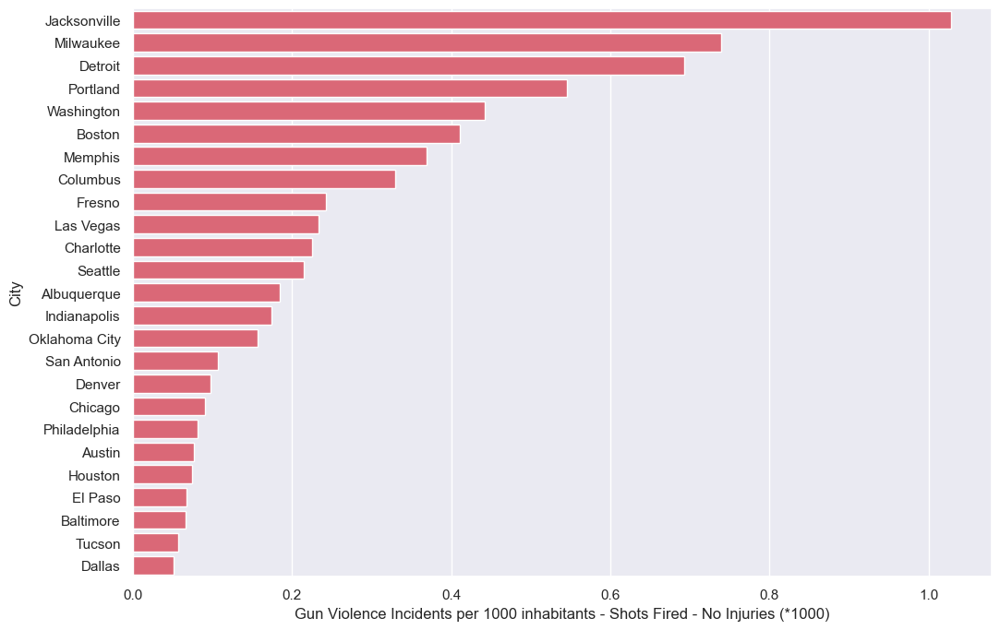

   Generando gráfica para característica: Possession (gun(s) found during commission of other crimes)
Gráfica guardada como: bar_incidents_population_ratio_20251119_004913.png


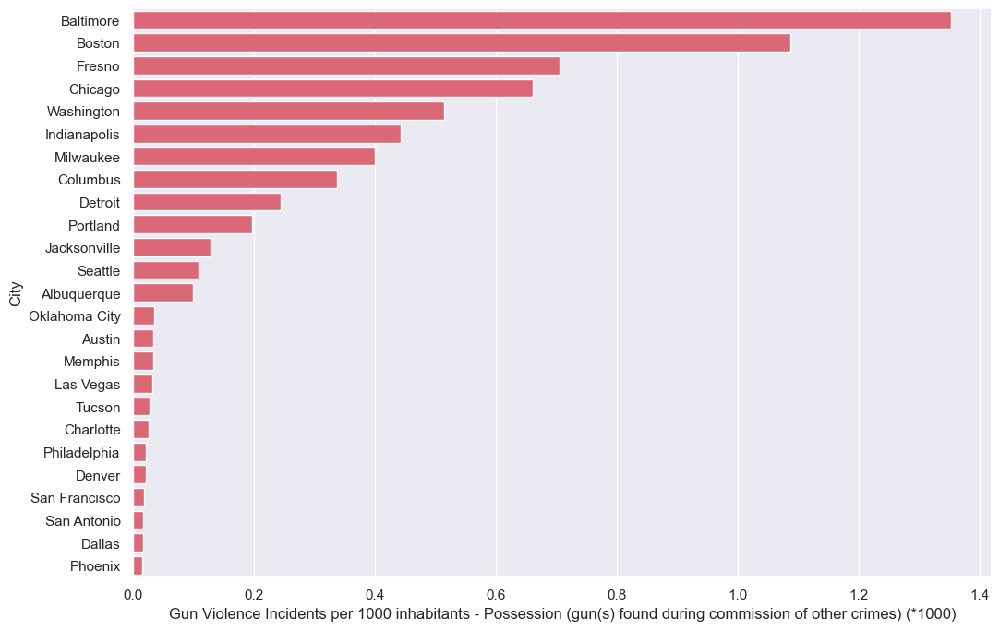

   Generando gráfica para característica: Armed robbery with injury/death and/or evidence of DGU found
Gráfica guardada como: bar_incidents_population_ratio_20251119_004914.png


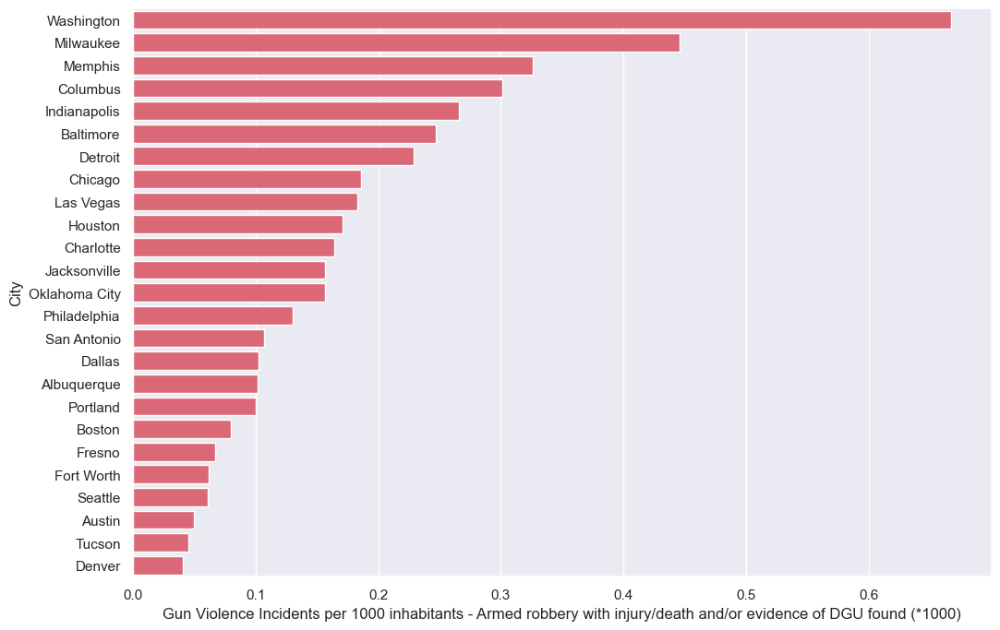

   Generando gráfica para característica: Brandishing/flourishing/open carry/lost/found
Gráfica guardada como: bar_incidents_population_ratio_20251119_004915.png


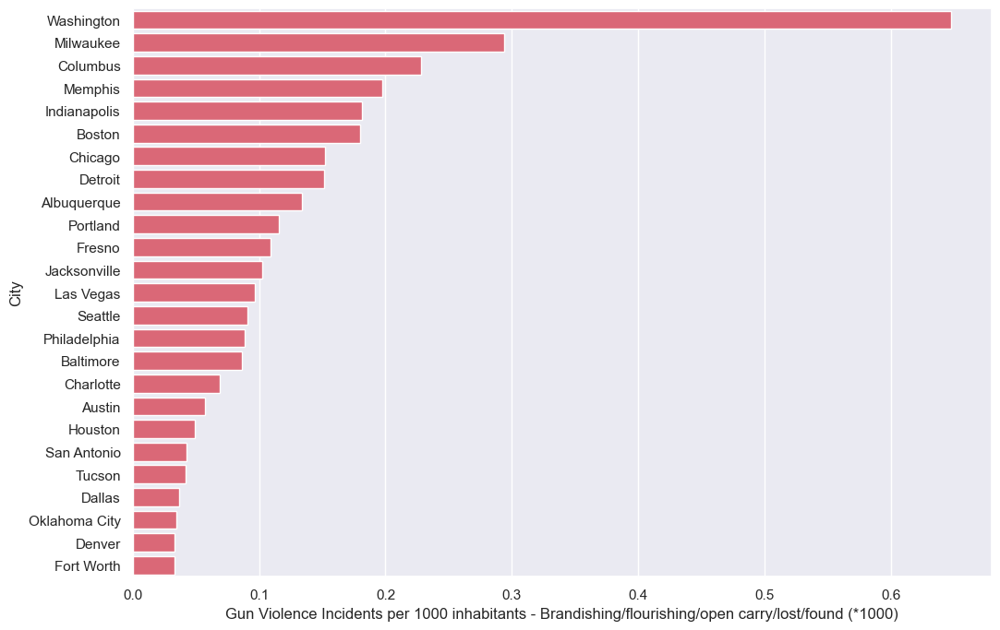

   Generando gráfica para característica: ATF/LE Confiscation/Raid/Arrest
Gráfica guardada como: bar_incidents_population_ratio_20251119_004915.png


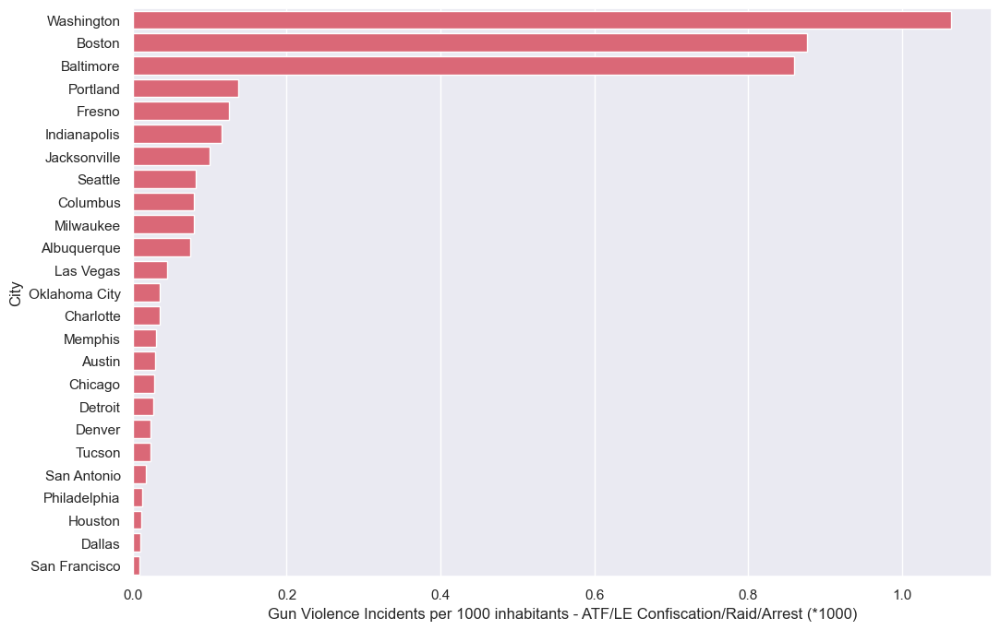

   Generando gráfica para característica: Officer Involved Incident
Gráfica guardada como: bar_incidents_population_ratio_20251119_004916.png


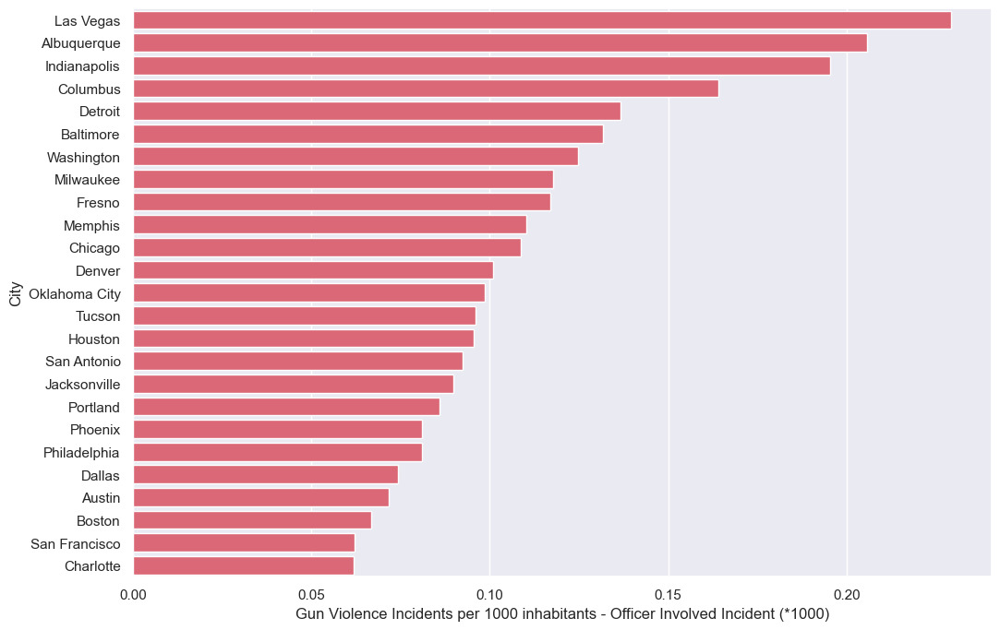

   Generando gráfica para característica: Possession of gun by felon or prohibited person
Gráfica guardada como: bar_incidents_population_ratio_20251119_004917.png


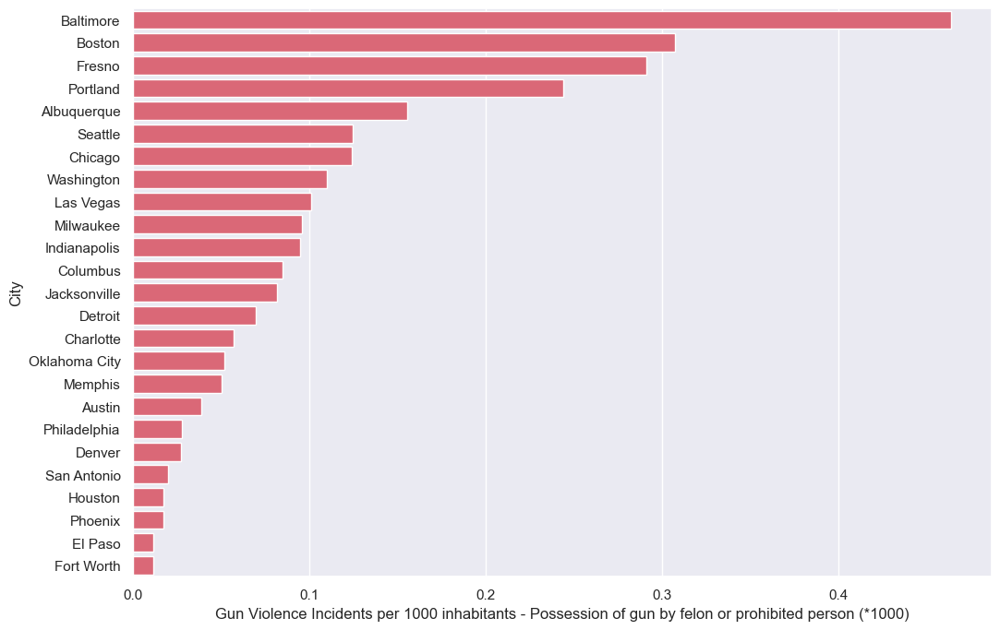

   Generando gráfica para característica: Drug involvement
Gráfica guardada como: bar_incidents_population_ratio_20251119_004918.png


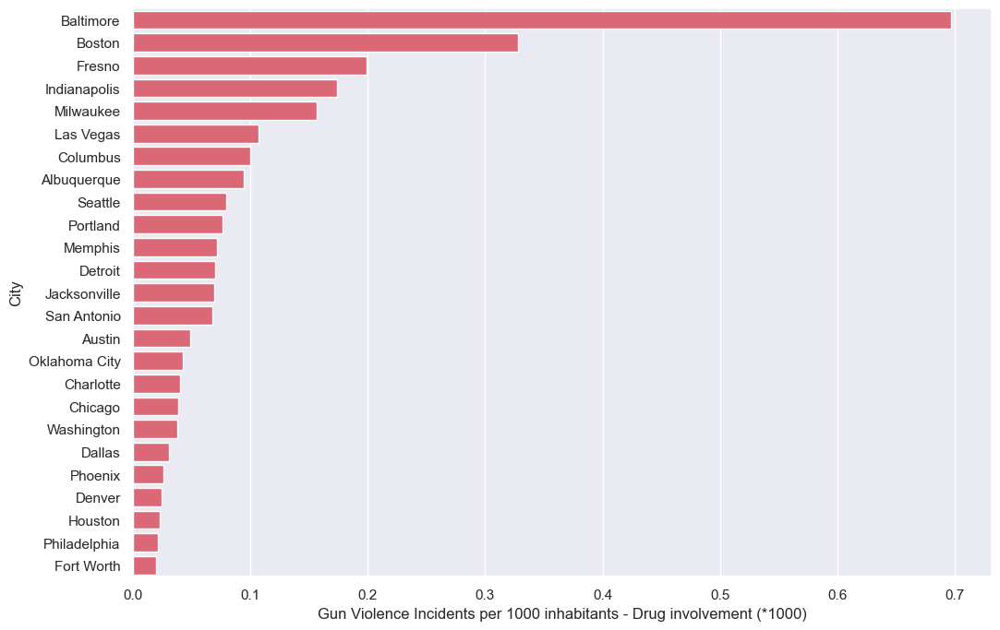

   Generando gráfica para característica: Drive-by (car to street, car to car)
Gráfica guardada como: bar_incidents_population_ratio_20251119_004918.png


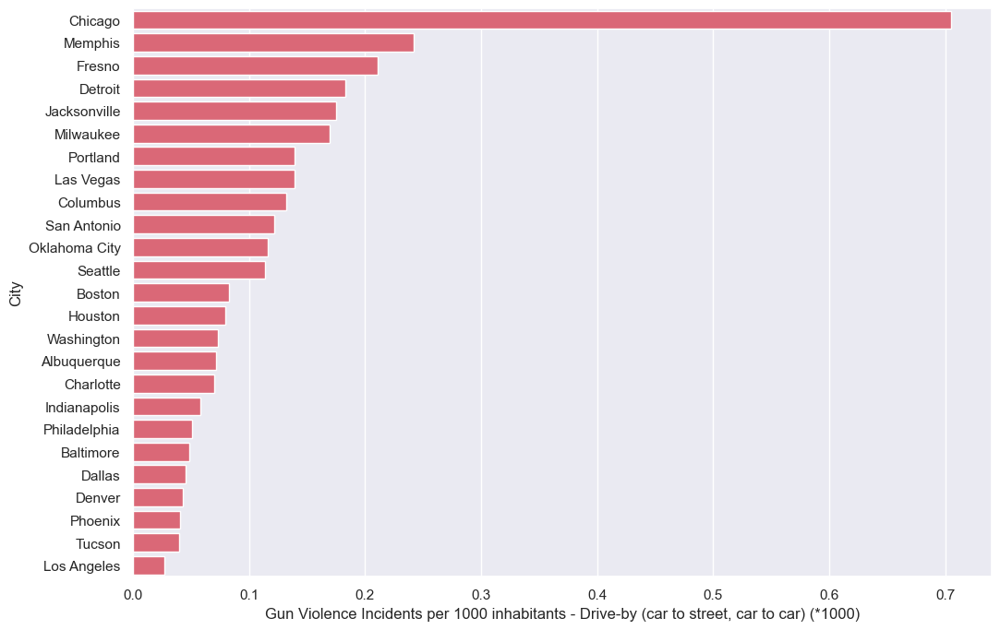

   Generando gráfica para característica: Institution/Group/Business
Gráfica guardada como: bar_incidents_population_ratio_20251119_004919.png


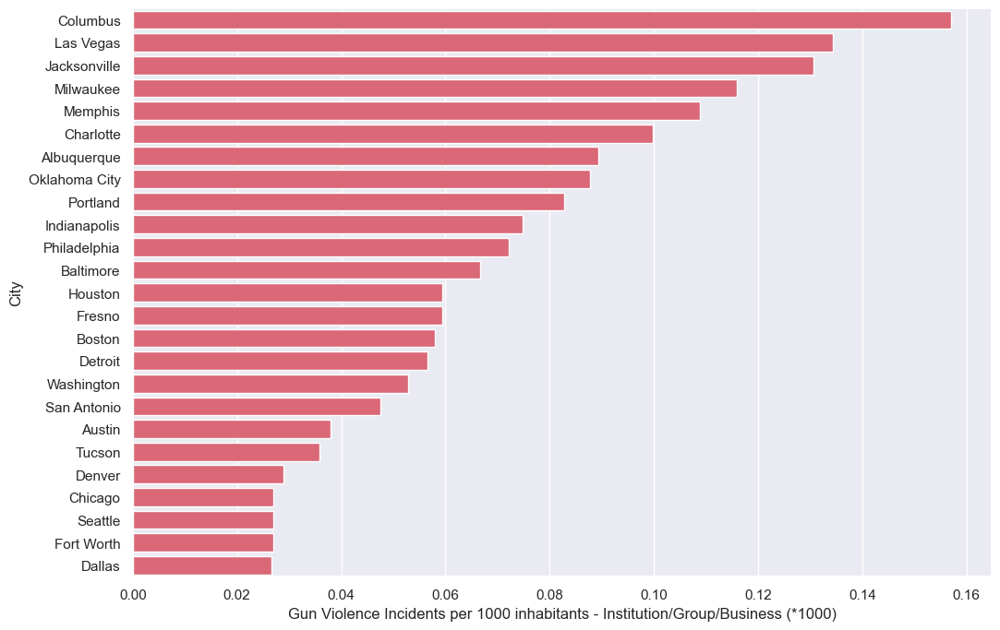

   Generando gráfica para característica: Domestic Violence
Gráfica guardada como: bar_incidents_population_ratio_20251119_004920.png


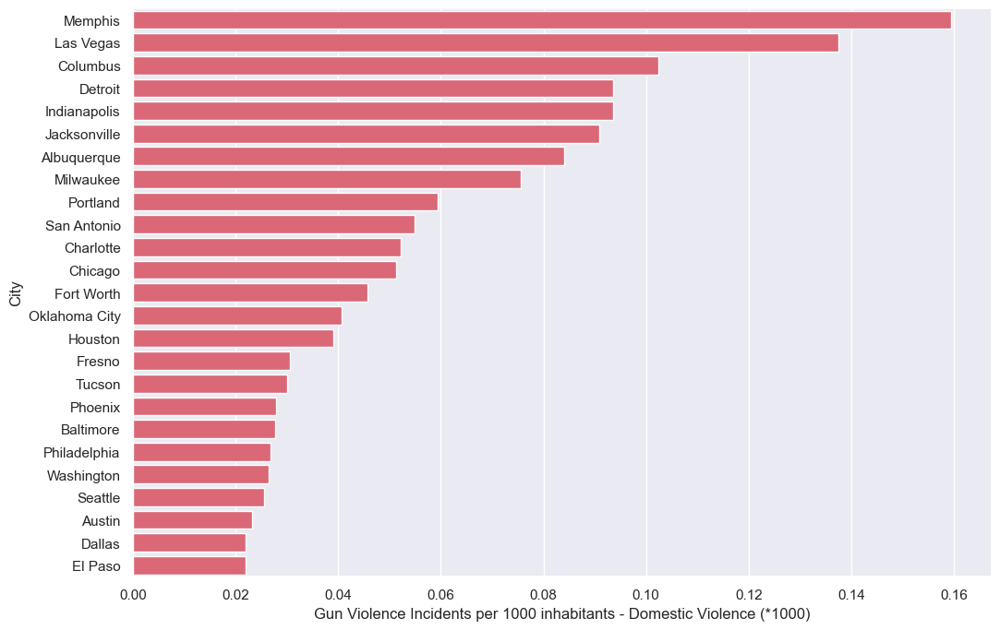

   Generando gráfica para característica: Home Invasion
Gráfica guardada como: bar_incidents_population_ratio_20251119_004921.png


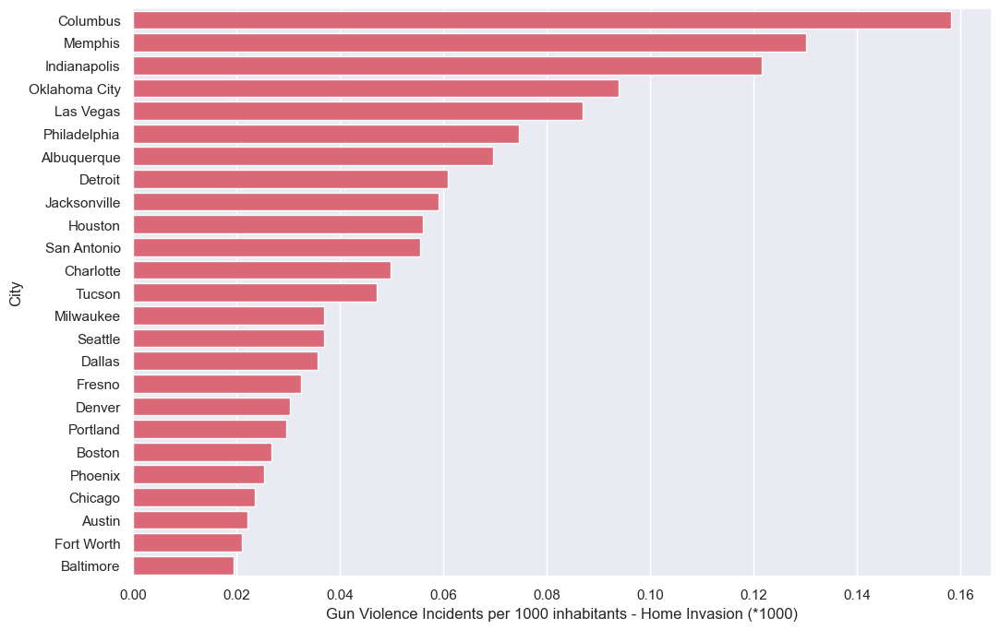

   Generando gráfica para característica: Accidental Shooting
Gráfica guardada como: bar_incidents_population_ratio_20251119_004922.png


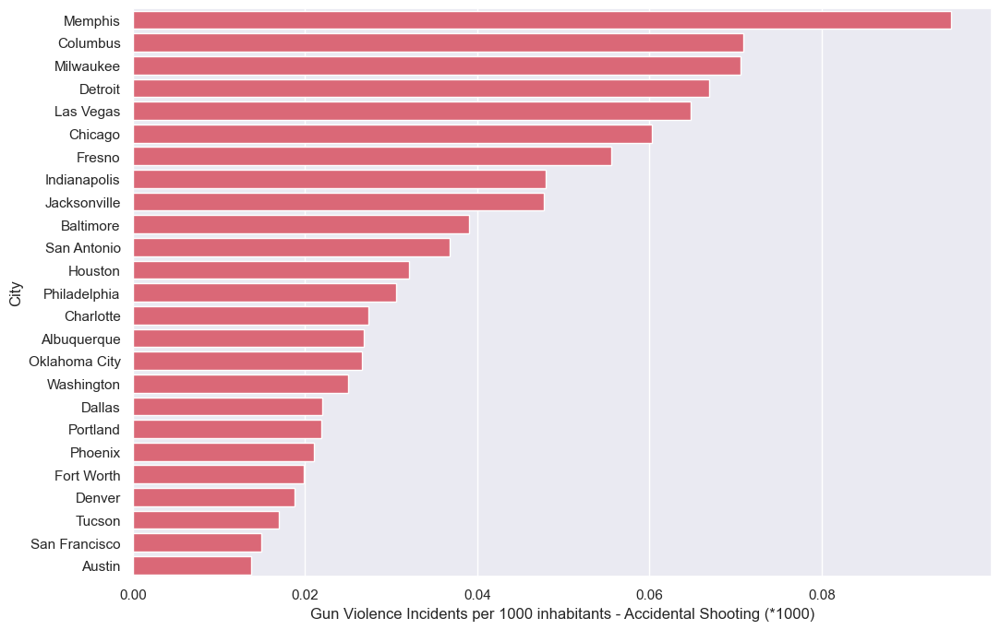

   Generando gráfica para característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant
Gráfica guardada como: bar_incidents_population_ratio_20251119_004922.png


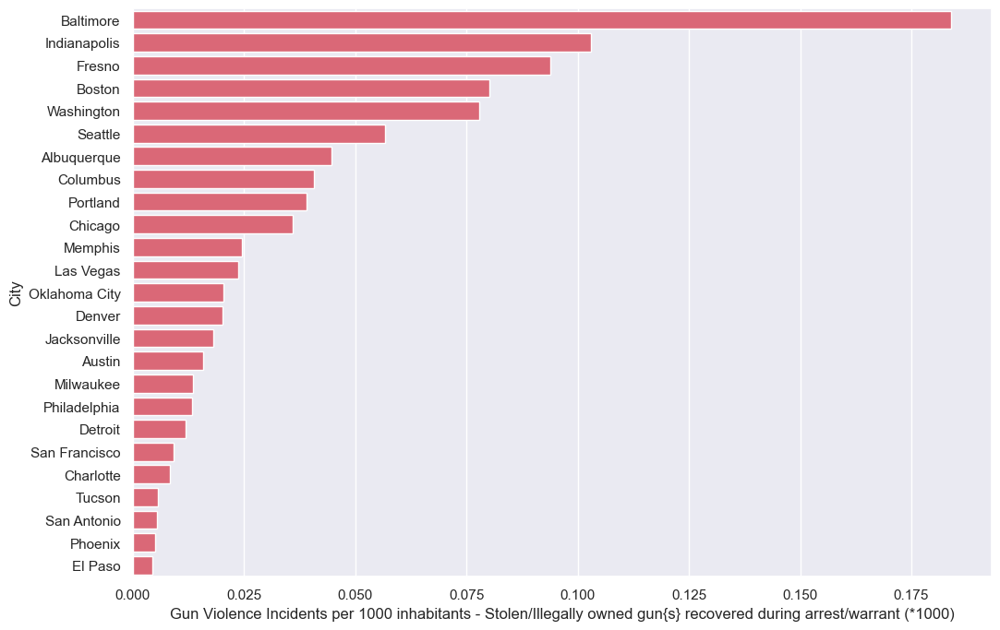

   Generando gráfica para característica: Defensive Use
Gráfica guardada como: bar_incidents_population_ratio_20251119_004923.png


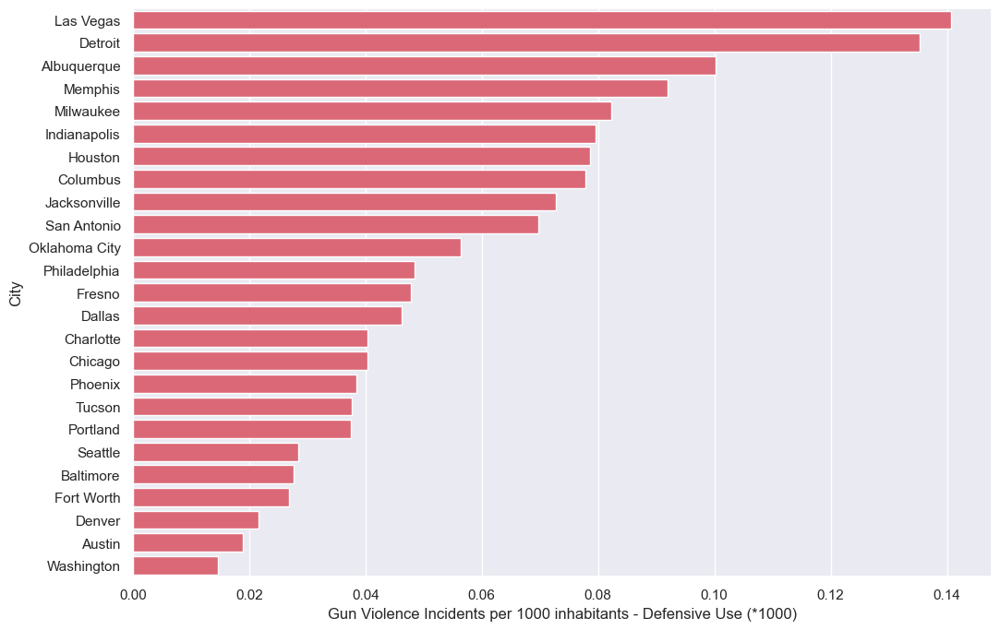

   Generando gráfica para característica: Accidental/Negligent Discharge
Gráfica guardada como: bar_incidents_population_ratio_20251119_004924.png


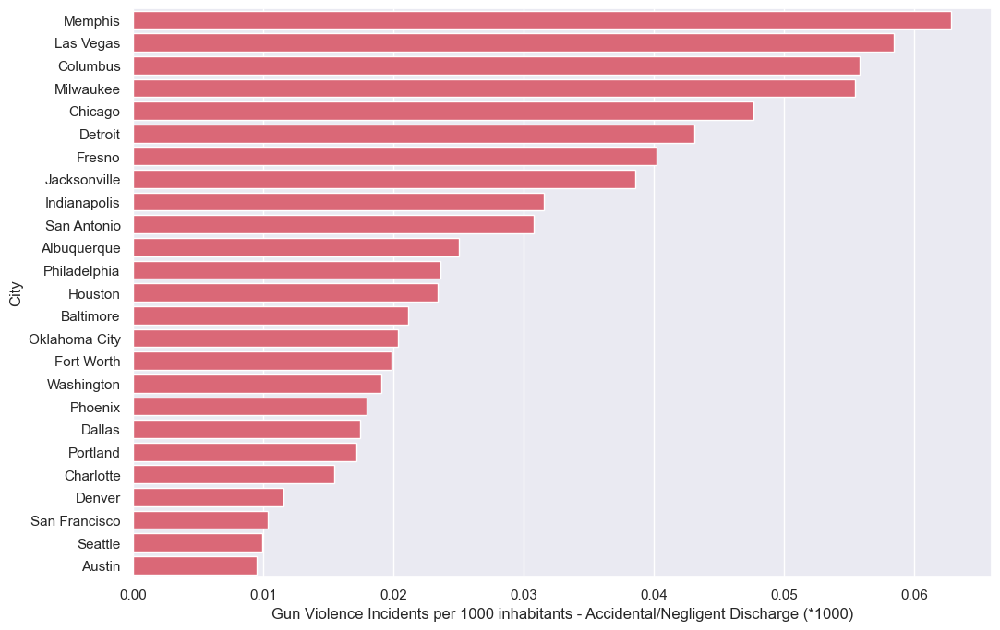

   Generando gráfica para característica: Gun(s) stolen from owner
Gráfica guardada como: bar_incidents_population_ratio_20251119_004924.png


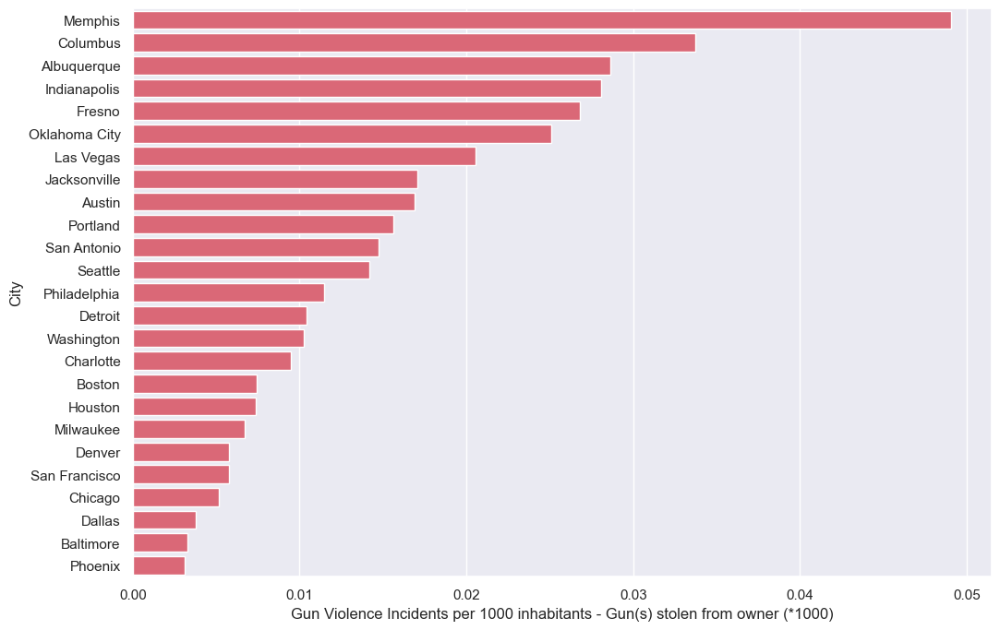

----------------------------------------------------------------------
=== Procesando ratio: killed_population_ratio ===
   Generando gráfica para característica: Shot - Wounded/Injured
Gráfica guardada como: bar_killed_population_ratio_20251119_004925.png


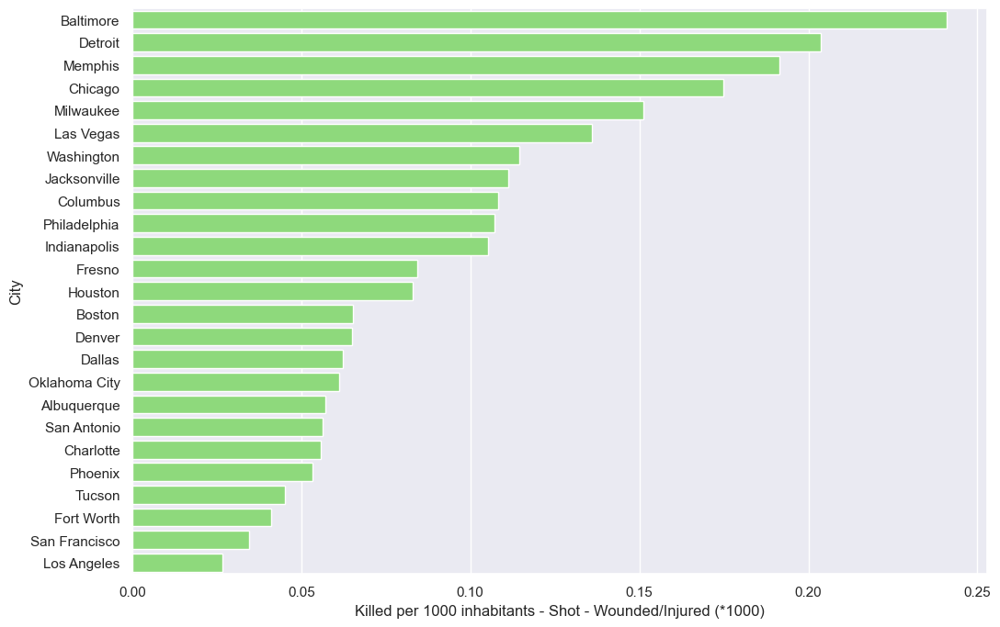

   Generando gráfica para característica: Shot - Dead (murder, accidental, suicide)
Gráfica guardada como: bar_killed_population_ratio_20251119_004926.png


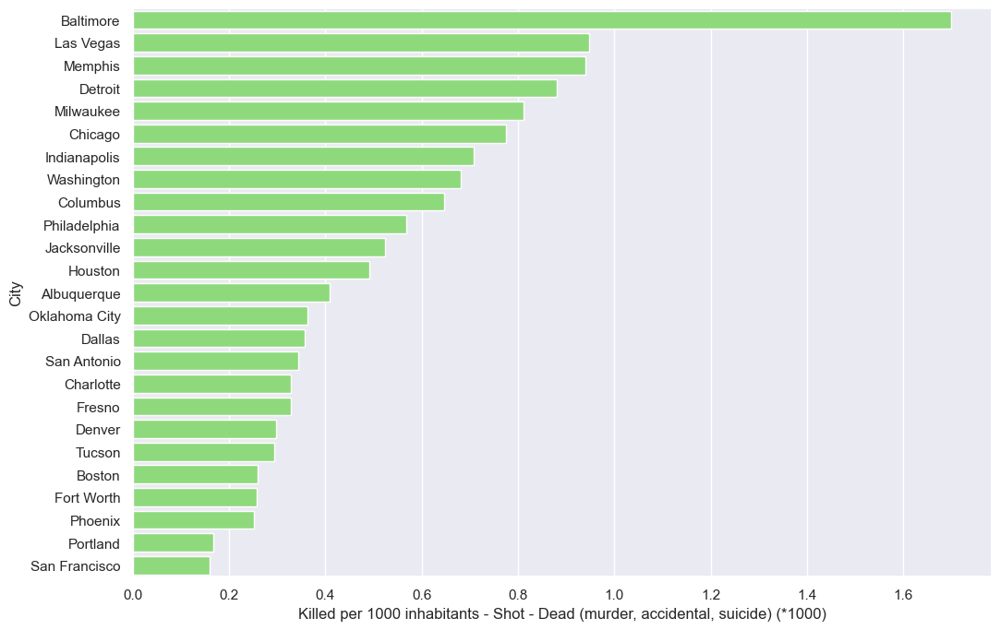

   Generando gráfica para característica: Non-Shooting Incident
Gráfica guardada como: bar_killed_population_ratio_20251119_004927.png


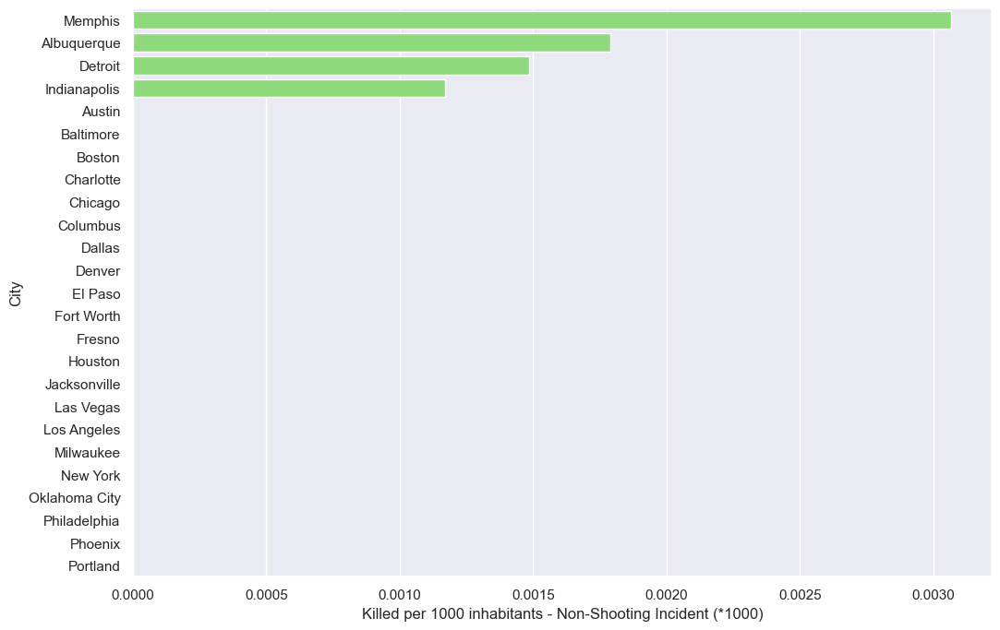

   Generando gráfica para característica: Shots Fired - No Injuries
Gráfica guardada como: bar_killed_population_ratio_20251119_004928.png


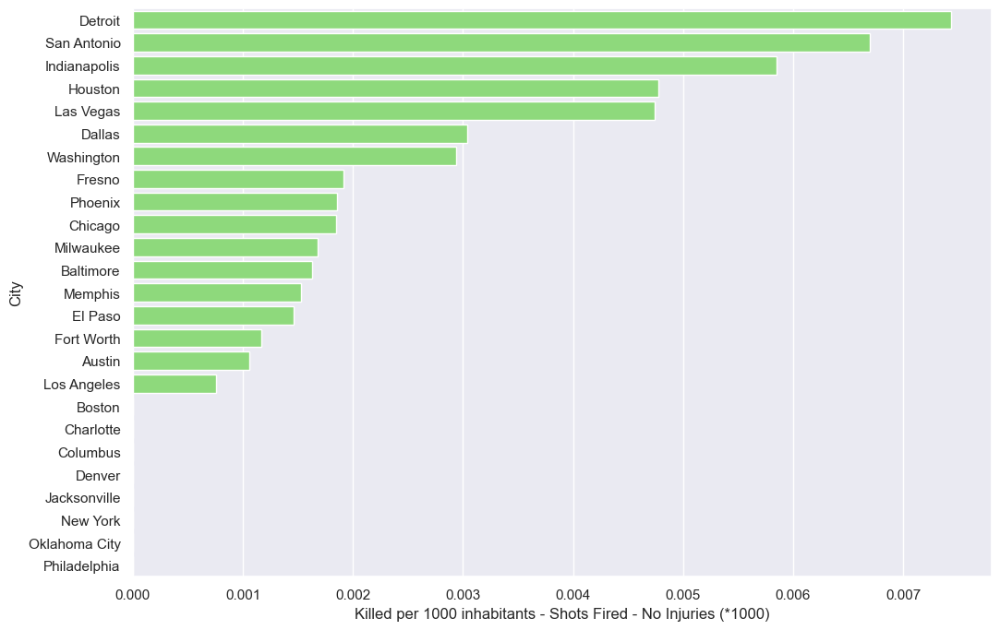

   Generando gráfica para característica: Possession (gun(s) found during commission of other crimes)
Gráfica guardada como: bar_killed_population_ratio_20251119_004929.png


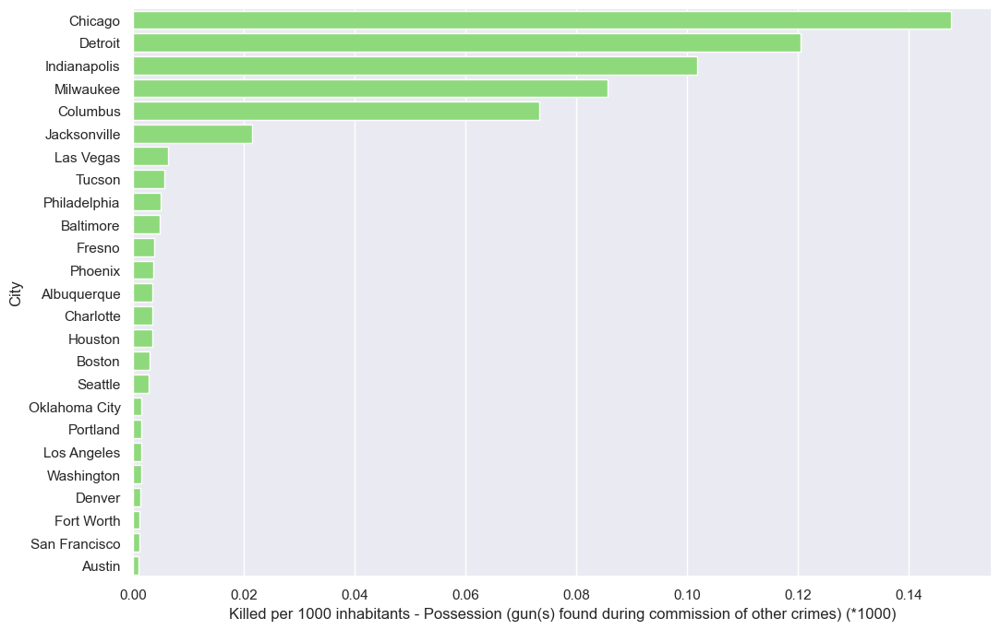

   Generando gráfica para característica: Armed robbery with injury/death and/or evidence of DGU found
Gráfica guardada como: bar_killed_population_ratio_20251119_004930.png


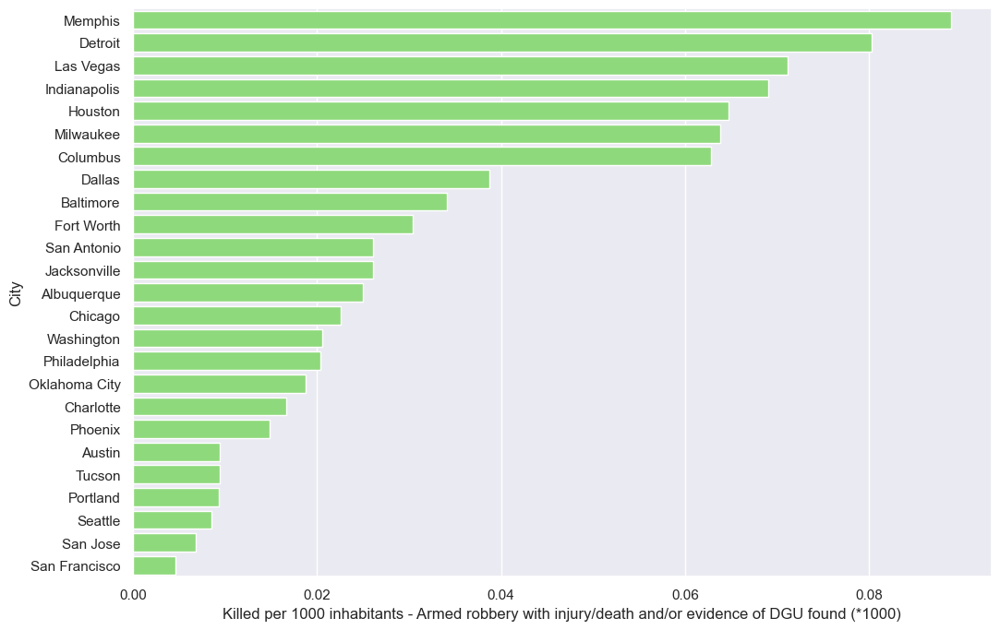

   Generando gráfica para característica: Brandishing/flourishing/open carry/lost/found
Gráfica guardada como: bar_killed_population_ratio_20251119_004931.png


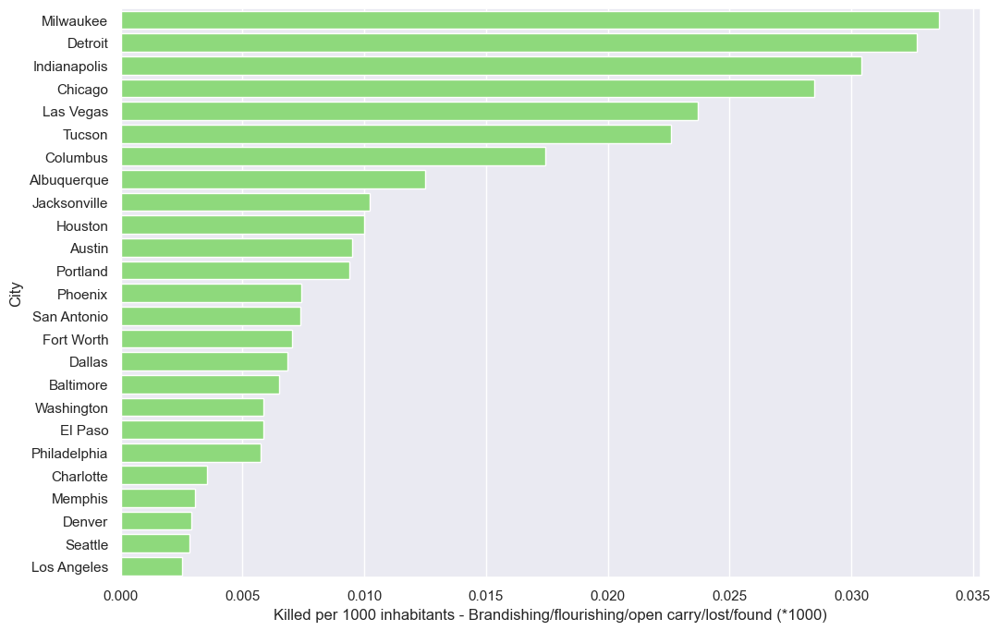

   Generando gráfica para característica: ATF/LE Confiscation/Raid/Arrest
Gráfica guardada como: bar_killed_population_ratio_20251119_004932.png


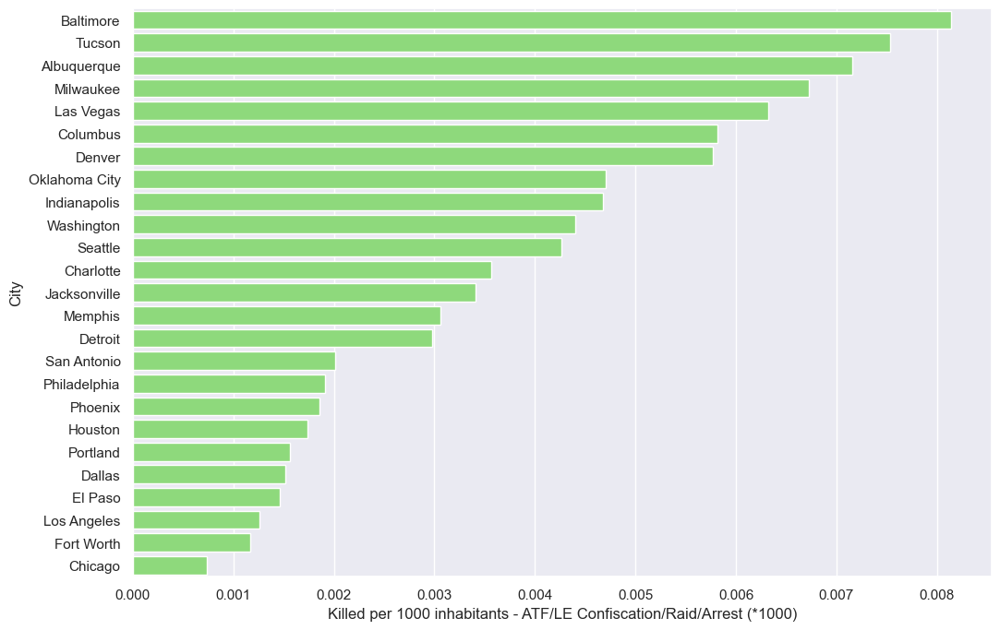

   Generando gráfica para característica: Officer Involved Incident
Gráfica guardada como: bar_killed_population_ratio_20251119_004932.png


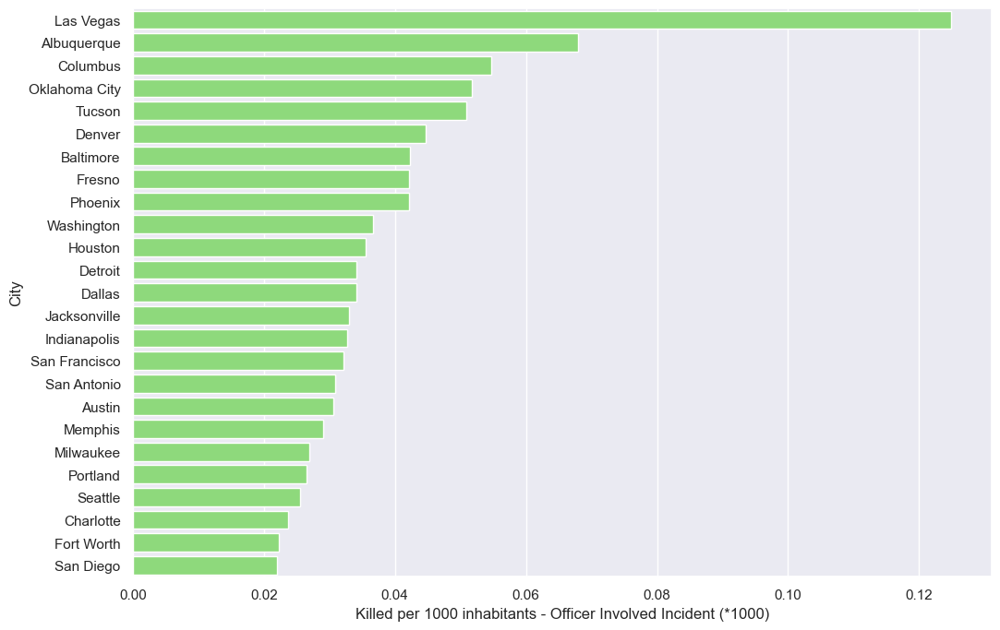

   Generando gráfica para característica: Possession of gun by felon or prohibited person
Gráfica guardada como: bar_killed_population_ratio_20251119_004933.png


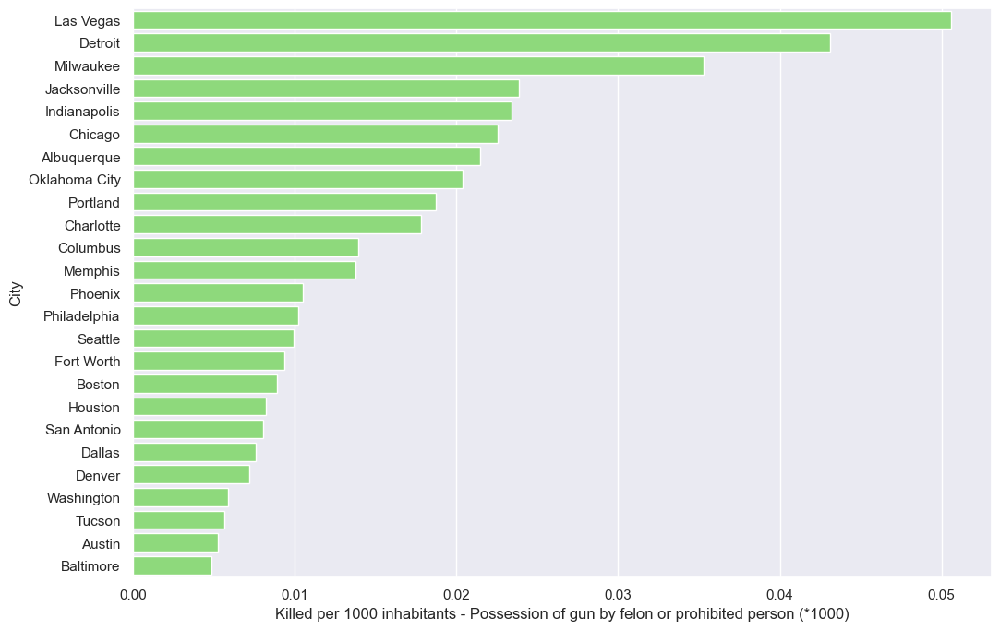

   Generando gráfica para característica: Drug involvement
Gráfica guardada como: bar_killed_population_ratio_20251119_004934.png


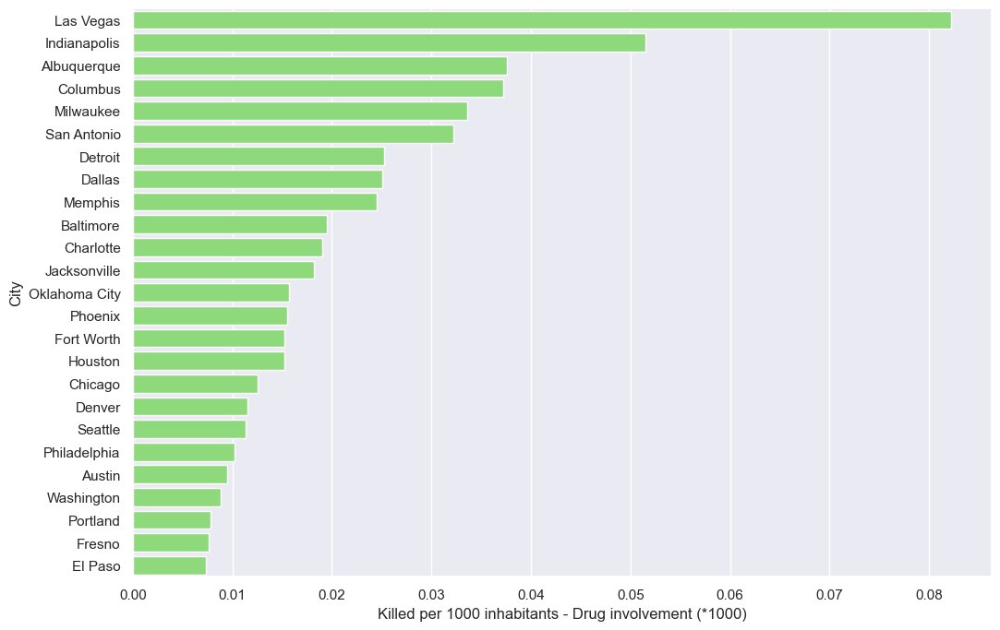

   Generando gráfica para característica: Drive-by (car to street, car to car)
Gráfica guardada como: bar_killed_population_ratio_20251119_004935.png


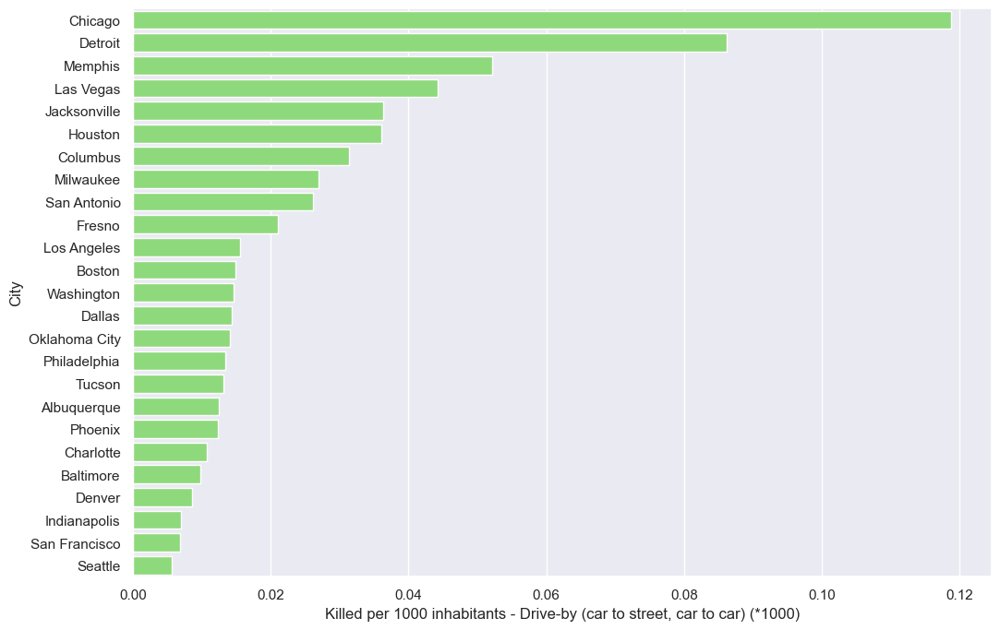

   Generando gráfica para característica: Institution/Group/Business
Gráfica guardada como: bar_killed_population_ratio_20251119_004935.png


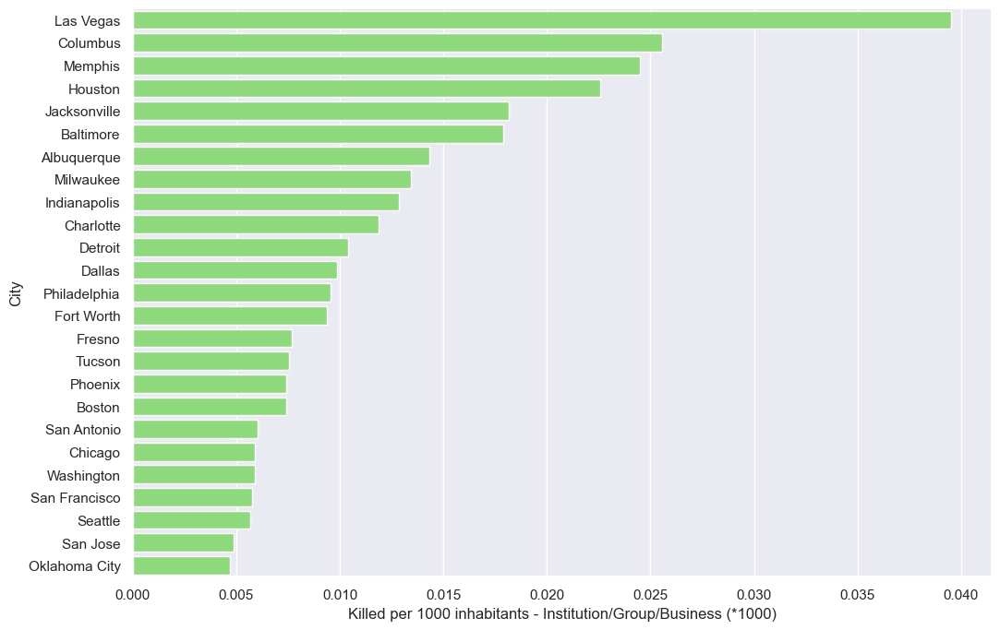

   Generando gráfica para característica: Domestic Violence
Gráfica guardada como: bar_killed_population_ratio_20251119_004936.png


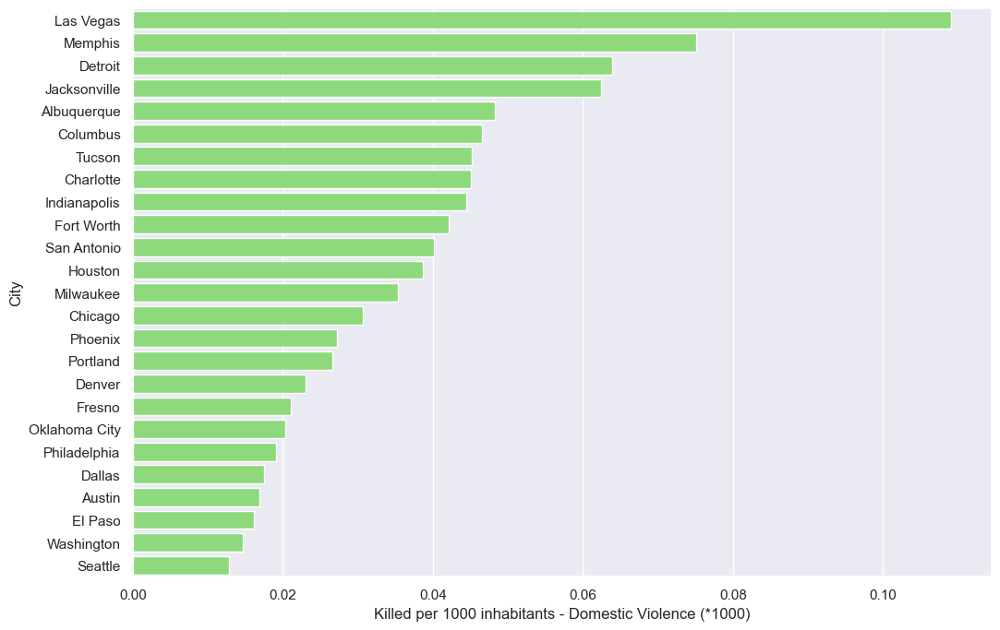

   Generando gráfica para característica: Home Invasion
Gráfica guardada como: bar_killed_population_ratio_20251119_004937.png


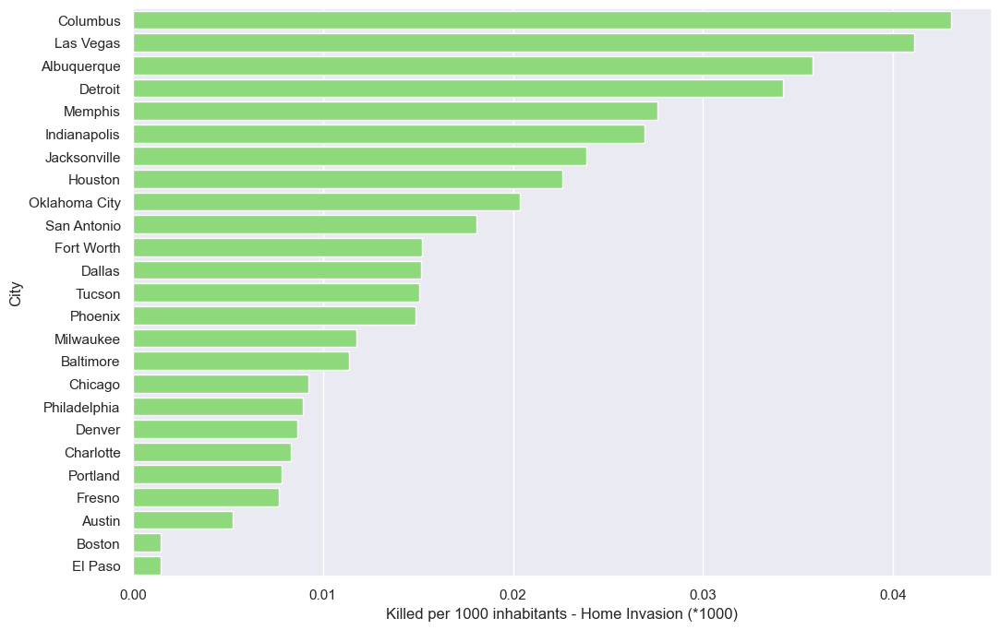

   Generando gráfica para característica: Accidental Shooting
Gráfica guardada como: bar_killed_population_ratio_20251119_004937.png


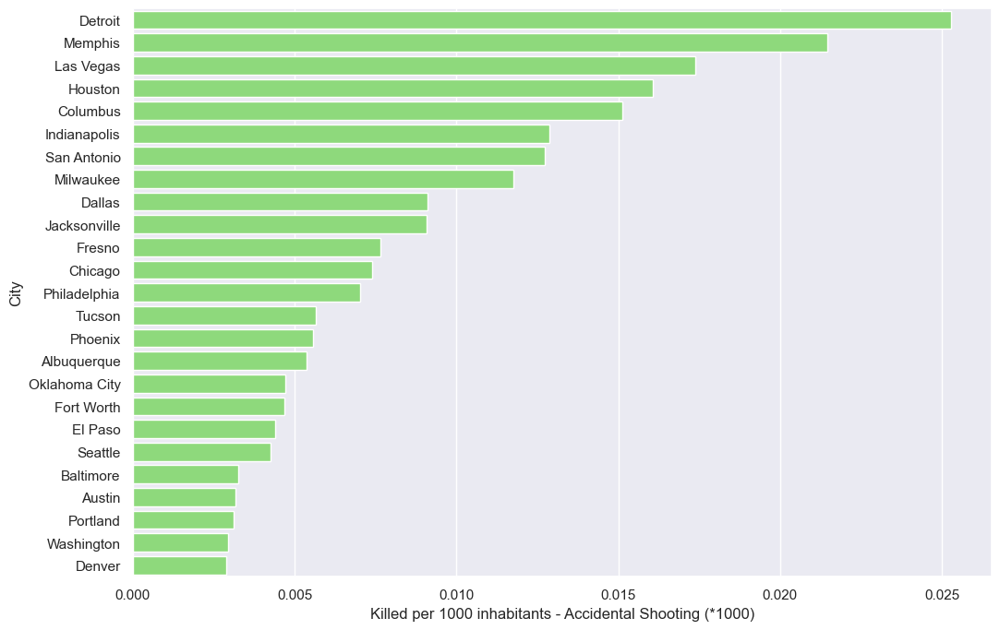

   Generando gráfica para característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant
Gráfica guardada como: bar_killed_population_ratio_20251119_004938.png


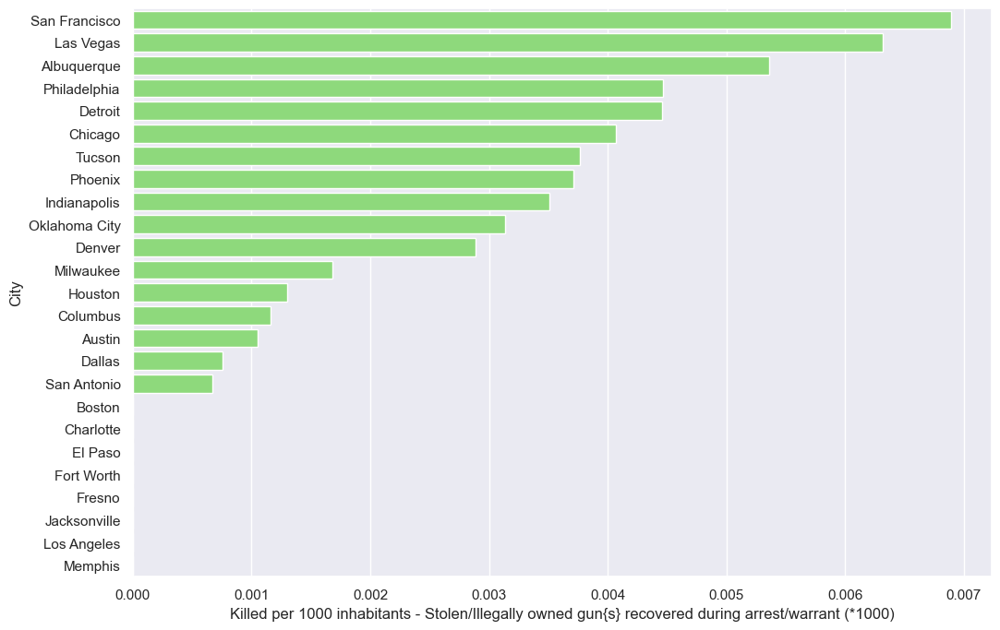

   Generando gráfica para característica: Defensive Use
Gráfica guardada como: bar_killed_population_ratio_20251119_004939.png


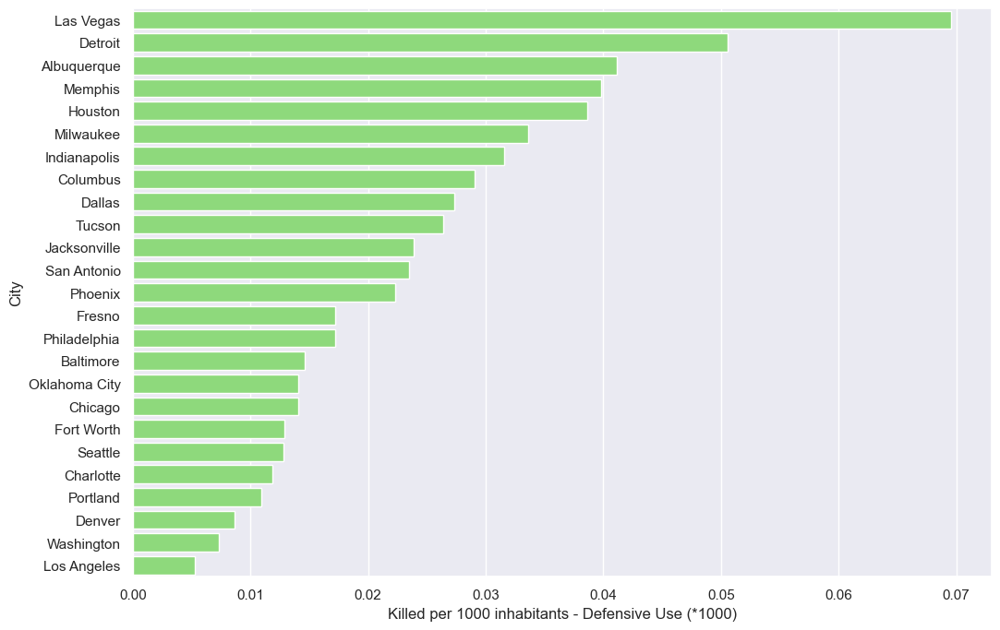

   Generando gráfica para característica: Accidental/Negligent Discharge
Gráfica guardada como: bar_killed_population_ratio_20251119_004940.png


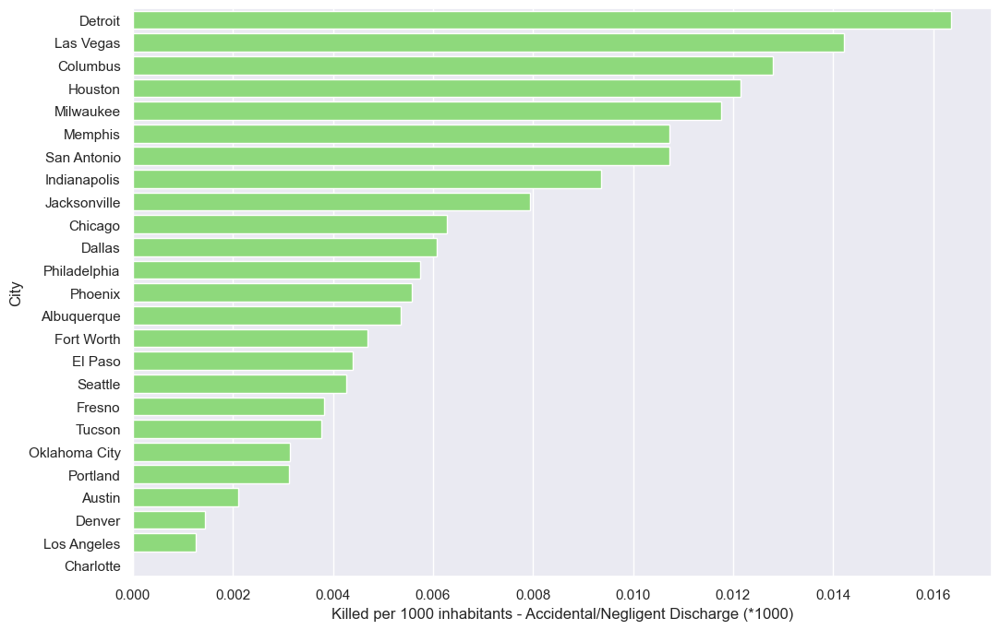

   Generando gráfica para característica: Gun(s) stolen from owner
Gráfica guardada como: bar_killed_population_ratio_20251119_004940.png


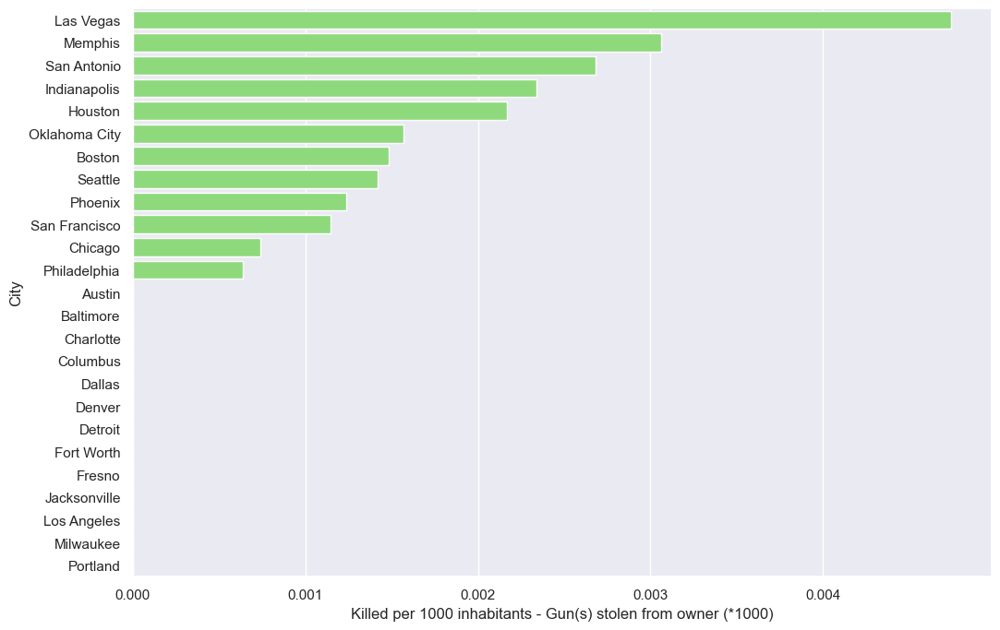

----------------------------------------------------------------------
=== Procesando ratio: injured_population_ratio ===
   Generando gráfica para característica: Shot - Wounded/Injured
Gráfica guardada como: bar_injured_population_ratio_20251119_004941.png


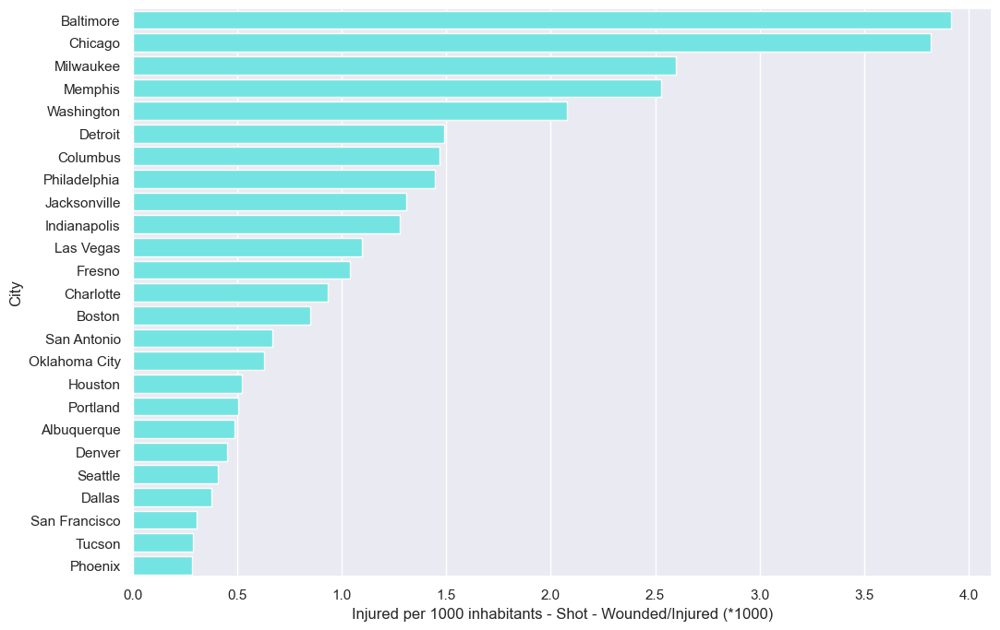

   Generando gráfica para característica: Shot - Dead (murder, accidental, suicide)
Gráfica guardada como: bar_injured_population_ratio_20251119_004942.png


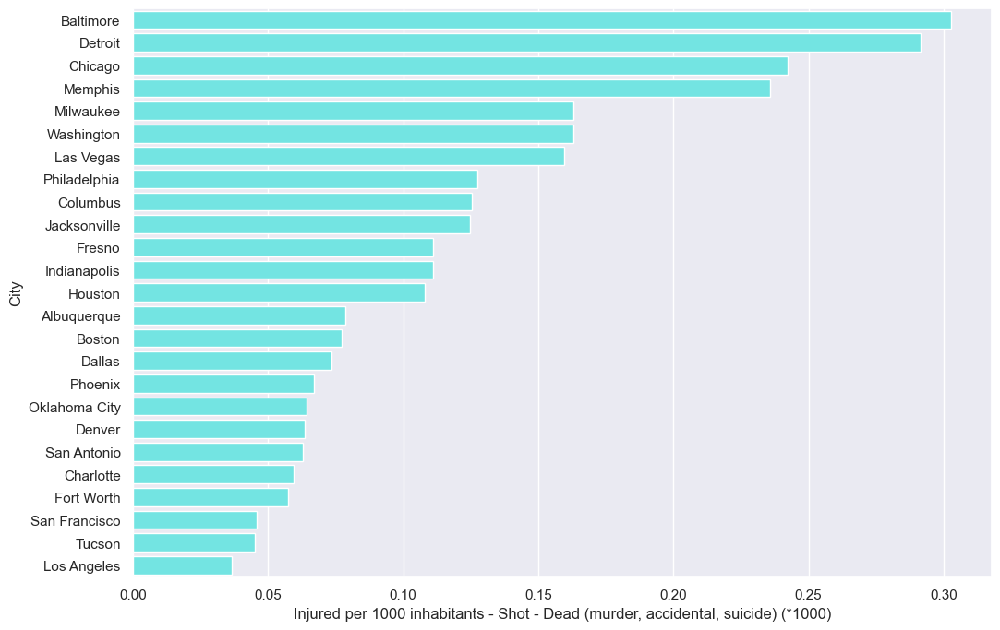

   Generando gráfica para característica: Non-Shooting Incident
Gráfica guardada como: bar_injured_population_ratio_20251119_004943.png


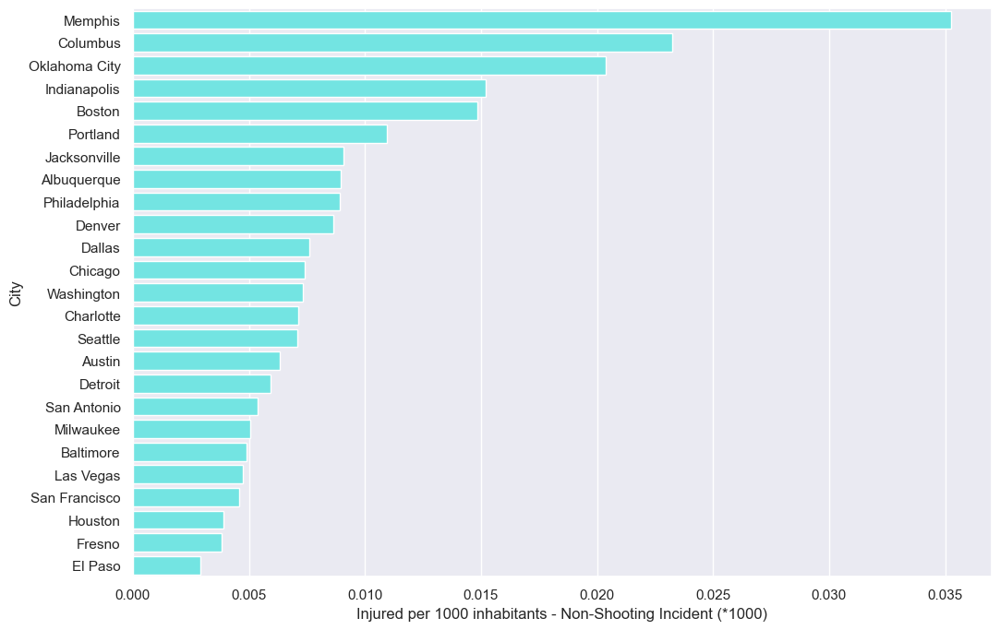

   Generando gráfica para característica: Shots Fired - No Injuries
Gráfica guardada como: bar_injured_population_ratio_20251119_004944.png


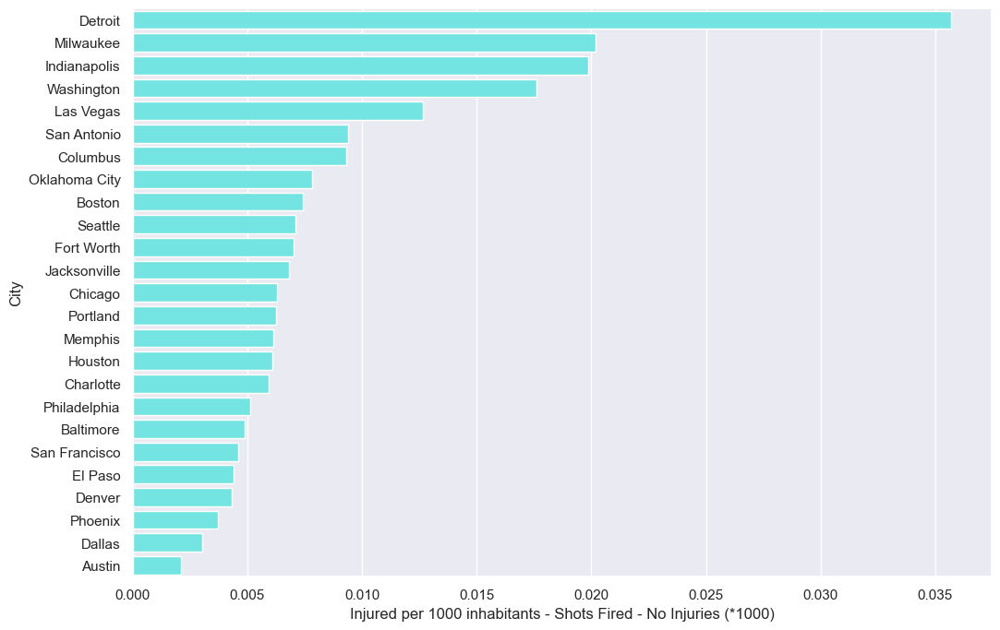

   Generando gráfica para característica: Possession (gun(s) found during commission of other crimes)
Gráfica guardada como: bar_injured_population_ratio_20251119_004944.png


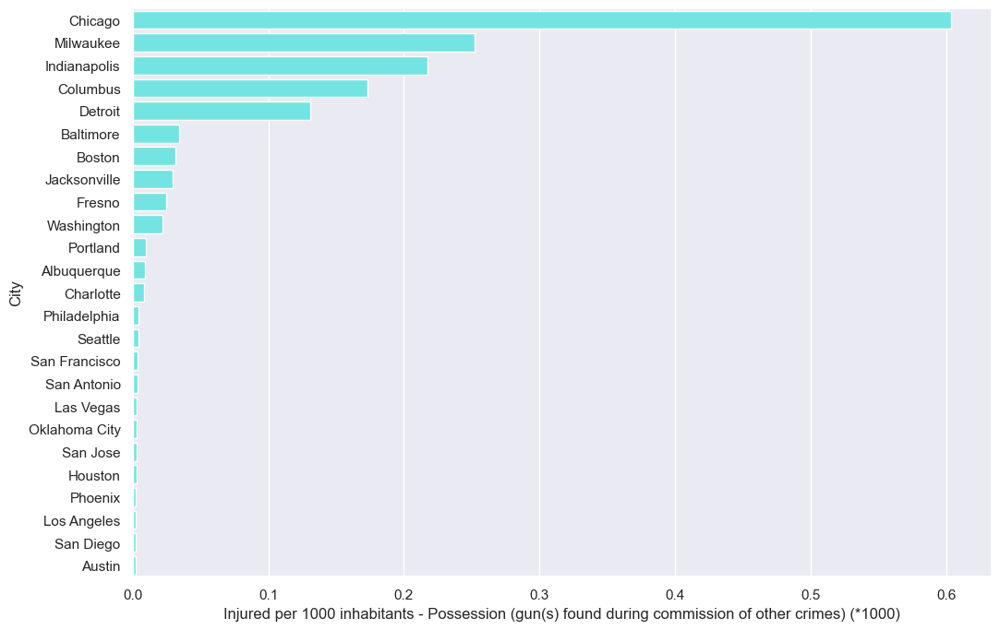

   Generando gráfica para característica: Armed robbery with injury/death and/or evidence of DGU found
Gráfica guardada como: bar_injured_population_ratio_20251119_004945.png


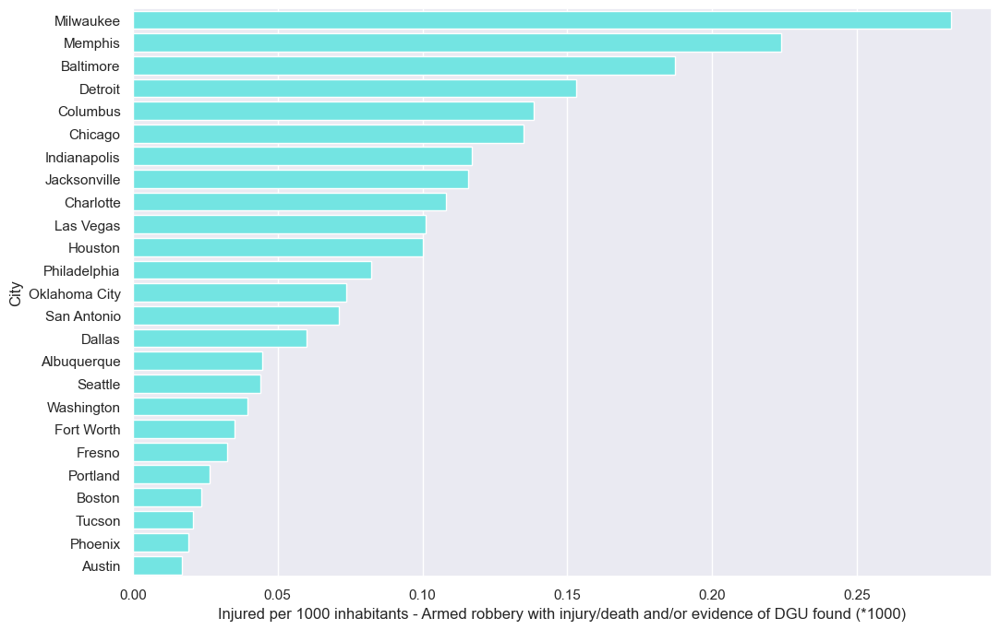

   Generando gráfica para característica: Brandishing/flourishing/open carry/lost/found
Gráfica guardada como: bar_injured_population_ratio_20251119_004946.png


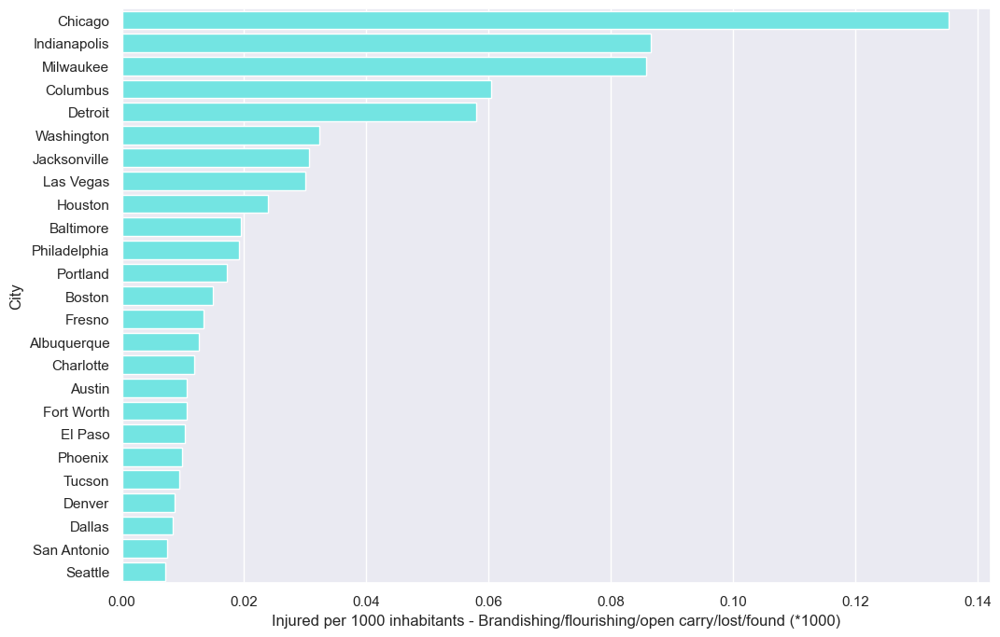

   Generando gráfica para característica: ATF/LE Confiscation/Raid/Arrest
Gráfica guardada como: bar_injured_population_ratio_20251119_004947.png


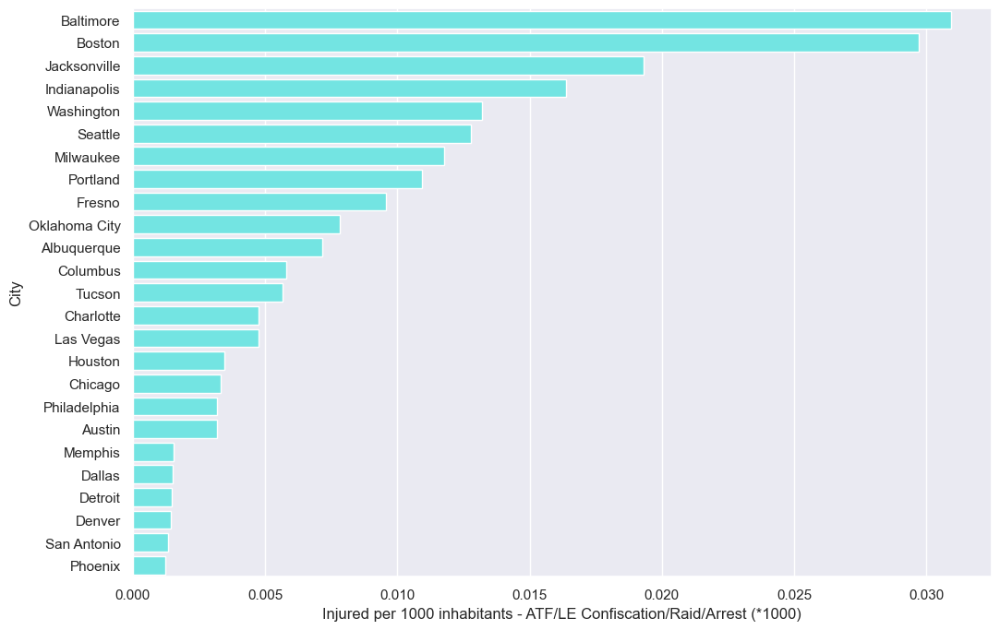

   Generando gráfica para característica: Officer Involved Incident
Gráfica guardada como: bar_injured_population_ratio_20251119_004948.png


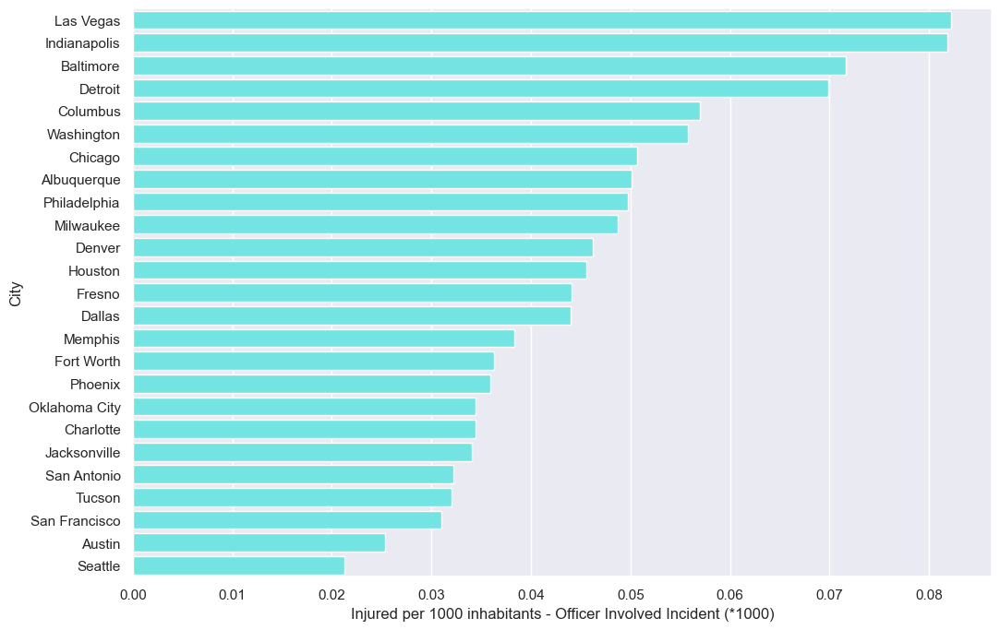

   Generando gráfica para característica: Possession of gun by felon or prohibited person
Gráfica guardada como: bar_injured_population_ratio_20251119_004949.png


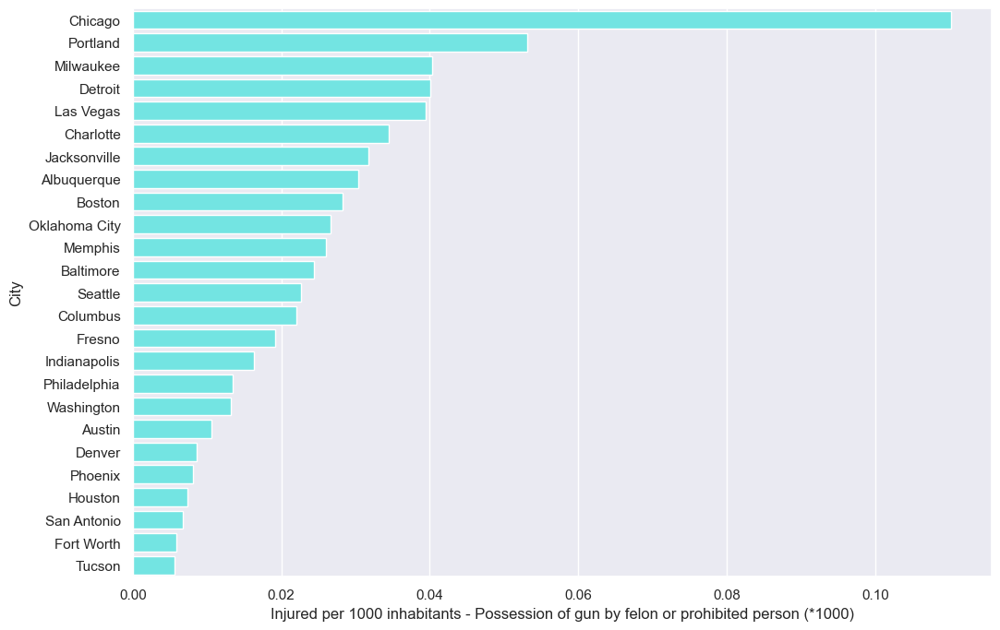

   Generando gráfica para característica: Drug involvement
Gráfica guardada como: bar_injured_population_ratio_20251119_004949.png


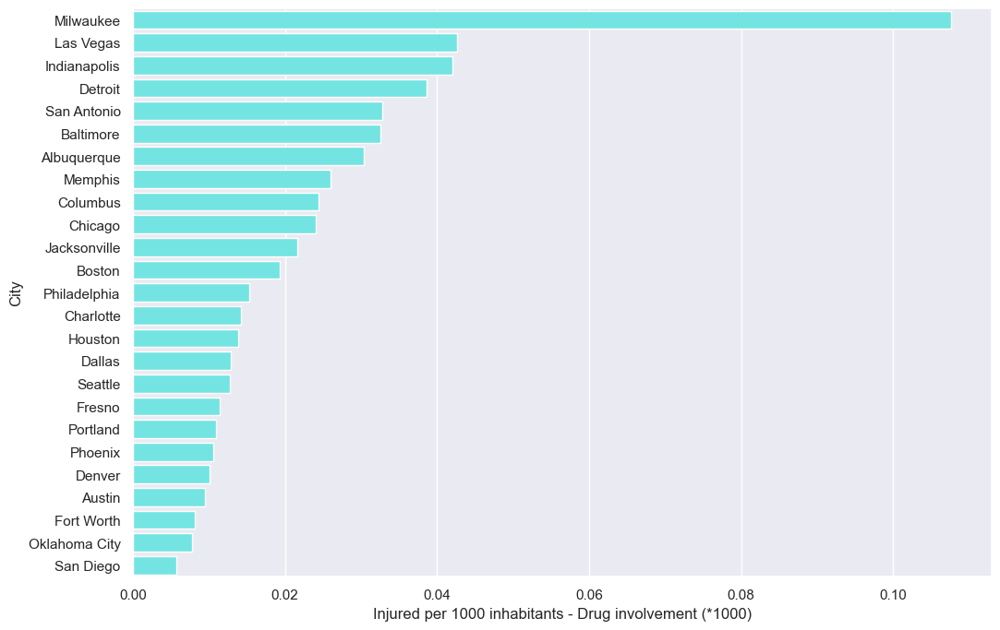

   Generando gráfica para característica: Drive-by (car to street, car to car)
Gráfica guardada como: bar_injured_population_ratio_20251119_004950.png


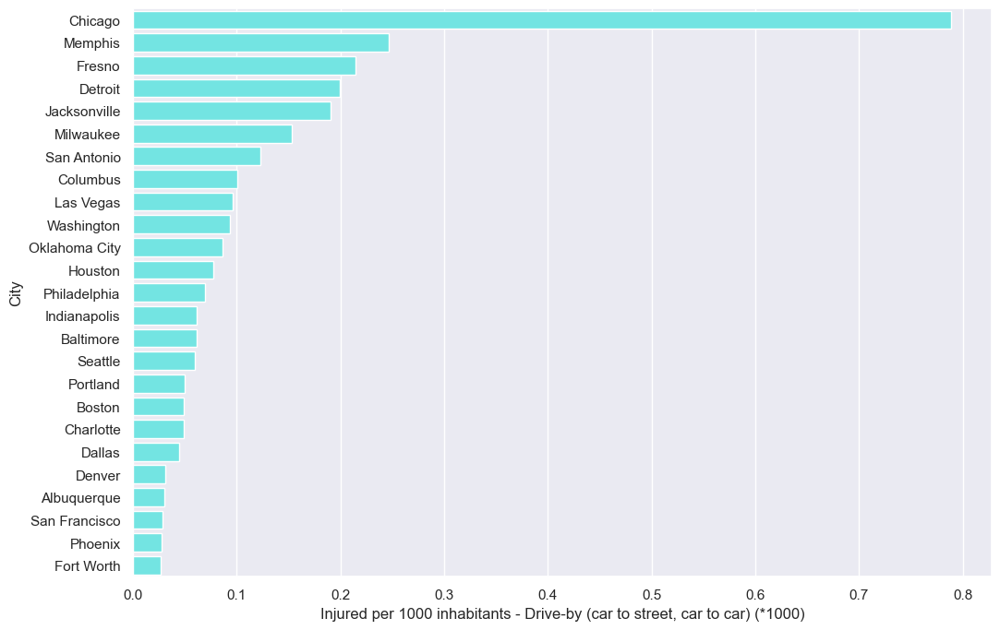

   Generando gráfica para característica: Institution/Group/Business
Gráfica guardada como: bar_injured_population_ratio_20251119_004951.png


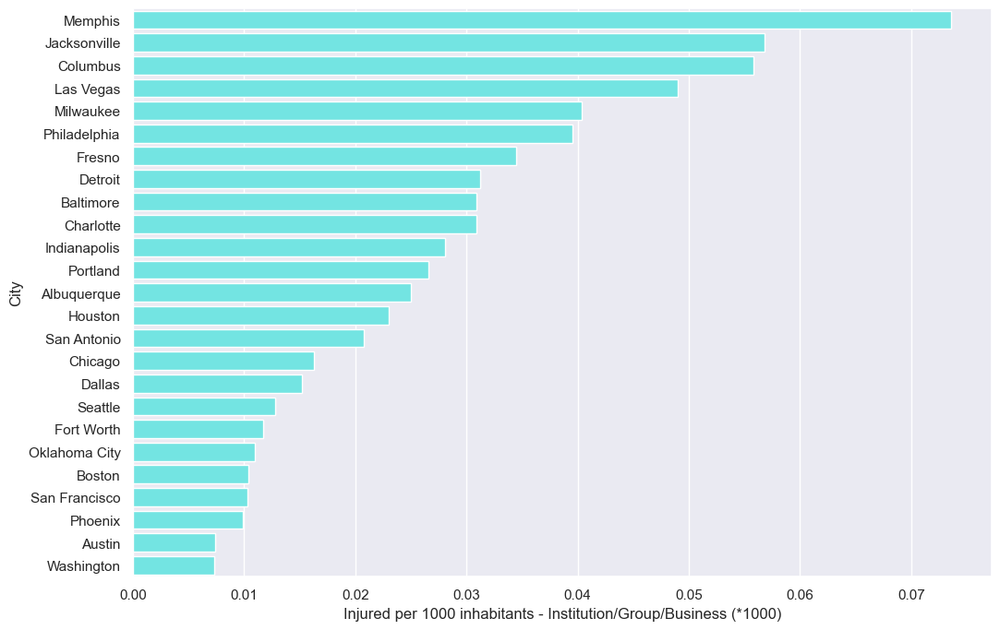

   Generando gráfica para característica: Domestic Violence
Gráfica guardada como: bar_injured_population_ratio_20251119_004952.png


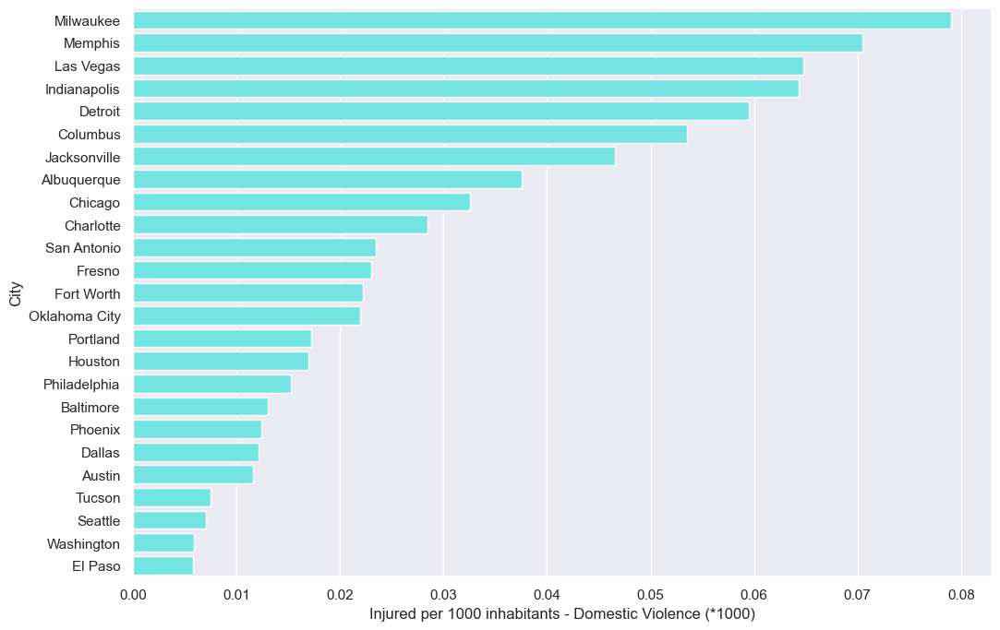

   Generando gráfica para característica: Home Invasion
Gráfica guardada como: bar_injured_population_ratio_20251119_004952.png


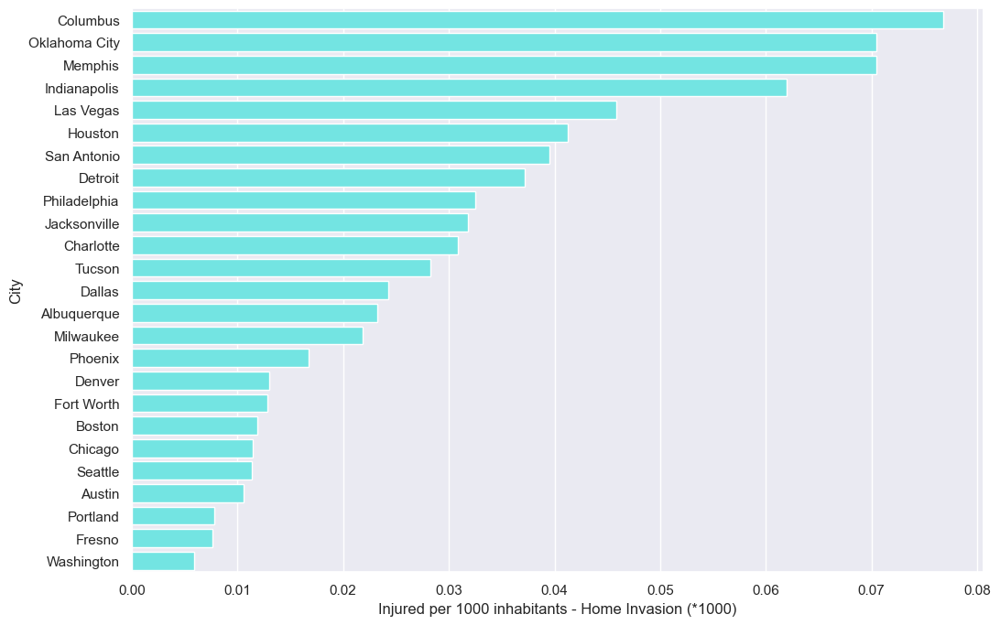

   Generando gráfica para característica: Accidental Shooting
Gráfica guardada como: bar_injured_population_ratio_20251119_004953.png


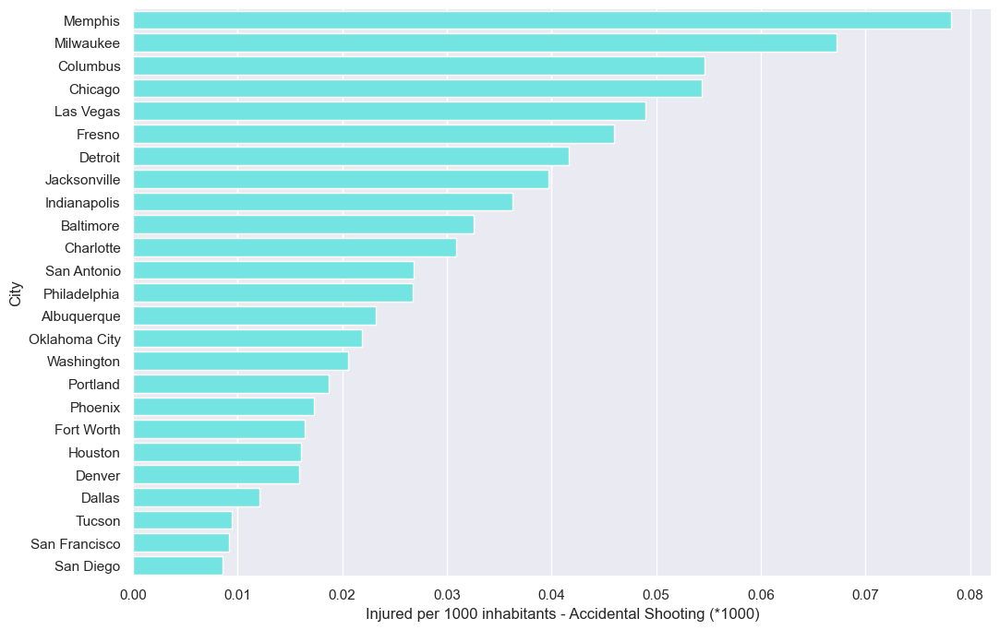

   Generando gráfica para característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant
Gráfica guardada como: bar_injured_population_ratio_20251119_004954.png


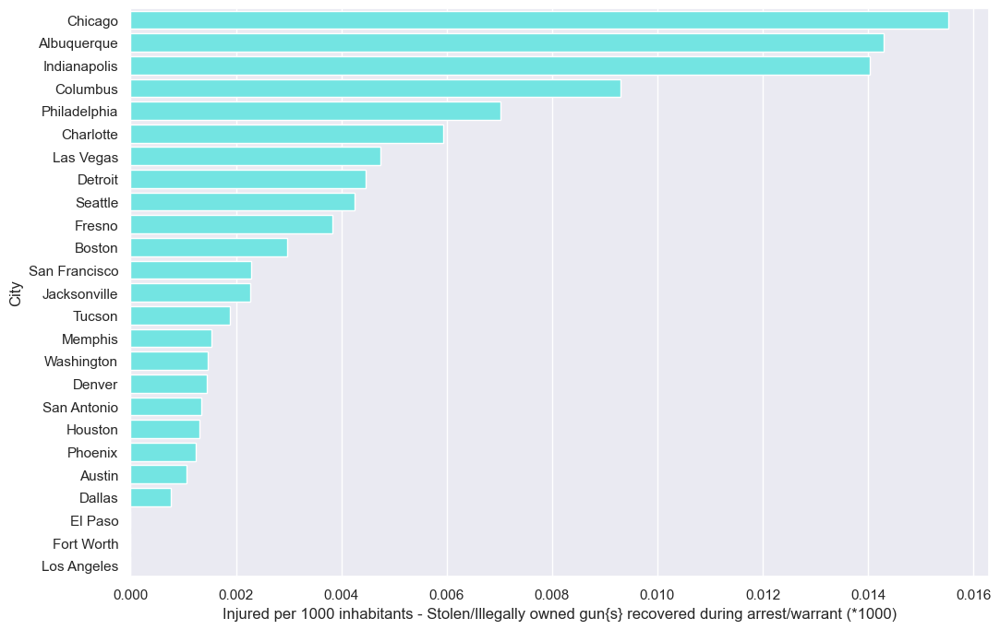

   Generando gráfica para característica: Defensive Use
Gráfica guardada como: bar_injured_population_ratio_20251119_004954.png


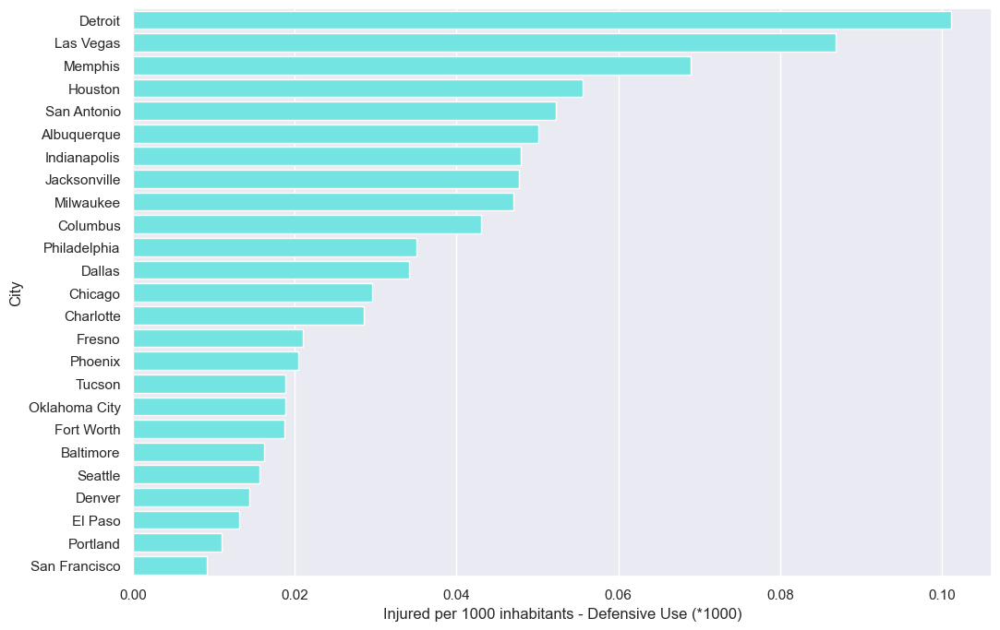

   Generando gráfica para característica: Accidental/Negligent Discharge
Gráfica guardada como: bar_injured_population_ratio_20251119_004955.png


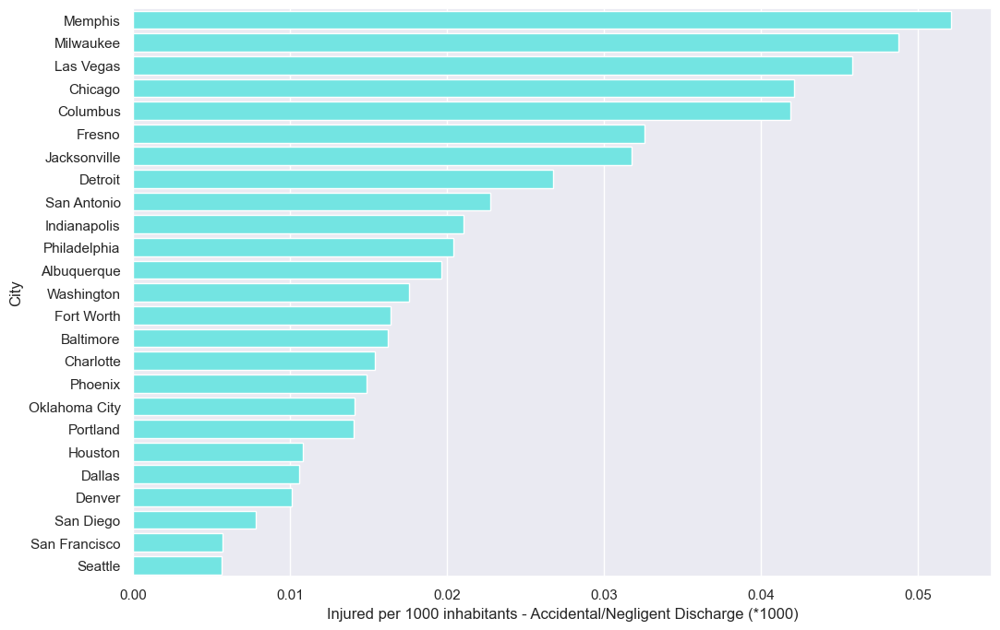

   Generando gráfica para característica: Gun(s) stolen from owner
Gráfica guardada como: bar_injured_population_ratio_20251119_004956.png


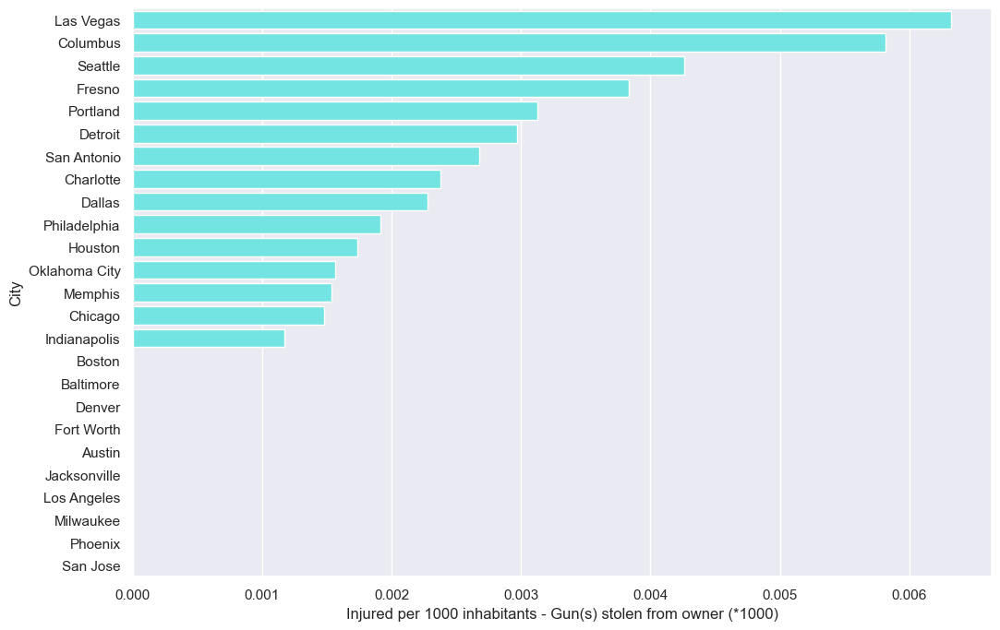

----------------------------------------------------------------------
=== Procesando ratio: loss_population_ratio ===
   Generando gráfica para característica: Shot - Wounded/Injured
Gráfica guardada como: bar_loss_population_ratio_20251119_004957.png


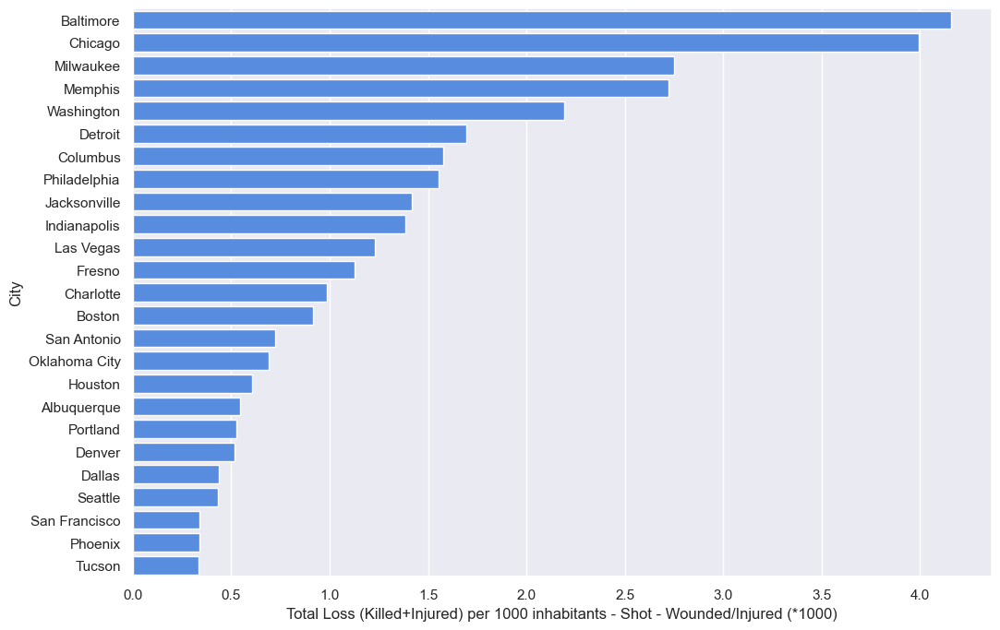

   Generando gráfica para característica: Shot - Dead (murder, accidental, suicide)
Gráfica guardada como: bar_loss_population_ratio_20251119_004957.png


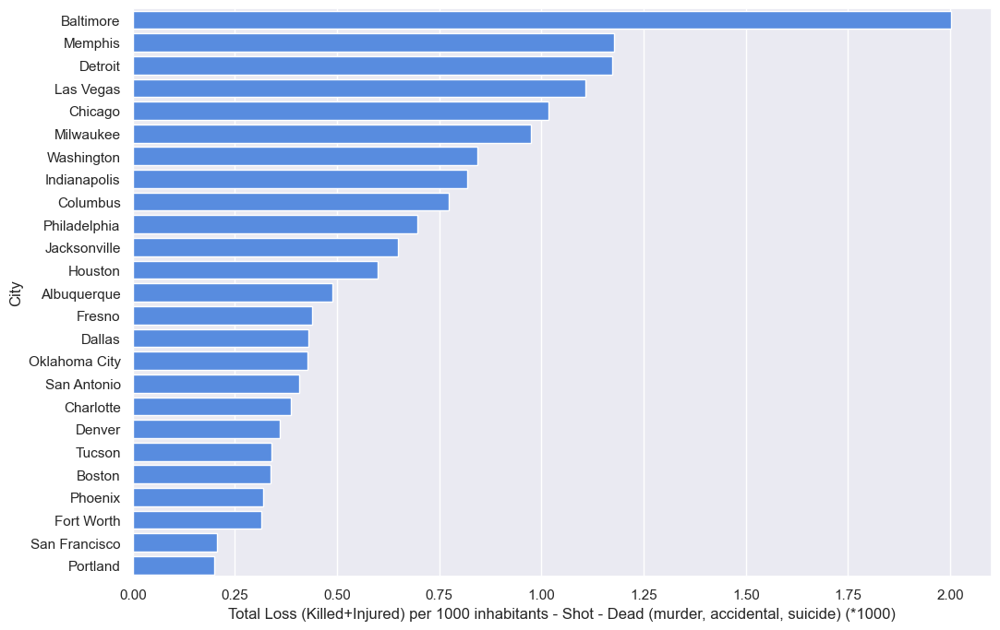

   Generando gráfica para característica: Non-Shooting Incident
Gráfica guardada como: bar_loss_population_ratio_20251119_004958.png


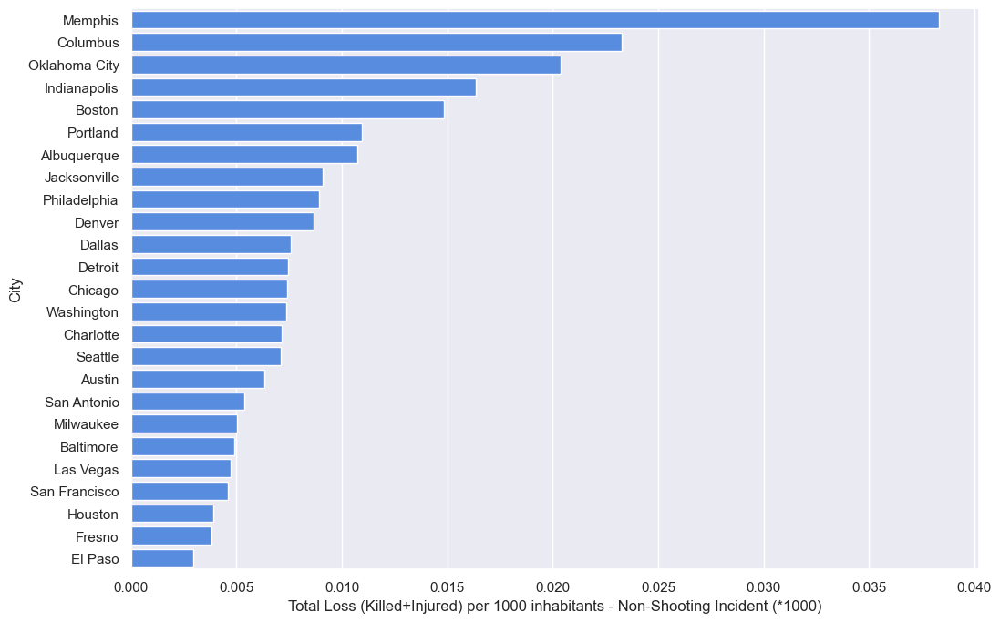

   Generando gráfica para característica: Shots Fired - No Injuries
Gráfica guardada como: bar_loss_population_ratio_20251119_004959.png


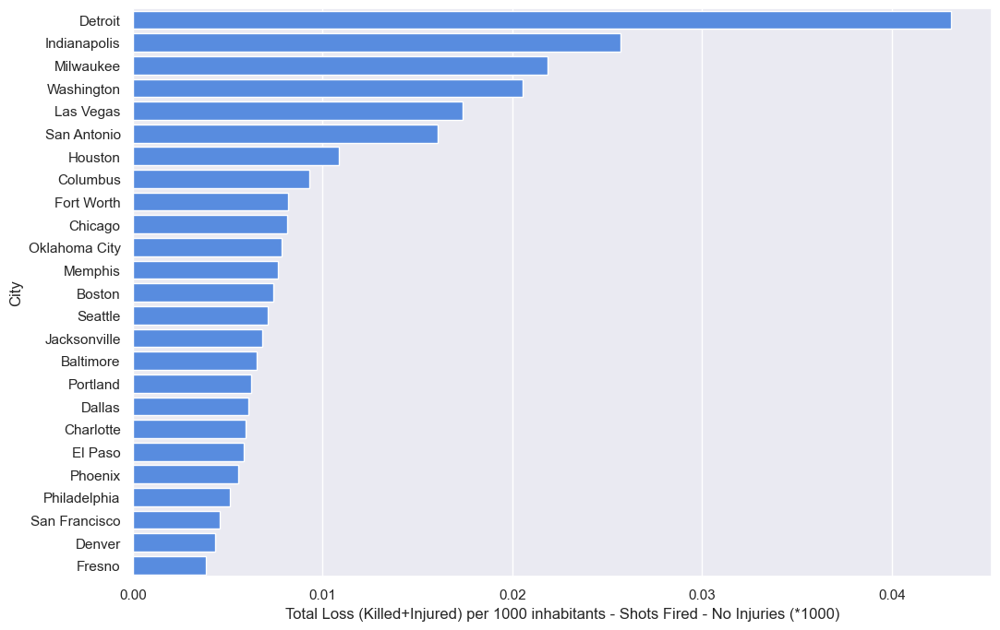

   Generando gráfica para característica: Possession (gun(s) found during commission of other crimes)
Gráfica guardada como: bar_loss_population_ratio_20251119_005000.png


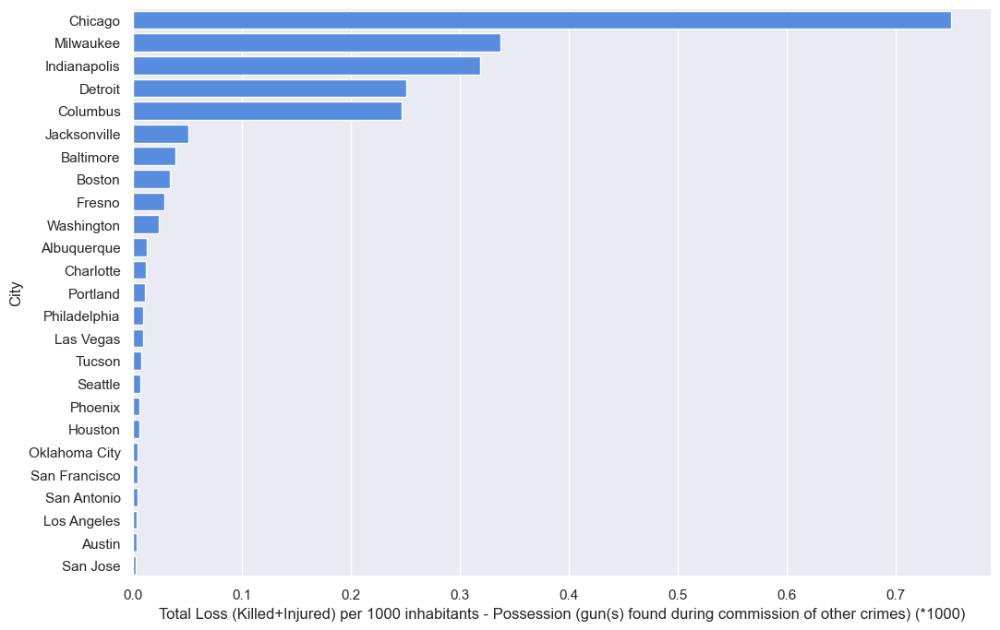

   Generando gráfica para característica: Armed robbery with injury/death and/or evidence of DGU found
Gráfica guardada como: bar_loss_population_ratio_20251119_005000.png


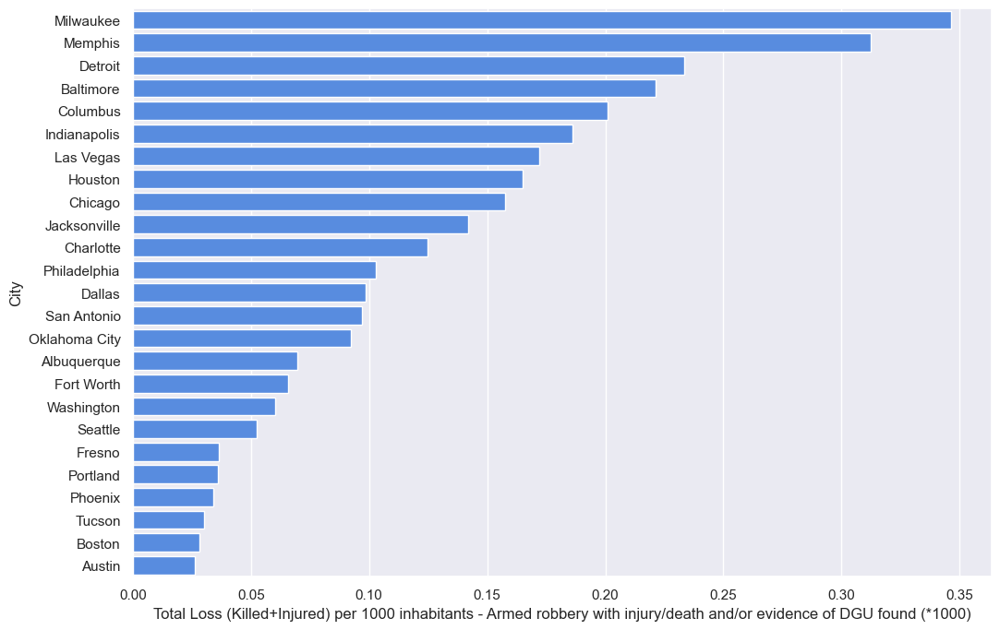

   Generando gráfica para característica: Brandishing/flourishing/open carry/lost/found
Gráfica guardada como: bar_loss_population_ratio_20251119_005001.png


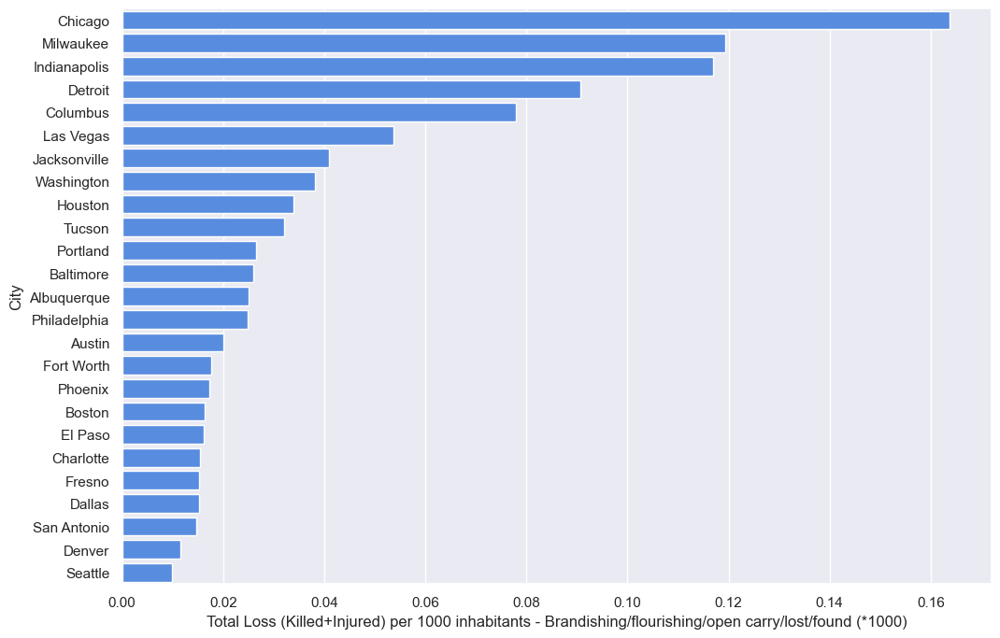

   Generando gráfica para característica: ATF/LE Confiscation/Raid/Arrest
Gráfica guardada como: bar_loss_population_ratio_20251119_005002.png


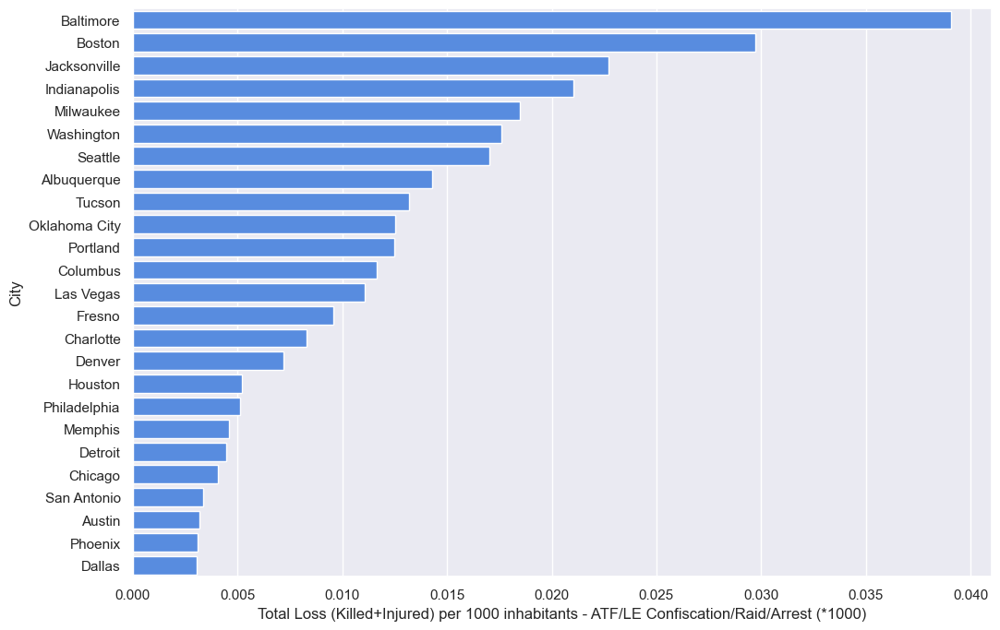

   Generando gráfica para característica: Officer Involved Incident
Gráfica guardada como: bar_loss_population_ratio_20251119_005003.png


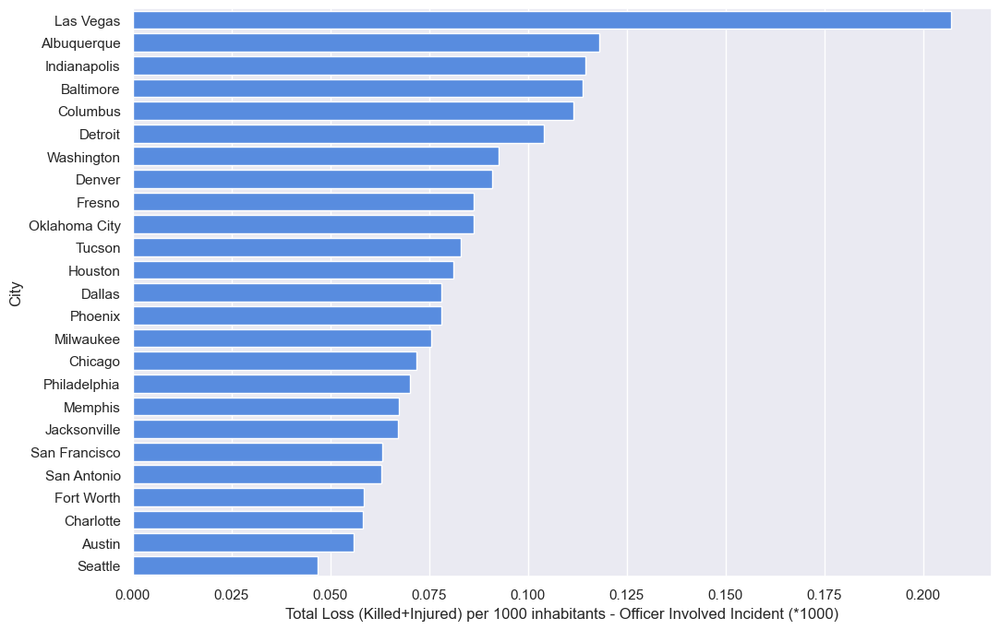

   Generando gráfica para característica: Possession of gun by felon or prohibited person
Gráfica guardada como: bar_loss_population_ratio_20251119_005004.png


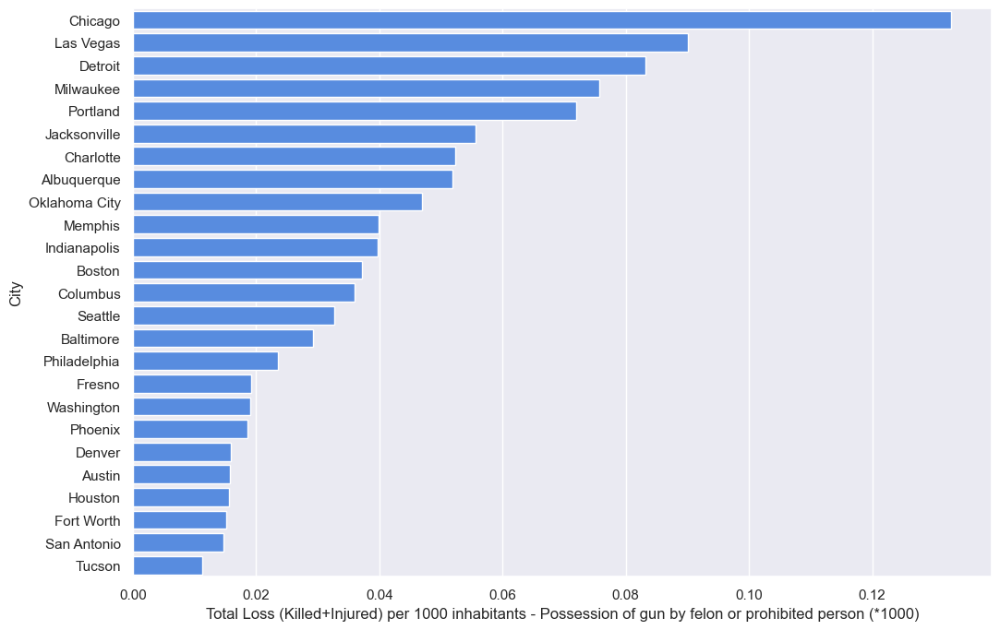

   Generando gráfica para característica: Drug involvement
Gráfica guardada como: bar_loss_population_ratio_20251119_005005.png


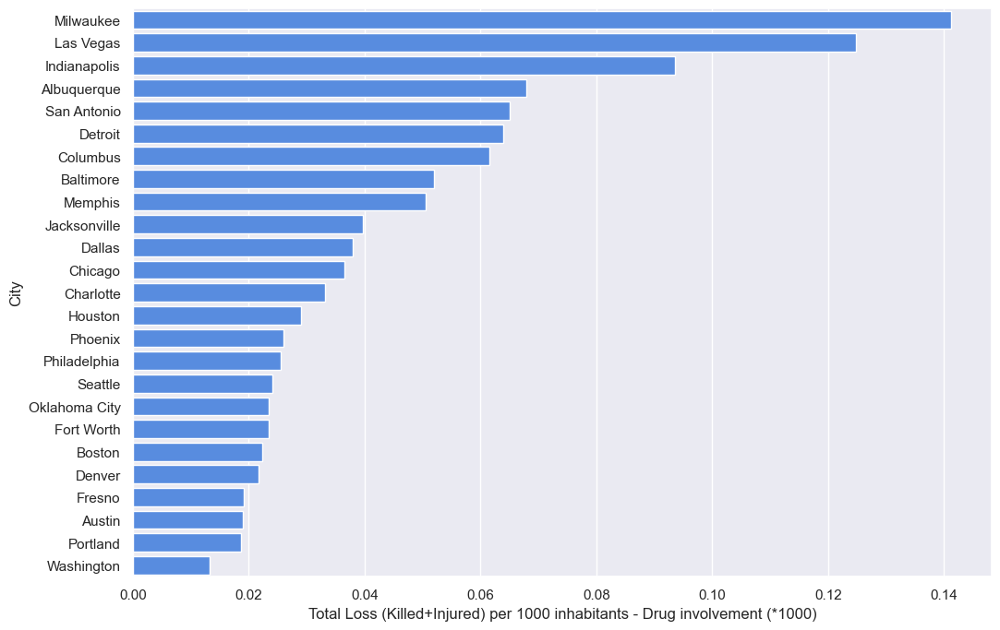

   Generando gráfica para característica: Drive-by (car to street, car to car)
Gráfica guardada como: bar_loss_population_ratio_20251119_005005.png


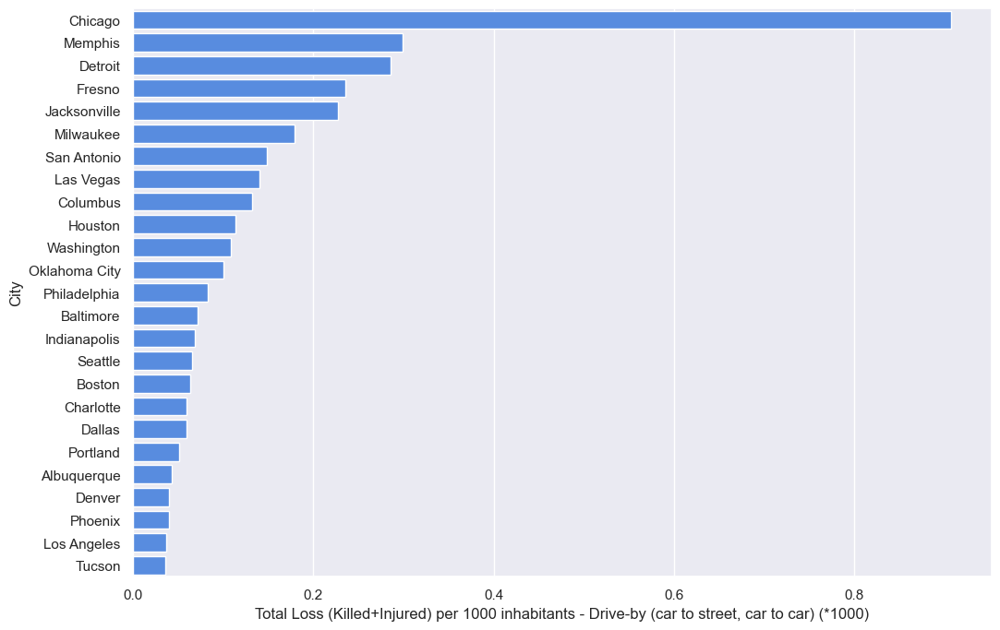

   Generando gráfica para característica: Institution/Group/Business
Gráfica guardada como: bar_loss_population_ratio_20251119_005007.png


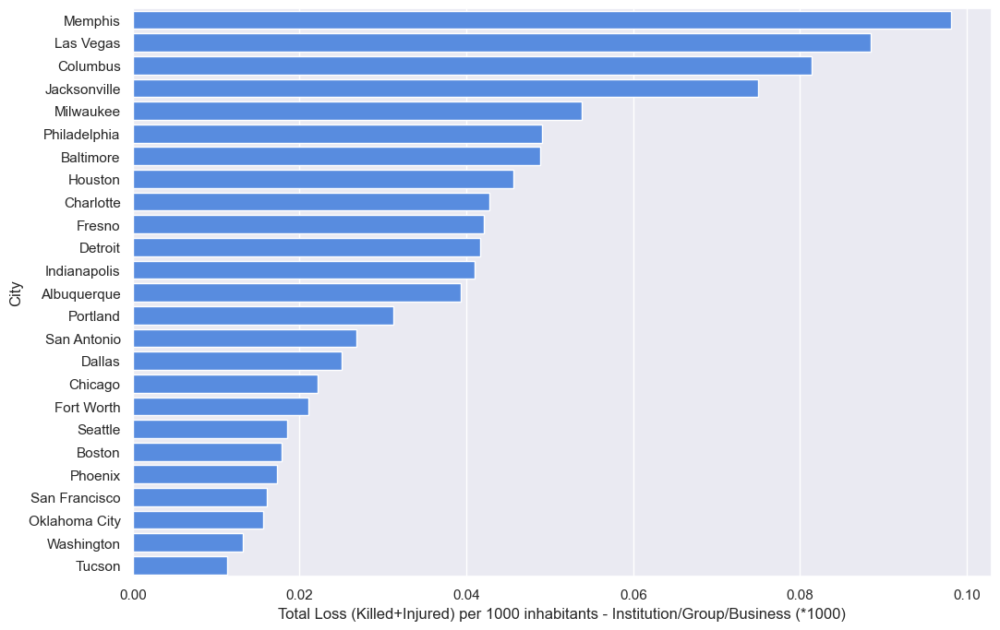

   Generando gráfica para característica: Domestic Violence
Gráfica guardada como: bar_loss_population_ratio_20251119_005008.png


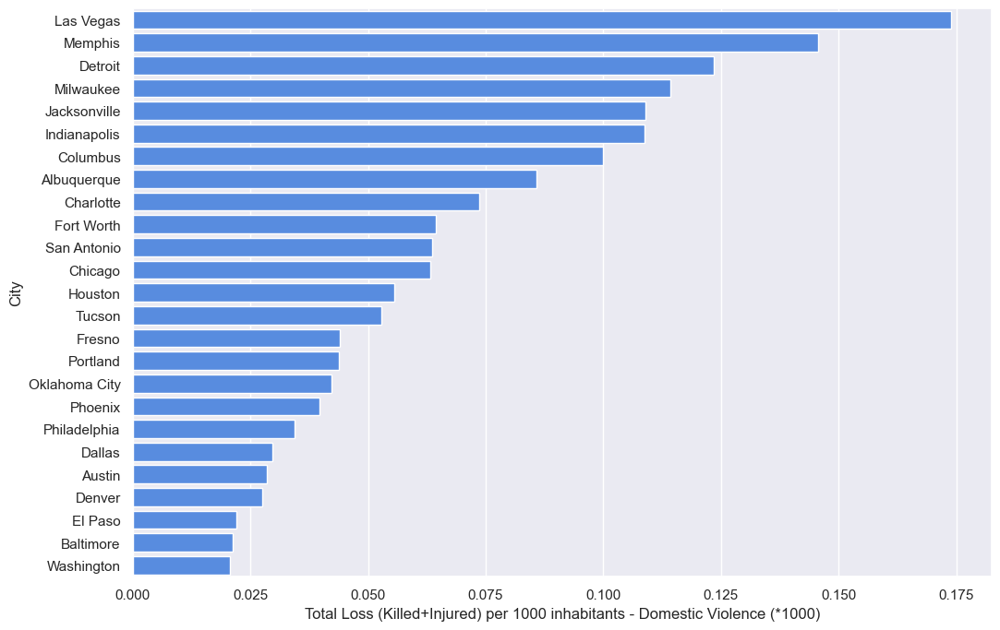

   Generando gráfica para característica: Home Invasion
Gráfica guardada como: bar_loss_population_ratio_20251119_005008.png


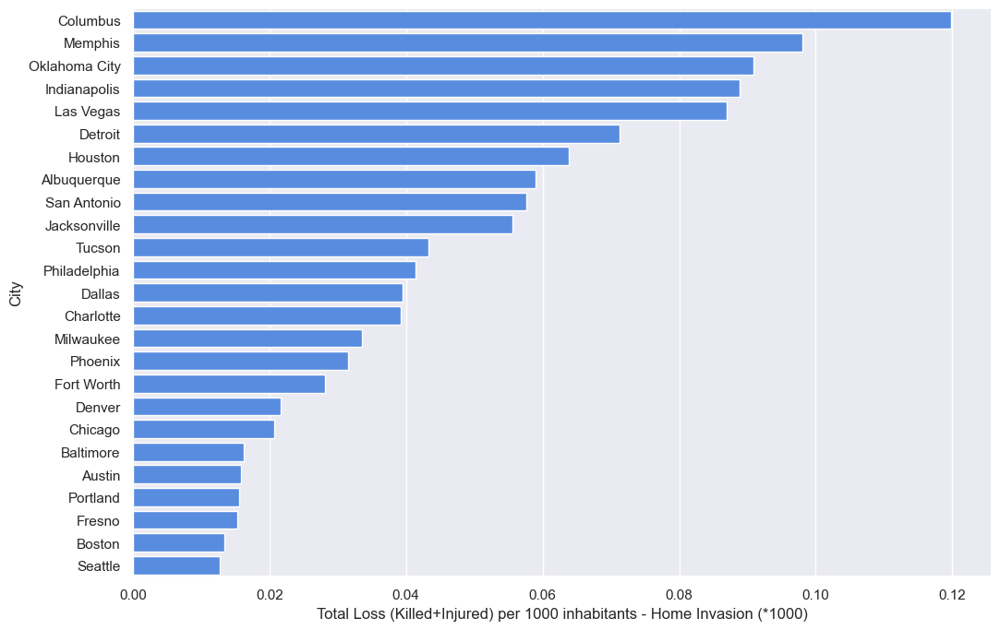

   Generando gráfica para característica: Accidental Shooting
Gráfica guardada como: bar_loss_population_ratio_20251119_005009.png


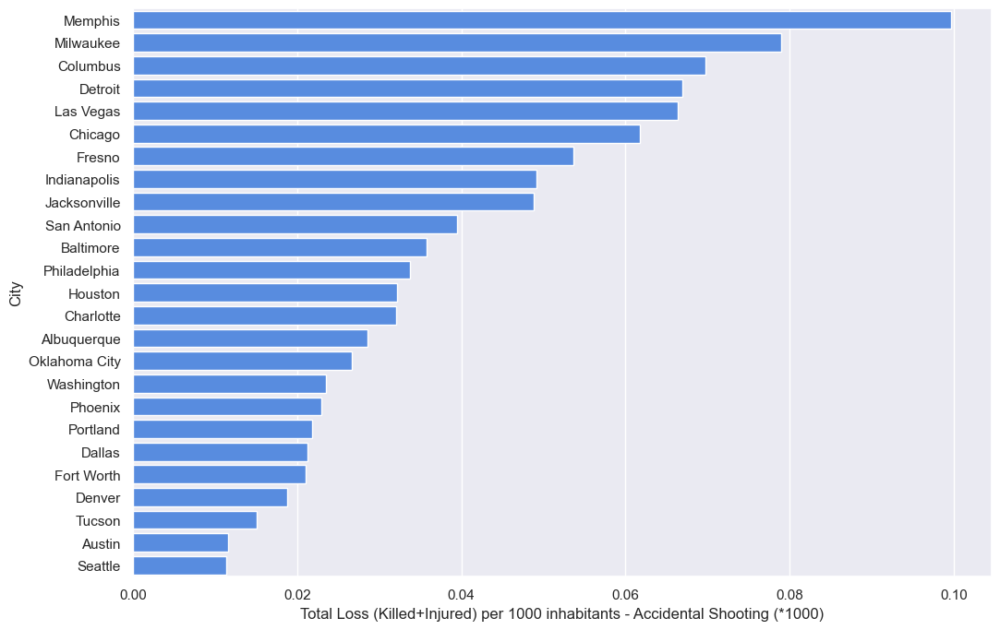

   Generando gráfica para característica: Stolen/Illegally owned gun{s} recovered during arrest/warrant
Gráfica guardada como: bar_loss_population_ratio_20251119_005010.png


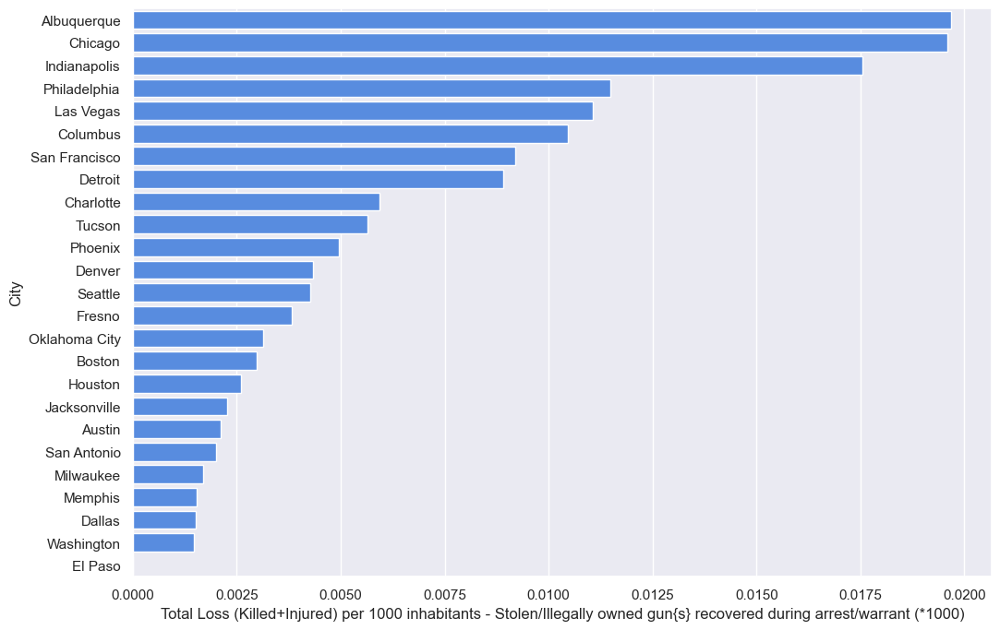

   Generando gráfica para característica: Defensive Use
Gráfica guardada como: bar_loss_population_ratio_20251119_005010.png


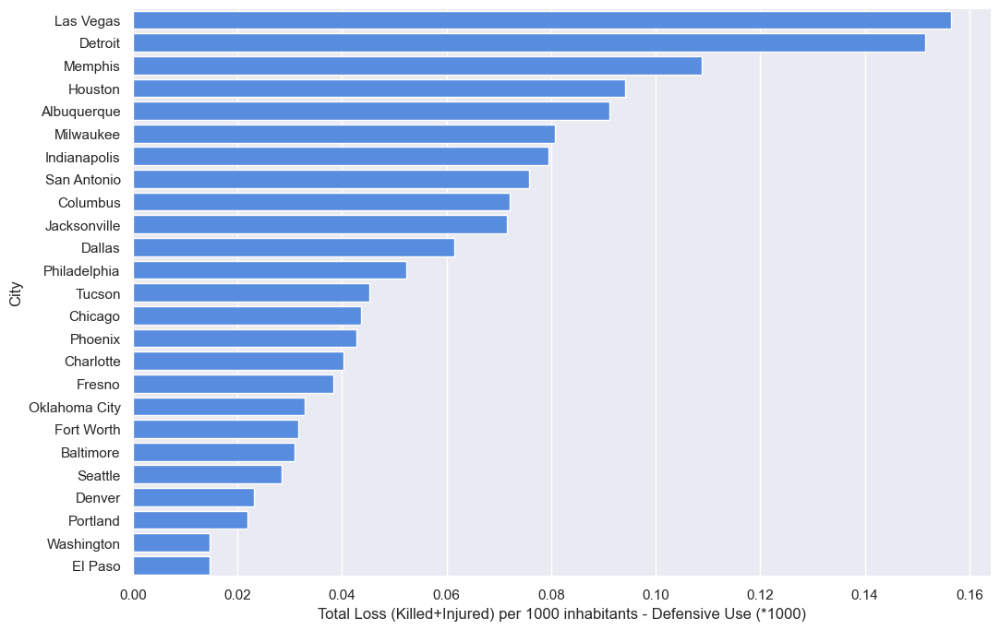

   Generando gráfica para característica: Accidental/Negligent Discharge
Gráfica guardada como: bar_loss_population_ratio_20251119_005011.png


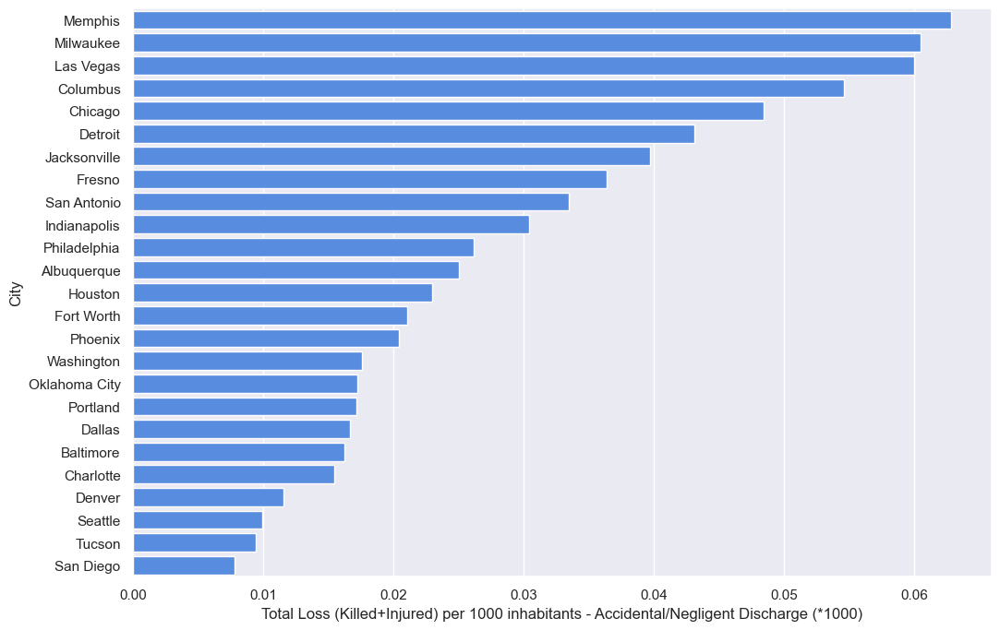

   Generando gráfica para característica: Gun(s) stolen from owner
Gráfica guardada como: bar_loss_population_ratio_20251119_005012.png


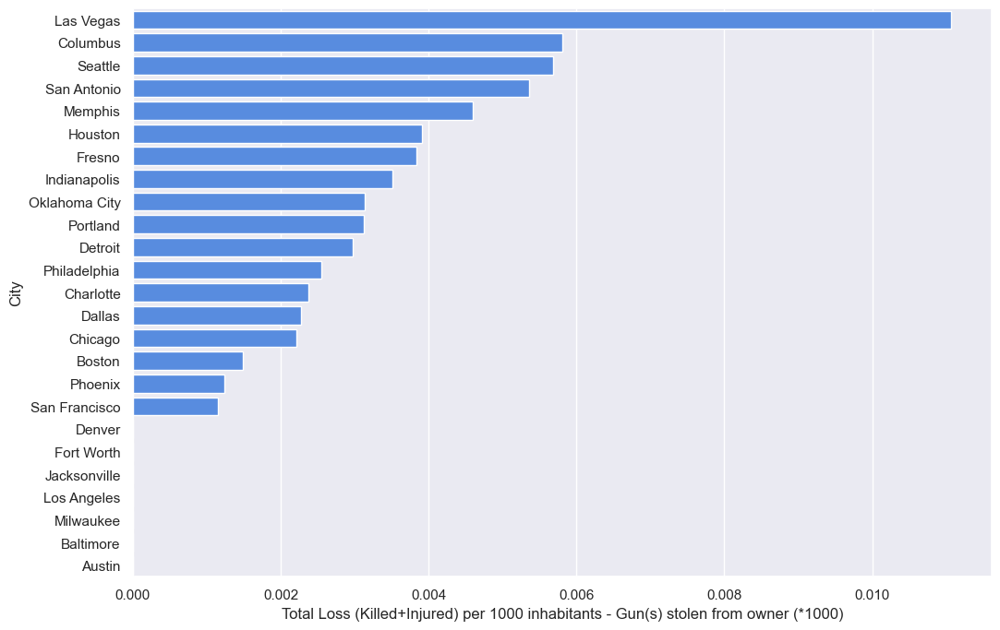

----------------------------------------------------------------------


In [ ]:
def clean_filename(name):
    cleaned = re.sub(r'[<>:"/\\|?*]', '_', name)
    if len(cleaned) > 50:
        cleaned = cleaned[:50]
    return cleaned.strip()

def grafica_ciudades(tempdf, ratio_col, titulo, color):
    # Crear nombre base para los archivos
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    clean_name = clean_filename(ratio_col)
    base_filename = f"bar_{clean_name}_{timestamp}"

    # Ordenar y filtrar
    i_p = tempdf.sort_values([ratio_col], ascending=False)
    i_p = i_p[i_p['city_population'] > 500000][:25]

    # Graficar
    sns.set(rc={'figure.figsize':(12,8)})
    ax = sns.barplot(y='city_or_county', x=ratio_col, data=i_p, color=color)
    ax.set(xlabel=f'{titulo} (*1000)', ylabel='City')

    # Guardar archivo
    filename = f"{base_filename}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Gráfica guardada como: {filename}")
    plt.show()
population = {'Carol Stream': '40069', 'La Quinta': '40956', 'Leander': '42761', 'Edinburg': '87650', 'Chino Hills': '78822', 'Pinellas Park': '52137', 'Pacifica': '39062', 'San Luis Obispo': '47536', 'Apache Junction': '39954', 'Toledo': '278508', 'Nampa': '91382', 'Jurupa Valley': '103541', 'Renton': '100953', 'Joplin': '52195', 'Pomona': '152494', 'Hoover': '84978', 'Columbia': '134309', 'Maple Grove': '69576', 'Rowlett': '61999', 'Bayonne': '66238', 'Fremont': '233136', 'Scottsdale': '246645', 'Bozeman': '45250', 'El Paso': '683080', 'Santa Maria': '106290', 'Cedar Park': '68918', 'Shelton': '41334', 'Atlanta': '472522', 'Kettering': '55306', 'Bartlett': '58622', 'Orem': '97499', 'Bullhead City': '39970', 'Bradenton': '55687', 'Waterloo': '67934', 'Scranton': '77291', 'Glendora': '51851', 'Lakeland': '106420', 'West Valley City': '136574', 'Moreno Valley': '205499', 'Brea': '42471', 'Normal': '54264', 'Bolingbrook': '74518', 'Rocky Mount': '55466', 'Redding': '91808', 'Chico': '91567', 'Virginia Beach': '452602', 'Charlotte': '842051', 'Parker': '51163', 'Bloomington': '85319', 'Wake Forest': '40112', 'Beaumont': '118299', 'Huntersville': '54839', 'Oakland Park': '44326', 'Beavercreek': '46376', 'Broken Arrow': '107403', 'Seattle': '704352', 'Santa Barbara': '91930', 'Sandy': '95836', 'El Monte': '115807', 'Grand Island': '51517', 'Santa Monica': '92478', 'Ocala': '59253', 'Oro Valley': '43781', 'Waco': '134432', 'Midwest City': '57305', 'Allentown': '120443', 'Garden Grove': '174858', 'Bellflower': '77790', 'Denver': '693060', 'Minot': '48743', 'Des Plaines': '58141', 'Burlington': '52709', 'Orange': '140504', 'Dunwoody': '48884', 'San Mateo': '103959', 'Minnetonka': '52369', 'Eagan': '66428', 'Oceanside': '175464', 'Avondale': '82881', 'Alameda': '78906', 'San Diego': '1406630', 'Haverhill': '62873', 'Waukegan': '88182', 'Daytona Beach': '66645', 'Grove City': '39721', 'Altoona': '44589', 'Hamilton': '62127', 'Kirkland': '87701', 'Honolulu': '351792', 'Macon-Bibb County': '152555', 'Stillwater': '49504', 'Colorado Springs': '465101', 'Cedar Hill': '48343', 'Jupiter': '63813', 'Overland Park': '188966', 'Boise City': '223154', 'Missoula': '72364', 'Burbank': '104447', 'Youngstown': '64312', 'Sunnyvale': '152771', 'Hoboken': '54379', 'Ankeny': '58627', 'Harrisonburg': '53078', 'Rancho Santa Margarita': '48969', 'Fitchburg': '40414', 'Revere': '53157', 'Fountain Valley': '56529', 'San Bruno': '42957', 'Pembroke Pines': '168587', 'Friendswood': '39396', 'Bountiful': '44078', 'Terre Haute': '60852', 'Methuen': '49917', 'Las Vegas': '632912', 'South San Francisco': '66980', 'Cedar Falls': '41390', 'Carlsbad': '113952', 'Quincy': '93688', 'Waterbury': '108272', 'Thornton': '136703', 'Mount Pleasant': '84170', 'Livermore': '89115', 'Lansing': '116020', 'Richmond': '223170', 'Providence': '179219', 'Clearwater': '114361', 'Pasadena': '153351', 'Clovis': '106583', 'Augusta-Richmond County': '197081', 'Lacey': '47688', 'East Providence': '47337', 'Columbus': '860090', 'Indianapolis': '855164', 'Danbury': '84992', 'Sarasota': '56610', 'Mountain View': '80447', 'South Bend': '101735', 'Watsonville': '53796', 'Ann Arbor': '120782', 'Valdosta': '56474', 'Berwyn': '55748', 'Akron': '197633', 'Memphis': '652717', 'Enid': '51004', 'Brighton': '38314', 'Lake Charles': '76848', 'West Lafayette': '45872', 'Littleton': '46333', 'Orlando': '277173', 'Loveland': '76897', 'Spanish Fork': '38861', 'Edmonds': '41840', 'Goose Creek': '42039', 'Monterey Park': '61075', 'Woburn': '39452', 'Upland': '76684', 'Edina': '51350', 'Bowling Green': '65234', 'Oxnard': '207906', 'San Rafael': '58954', 'Costa Mesa': '112822', 'Roseville': '132671', 'Birmingham': '212157', 'Bothell': '44546', 'Buckeye': '64629', 'Oklahoma City': '638367', 'Broomfield': '66529', 'Hattiesburg': '46926', 'West Des Moines': '64560', 'Denton': '133808', 'Weslaco': '40033', 'Flagstaff': '71459', 'Annapolis': '39418', 'Yucaipa': '53309', 'West Palm Beach': '108161', 'West Jordan': '113699', 'Bonita Springs': '54198', 'Plainfield': '50636', 'Buffalo Grove': '41346', 'Utica': '60652', 'Paterson': '147000', 'Fond du Lac': '42951', 'Harlingen': '65539', 'Ocoee': '44820', 'Moline': '42250', 'Paramount': '54909', 'Winter Garden': '41988', 'Phoenix': '1615017', 'State College': '41992', 'Irving': '238289', 'Edmond': '91191', 'Manhattan': '54983', 'Pocatello': '54746', 'Hartford': '123243', 'Missouri City': '74561', 'Summerville': '49323', 'Joliet': '148262', 'Azusa': '49628', 'Alpharetta': '65338', 'Boynton Beach': '75569', 'North Las Vegas': '238702', 'Sioux Falls': '174360', 'Chattanooga': '177571', 'Port Orange': '61105', 'Federal Way': '96757', 'Lexington-Fayette': '318449', 'Riverton': '42838', 'Chesapeake': '237940', 'Compton': '97550', 'Smyrna': '56664', 'Rock Island': '38210', 'Duluth': '86293', 'Petaluma': '60530', 'Doral': '57947', 'Wheaton': '53389', 'Oak Park': '51774', 'Wheeling': '38315', 'St. Louis': '311404', 'Ceres': '48278', 'Tallahassee': '190894', 'Lakewood': '154393', 'Mount Prospect': '54171', 'Nashua': '87882', 'Rocklin': '62787', 'Woonsocket': '41406', 'Salinas': '157218', 'Janesville': '64159', 'New Rochelle': '79557', 'Euclid': '47360', 'Turlock': '72796', 'Schenectady': '64913', 'McKinney': '172298', 'Yorba Linda': '68235', 'Redondo Beach': '67867', 'Bowie': '58393', 'Grapevine': '51971', 'Arlington': '392772', 'Perth Amboy': '52499', 'Wyoming': '75567', 'Montgomery': '200022', 'Newark': '281764', 'Apple Valley': '72553', 'Wilson': '49620', 'Sandy Springs': '105703', 'Charlottesville': '46912', 'Warwick': '81579', 'Pico Rivera': '63635', 'Irvine': '266122', 'Waltham': '63002', 'Chesterfield': '47659', 'Palm Beach Gardens': '53778', 'Lodi': '64641', 'Stanton': '38644', 'Thousand Oaks': '128888', 'Harrisburg': '48904', 'Elyria': '53715', 'Marlborough': '39697', 'Menifee': '88531', 'Fort Wayne': '264488', 'Conroe': '82286', 'Medford': '81636', 'Rochester Hills': '73422', 'Jonesboro': '74889', 'Carrollton': '133351', 'Lenexa': '52903', 'West New York': '53343', 'Vallejo': '121299', 'Cutler Bay': '44707', 'Norfolk': '245115', 'Rogers': '65021', 'Colton': '54712', 'Miami': '453579', 'Lorain': '63730', 'Kyle': '39060', 'Cerritos': '50555', 'Topeka': '126808', 'Kenosha': '99631', 'New Britain': '72558', 'Brookhaven': '52444', 'Glenview': '47475', 'Montclair': '38944', 'Tigard': '51902', 'Indio': '88488', 'East Lansing': '48870', 'North Port': '64274', 'Pittsburg': '70679', 'Savannah': '146763', 'Newton': '89045', 'Pharr': '77320', 'Fort Worth': '854113', 'McAllen': '142212', 'Palm Coast': '85109', 'North Little Rock': '66278', 'Gary': '76424', 'Orland Park': '58862', 'Gilroy': '55069', 'Coppell': '41360', 'Maricopa': '46903', 'Pearland': '113570', 'Sparks': '98345', 'Evanston': '74895', 'San Clemente': '65309', 'Hesperia': '93724', 'Port St. Lucie': '185132', 'Reading': '87575', 'Rosemead': '54500', 'Gilbert': '237133', 'Laredo': '257156', 'Folsom': '77271', 'Bossier City': '68485', 'Elizabeth': '128640', 'Westland': '81545', 'Everett': '109043', 'Hawthorne': '88031', 'Dubuque': '58531', 'Hilton Head Island': '40500', 'Palm Bay': '110104', 'Newport News': '181825', 'Hanford': '55547', 'Manchester': '110506', 'Chino': '87776', 'Euless': '54769', 'Cranston': '81034', 'Miami Beach': '91917', 'St. Charles': '69293', 'Florissant': '51776', 'Diamond Bar': '56793', 'Iowa City': '74398', 'Kentwood': '51689', 'Barnstable Town': '44254', 'Frisco': '163656', 'Tucson': '530706', 'Apopka': '49458', 'Urbandale': '43018', 'St. Louis Park': '48747', 'Westfield': '41552', 'Redwood City': '84950', 'Buffalo': '256902', 'Cambridge': '110651', 'Lake Oswego': '38945', 'Boston': '673184', 'Kennewick': '80454', 'Dayton': '140489', 'Delray Beach': '67371', 'Layton': '75655', 'Owensboro': '59273', 'Sunrise': '93734', 'Arlington Heights': '75525', 'Huntington': '48113', 'Erie': '98593', 'Longview': '82055', 'Norwalk': '106178', 'Sanford': '58605', 'Ontario': '173212', 'Eastvale': '61151', 'Georgetown': '67140', 'Noblesville': '60183', 'Jackson': '169148', 'Hollywood': '151998', 'New Braunfels': '73959', 'Miramar': '138449', 'West Haven': '54516', 'Prescott Valley': '43132', 'Novi': '59211', 'Rancho Palos Verdes': '42435', 'Placentia': '52228', 'Miami Gardens': '113058', 'Alhambra': '85474', 'Jeffersonville': '47124', 'Blue Springs': '54431', 'Shreveport': '194920', 'Escondido': '151613', 'Mesa': '484587', 'Cathedral City': '54056', 'Sioux City': '82872', 'Lincoln': '280364', 'Great Falls': '59178', 'Vineland': '60525', 'Rockville': '66940', 'Hagerstown': '40452', 'La Crosse': '52109', 'Fort Smith': '88133', 'Tinley Park': '56831', 'Malden': '60840', 'Beverly': '41365', 'Lawton': '94653', 'Flower Mound': '73547', 'Kalamazoo': '75984', 'Wichita Falls': '104724', 'Concord': '128726', 'Morgan Hill': '44155', 'Anderson': '55130', 'Schertz': '39453', 'Auburn': '77472', 'New York': '8537673', 'Hendersonville': '57050', 'Hurst': '39160', 'Casper': '59324', 'Ormond Beach': '42162', 'Buena Park': '83156', 'Haltom City': '44361', 'Rockwall': '43586', 'Abilene': '122225', 'Crystal Lake': '40339', 'Lubbock': '252506', 'Sumter': '40723', 'Philadelphia': '1567872', 'Westminster': '113875', 'Downey': '113267', 'Parma': '79425', 'Danville': '44631', 'DeKalb': '43194', 'Fort Myers': '77146', 'North Lauderdale': '43699', 'Torrance': '147195', 'Odessa': '117871', 'Sayreville': '44905', 'Shoreline': '55333', 'Muskogee': '38352', 'Mankato': '41720', 'Linden': '42457', 'Logan': '50676', 'Grand Junction': '61881', 'Grand Rapids': '196445', 'Carpentersville': '38291', 'Antioch': '110898', 'Sheboygan': '48686', 'Appleton': '74370', 'Dothan': '68468', 'Decatur': '72706', 'Pueblo': '110291', 'Greenacres': '40013', 'Hallandale Beach': '39500', 'Elk Grove': '169743', 'Cape Girardeau': '39628', 'Ogden': '86701', 'Frederick': '70060', 'Lafayette': '127626', 'Manassas': '41483', 'Prescott': '42513', 'Kannapolis': '47839', 'San Bernardino': '216239', 'Pleasant Grove': '38756', 'Romeoville': '39706', 'El Centro': '44201', 'Galveston': '50550', 'Trenton': '84056', 'Fall River': '88930', 'Chapel Hill': '59246', 'Coral Gables': '50815', 'Union City': '75322', 'Coon Rapids': '62359', 'Suffolk': '89273', 'Lauderhill': '71626', 'Encinitas': '63131', 'Bend': '91122', 'La Puente': '40377', 'Corpus Christi': '325733', 'Marion': '38480', 'Duncanville': '39457', 'Hickory': '40567', 'Sierra Vista': '43208', 'Hammond': '77134', 'Shawnee': '65194', 'South Gate': '95538', 'Burnsville': '61290', 'Ames': '66191', 'Davis': '68111', 'Clarksville': '150287', 'Kent': '127514', 'Charleston': '134385', 'Collierville': '49177', 'Lynchburg': '80212', 'Independence': '117030', 'Henderson': '292969', 'Redmond': '62458', 'Tulsa': '403090', 'Laguna Niguel': '65328', 'Sacramento': '495234', 'Johns Creek': '83873', 'Lewisville': '104659', 'York': '43859', 'Fishers': '90127', 'DeSoto': '52599', 'Biloxi': '45975', 'Whittier': '86883', 'Camarillo': '67363', 'Redlands': '71288', 'The Colony': '42408', 'Saginaw': '48984', 'Altamonte Springs': '43492', 'Dublin': '59583', 'Jefferson City': '43013', 'Cedar Rapids': '131127', 'Mentor': '46732', 'Sherman': '41567', 'Rio Rancho': '96028', 'Largo': '83065', 'St. Cloud': '67641', 'Niagara Falls': '48632', 'Santa Clarita': '181972', 'Olympia': '51202', 'Warner Robins': '74388', 'Moore': '61415', 'Sammamish': '63773', 'Washington': '681170', 'Covington': '40797', 'Minneapolis': '413651', 'Cuyahoga Falls': '49206', 'Visalia': '131074', 'Livonia': '94041', 'Salt Lake City': '193744', 'Casa Grande': '54534', 'Allen': '99179', 'Chula Vista': '267172', 'Pawtucket': '71427', 'White Plains': '58241', 'Camden': '74420', 'Manteca': '76908', 'Gulfport': '72076', 'Rochester': '208880', 'Fontana': '209665', 'Knoxville': '186239', 'San Leandro': '90465', 'Arvada': '117453', 'Rapid City': '74048', 'Kokomo': '57799', 'Bremerton': '40675', 'Cheyenne': '64019', 'Grand Forks': '57339', 'Surprise': '132677', 'Downers Grove': '49473', 'San Buenaventura (Ventura)': '109592', 'Evansville': '119477', 'St. Peters': '57289', 'Cicero': '82992', 'Coral Springs': '130059', 'Poway': '50077', 'Southaven': '53214', 'Taylorsville': '60436', 'Pontiac': '59698', 'Hempstead': '55555', 'Wausau': '38872', 'Aurora': '361710', 'Lehi': '61130', 'New Orleans': '391495', 'Elmhurst': '46387', 'Los Angeles': '3976322', 'Strongsville': '44631', 'San Antonio': '1492510', 'Rockford': '147651', 'Marana': '43474', 'Kenner': '67089', 'North Charleston': '109298', 'Bell Gardens': '42806', 'Bridgeport': '145936', 'Hoffman Estates': '51738', 'Blacksburg': '45038', 'Milford': '52536', 'Tustin': '80395', 'Round Rock': '120892', 'Streamwood': '40166', 'College Station': '112141', 'Sugar Land': '88177', 'Pompano Beach': '109393', 'Maplewood': '40150', 'Cupertino': '60643', 'Portsmouth': '95252', 'Daly City': '106472', 'Battle Creek': '51534', 'Santa Fe': '83875', 'Holyoke': '40280', 'Modesto': '212175', 'Mesquite': '143736', 'La Mirada': '49216', 'Eden Prairie': '63914', 'Tacoma': '211277', 'Cypress': '48906', 'Weymouth Town': '55972', 'Palm Springs': '47689', 'Santa Clara': '125948', 'Kearny': '42126', 'Delaware': '38643', 'Fullerton': '140721', 'San Gabriel': '40404', 'Schaumburg': '74446', 'Santa Ana': '334217', 'Riverside': '324722', 'Lompoc': '43712', 'Temple': '73600', 'Peachtree Corners': '42773', 'Cary': '162320', 'Victorville': '122265', 'Johnson City': '66677', 'Chicago': '2704958', 'Cape Coral': '179804', 'Farmington': '41629', 'Apex': '47349', 'El Cajon': '103768', 'Marietta': '60941', 'Mansfield': '65631', 'Perris': '76331', 'Twin Falls': '48260', 'League City': '102010', 'Germantown': '39056', 'Rohnert Park': '42622', 'New Bedford': '95032', 'Port Arthur': '55427', 'Leominster': '41663', 'Puyallup': '40640', 'Wellington': '63900', 'West Allis': '60087', 'Anaheim': '351043', 'Richardson': '113347', 'Fayetteville': '204759', 'Davenport': '102612', 'New Brunswick': '56910', 'Sterling Heights': '132427', 'Elgin': '112123', "Lee's Summit": '96076', 'Conway': '65300', 'Deltona': '90124', 'North Miami Beach': '43891', 'Merced': '82594', 'Worcester': '184508', 'Delano': '52707', 'Martinez': '38259', 'Salem': '167419', 'Bethlehem': '75293', 'St. George': '82318', 'Cleveland': '385809', 'Campbell': '40939', 'Lynwood': '71187', 'Leesburg': '52607', 'Somerville': '81322', 'City': '2016 Population', 'Temecula': '113054', 'Inglewood': '110654', 'Bismarck': '72417', 'Murrieta': '111674', 'Pensacola': '53779', 'Hackensack': '44756', 'Plantation': '92706', 'St. Clair Shores': '59775', 'Coachella': '44953', 'Chandler': '247477', 'Lowell': '110558', 'Oak Lawn': '56257', 'Mishawaka': '48679', 'Norwich': '39556', 'Huntsville': '193079', 'Lake Havasu City': '53743', 'Amarillo': '199582', 'Hemet': '84281', 'Mobile': '192904', 'Fort Pierce': '45295', 'Rancho Cordova': '72326', 'San Ramon': '75639', 'Oshkosh': '66579', 'Muskegon': '38349', 'Plano': '286057', 'Beaverton': '97590', 'Waukesha': '72363', 'San Angelo': '100702', 'Centennial': '109932', 'Bakersfield': '376380', 'Gastonia': '75536', 'Chelsea': '39699', 'Anchorage': '298192', 'Athens-Clarke County': '123371', 'Freeport': '43279', 'Kansas City': '481420', 'Skokie': '64270', 'Deerfield Beach': '79764', 'Culver City': '39364', 'Raleigh': '458880', 'Bristol': '60147', 'Glendale': '245895', 'Monroe': '49297', 'Rialto': '103314', 'Carmel': '91065', 'Houston': '2303482', 'Hampton': '135410', 'Garland': '234943', 'Cleveland Heights': '44633', 'Gresham': '111523', 'Reno': '245255', 'Council Bluffs': '62524', 'Citrus Heights': '87432', 'Des Moines': '215472', 'Milwaukee': '595047', 'Portland': '639863', 'Elkhart': '52221', 'St. Paul': '302398', 'Roanoke': '99660', 'Albany': '98111', 'Middletown': '48813', 'Richland': '54989', 'Woodland': '59068', 'Provo': '116868', 'Titusville': '46019', 'Tamarac': '65199', 'Tyler': '104798', 'Indian Trail': '38222', 'Santa Rosa': '175155', 'San Francisco': '870887', 'Plant City': '38200', 'Yuma': '94906', 'Spokane Valley': '96340', 'Bellevue': '141400', 'Champaign': '86637', 'Shakopee': '40610', 'Grand Prairie': '190682', 'Victoria': '67670', 'Flint': '97386', 'Marysville': '67626', 'Berkeley': '121240', 'Oakley': '40622', 'Dearborn': '94444', 'Palmdale': '157356', 'Chicopee': '55991', 'Tampa': '377165', 'Greenwood': '56545', 'Palm Desert': '52231', 'East Orange': '64789', 'Pine Bluff': '43841', 'Corona': '166785', 'Winston-Salem': '242203', 'Bellingham': '87574', 'Burleson': '45016', 'Castle Rock': '57666', 'Attleboro': '44434', 'Canton': '71323', 'Walnut Creek': '69122', 'Alexandria': '155810', 'Cincinnati': '298800', 'Fresno': '522053', 'West Covina': '107847', 'Kingsport': '52806', 'Hialeah': '236387', 'Long Beach': '470130', 'Troy': '83641', 'Durham': '263016', 'Wilkes-Barre': '40569', 'San Jacinto': '47413', 'San Marcos': '95261', 'Naperville': '147122', 'Warren': '135125', 'Rock Hill': '72937', 'Milpitas': '77528', 'Santee': '57834', 'Lynn': '92697', 'Caldwell': '53149', 'Gainesville': '131591', 'Palatine': '68766', 'Napa': '80416', 'Baytown': '75992', 'Louisville/Jefferson County': '616261', 'Baldwin Park': '76464', 'National City': '61147', 'Muncie': '69010', 'Goodyear': '77258', 'Meridian': '95623', 'Eugene': '166575', 'Murfreesboro': '131947', 'Jersey City': '264152', 'Draper': '47328', 'Passaic': '70635', 'Pittsburgh': '303625', 'Yakima': '93986', 'Albuquerque': '559277', 'Nashville-Davidson': '660388', 'North Richland Hills': '69798', 'Brockton': '95630', 'Syracuse': '143378', 'Arcadia': '58523', 'Spokane': '215973', 'Killeen': '143400', 'Wichita': '389902', 'San Jose': '1025350', 'Davie': '101871', 'High Point': '111223', 'Las Cruces': '101759', 'Longmont': '92858', 'Margate': '57870', 'Brownsville': '183823', 'Oviedo': '39337', 'Madison': '252551', 'Taylor': '61177', 'Fort Collins': '164207', 'Westerville': '38985', 'Atlantic City': '38735', 'Peabody': '52491', 'Commerce City': '54869', 'Tuscaloosa': '99543', 'Roy': '38201', 'Blaine': '62892', 'La Habra': '61664', 'Huntington Beach': '200652', 'Keizer': '38980', 'Brooklyn Park': '79707', 'Rancho Cucamonga': '176534', 'Pasco': '70579', 'Salina': '47336', 'Midland': '134610', 'Dallas': '1317929', 'Urbana': '42014', 'Novato': '56004', 'Winter Haven': '38953', 'Greenville': '91495', 'St. Petersburg': '260999', 'Fairfield': '114756', 'Portage': '48508', 'Meriden': '59622', 'Tulare': '62779', 'Corvallis': '57110', 'Racine': '77571', 'Boulder': '108090', 'Fort Lauderdale': '178752', 'Findlay': '41422', 'Norman': '122180', 'Lawrence': '95358', 'Aliso Viejo': '51424', 'Baton Rouge': '227715', 'Asheville': '89121', 'Santa Cruz': '64465', 'Newport Beach': '86688', 'Binghamton': '45672', 'Billings': '110323', 'Olathe': '135473', 'Kissimmee': '69369', 'Vacaville': '98303', 'Calexico': '40232', 'Homestead': '67996', 'Green Bay': '105139', 'Bryan': '83260', 'Boca Raton': '96114', 'Bedford': '49528', "Coeur d'Alene": '50285', 'Hutchinson': '41310', 'Little Rock': '198541', 'Detroit': '672795', 'Lake Forest': '83240', 'Belleville': '41906', 'Franklin': '74794', 'Porterville': '58978', 'New Berlin': '39803', 'Highland': '54939', 'Austin': '947890', 'Greensboro': '287027', 'Southfield': '73100', 'Lake Elsinore': '64205', 'Stockton': '307072', 'Mission Viejo': '96396', 'Mount Vernon': '68344', 'Greeley': '103990', 'Madera': '64444', 'Murray': '49230', 'Pleasanton': '82270', 'Lombard': '43815', 'Lakeville': '61938', 'North Miami': '62139', 'Gaithersburg': '67776', 'Florence': '39959', 'Bentonville': '47093', 'Lancaster': '160106', 'Vista': '101659', 'Wylie': '47701', 'Yonkers': '200807', 'Springdale': '78557', 'Huntington Park': '58879', 'Dearborn Heights': '55761', 'Texas City': '48262', 'Pflugerville': '59245', 'Carson': '92797', 'Fargo': '120762', 'Idaho Falls': '60211', 'Vancouver': '174826', 'Little Elm': '42504', 'Hillsboro': '105164', 'Springfield': '167319', 'Coconut Creek': '59405', 'Weston': '70015', 'Wauwatosa': '47945', 'Tempe': '182498', 'Woodbury': '68820', 'Simi Valley': '126327', 'St. Joseph': '76472', 'Farmington Hills': '81129', 'South Jordan': '69034', 'Tracy': '89274', 'Hayward': '158937', 'Jacksonville': '880619', 'Milton': '38411', 'Carson City': '54742', 'Omaha': '446970', 'Northglenn': '38982', 'Yuba City': '66845', 'Wilmington': '117525', 'Gardena': '60048', 'Melbourne': '81185', 'Plymouth': '77216', 'Palo Alto': '67024', "O'Fallon": '86274', 'Eau Claire': '68339', 'Baltimore': '614664', 'Brentwood': '60532', 'New Haven': '129934', 'Covina': '48549', 'Pittsfield': '42846', 'Roswell': '94598', 'Taunton': '56843', 'Tupelo': '38842', 'Clifton': '85845', 'Mission': '83563', 'Montebello': '63335', 'West Sacramento': '52981', 'La Mesa': '59948', 'Royal Oak': '59006', 'Stamford': '129113', 'Keller': '46646', 'Moorhead': '42492', 'Oakland': '420005', 'Peoria': '164173', 'Burien': '50997'}
df['city_population'] = df['city_or_county'].apply(lambda x : int(population[x]) if x in population else 0)

# tempdf = df.groupby(by=['city_or_county']).agg({'n_killed': 'sum', 'n_injured' : 'sum', 'city_population' : 'mean', 'state' : 'count'}).reset_index().rename(columns={'state' : 'total_incidents', 'n_killed' : 'total_killed', 'n_injured' : 'total_injured'})
# # Calcular ratios
# tempdf['incidents_population_ratio'] = 1000*tempdf['total_incidents'] / (tempdf['city_population']+1)
# tempdf['killed_population_ratio'] = 1000*tempdf['total_killed'] / (tempdf['city_population']+1)
# tempdf['injured_population_ratio'] = 1000*tempdf['total_injured'] / (tempdf['city_population']+1)
# tempdf['loss_population_ratio'] = 1000*(tempdf['total_killed'] + tempdf['total_injured']) / (tempdf['city_population']+1)

# ratios = {
#     "incidents_population_ratio": ("Gun Violence Incidents per 1000 inhabitants", "#ed5569"),
#     "killed_population_ratio": ("Killed per 1000 inhabitants", "#85e86d"),
#     "injured_population_ratio": ("Injured per 1000 inhabitants", "#60f7f4"),
#     "loss_population_ratio": ("Total Loss (Killed+Injured) per 1000 inhabitants", "#4287f5")
# }

# for ratio_col, (titulo, color) in ratios.items():
#     print(f"Generando gráfica para: {ratio_col}")
#     grafica_ciudades(tempdf, ratio_col, titulo, color)
#     print("-"*50)

# Bucle externo: ratios
for ratio_col, (titulo, color) in ratios.items():
    print(f"=== Procesando ratio: {ratio_col} ===")

    # Bucle interno: características
    for caracteristica in solo_caracteristicas:
        print(f"   Generando gráfica para característica: {caracteristica}")

        # Filtrar el df por característica
        df_filtrado = df[df[caracteristica] == 1]

        # Construir tempdf para esa característica
        tempdf = df_filtrado.groupby(by=['city_or_county']).agg({
            'n_killed': 'sum',
            'n_injured': 'sum',
            'city_population': 'mean',
            'state': 'count'
        }).reset_index().rename(columns={
            'state': 'total_incidents',
            'n_killed': 'total_killed',
            'n_injured': 'total_injured'
        })

        # Calcular ratios
        tempdf['incidents_population_ratio'] = 1000*tempdf['total_incidents'] / (tempdf['city_population']+1)
        tempdf['killed_population_ratio'] = 1000*tempdf['total_killed'] / (tempdf['city_population']+1)
        tempdf['injured_population_ratio'] = 1000*tempdf['total_injured'] / (tempdf['city_population']+1)
        tempdf['loss_population_ratio'] = 1000*(tempdf['total_killed'] + tempdf['total_injured']) / (tempdf['city_population']+1)

        # Llamar a tu función de gráficas
        grafica_ciudades(tempdf, ratio_col, f"{titulo} - {caracteristica}", color)

    print("-"*70)




In [67]:
state_to_code = {'District of Columbia' : 'DC','Mississippi': 'MS', 'Oklahoma': 'OK', 'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI', 'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 'Nevada': 'NV', 'Maine': 'ME'}
laws_2014 = {'Mississippi': 5, 'Oklahoma': 9, 'Delaware': 38, 'Minnesota': 39, 'Illinois': 65, 'Arkansas': 11, 'New Mexico': 10, 'Ohio': 15, 'Indiana': 11, 'Maryland': 63, 'Louisiana': 12, 'Texas': 20, 'Wyoming': 6, 'Tennessee': 24, 'Arizona': 8, 'Wisconsin': 24, 'Michigan': 20, 'Kansas': 8, 'Utah': 11, 'Virginia': 12, 'Oregon': 24, 'Connecticut': 85, 'Montana': 4, 'California': 100, 'Idaho': 5, 'West Virginia': 24, 'South Carolina': 12, 'New Hampshire': 10, 'Massachusetts': 101, 'Vermont': 3, 'Georgia': 6, 'North Dakota': 14, 'Pennsylvania': 37, 'Florida': 21, 'Alaska': 3, 'Kentucky': 7, 'Hawaii': 78, 'Nebraska': 22, 'Missouri': 8, 'Iowa': 25, 'Alabama': 10, 'Rhode Island': 43, 'South Dakota': 5, 'Colorado': 30, 'New Jersey': 67, 'Washington': 41, 'North Carolina': 30, 'New York': 76, 'Nevada': 11, 'Maine': 11}
laws_2015 = {'Mississippi': 2, 'Oklahoma': 9, 'Delaware': 38, 'Minnesota': 41, 'Illinois': 65, 'Arkansas': 11, 'New Mexico': 10, 'Ohio': 16, 'Indiana': 11, 'Maryland': 64, 'Louisiana': 12, 'Texas': 20, 'Wyoming': 6, 'Tennessee': 24, 'Arizona': 8, 'Wisconsin': 23, 'Michigan': 21, 'Kansas': 4, 'Utah': 11, 'Virginia': 12, 'Oregon': 33, 'Connecticut': 85, 'Montana': 4, 'California': 102, 'Idaho': 6, 'West Virginia': 24, 'South Carolina': 12, 'New Hampshire': 10, 'Massachusetts': 101, 'Vermont': 6, 'Georgia': 6, 'North Dakota': 14, 'Pennsylvania': 37, 'Florida': 21, 'Alaska': 3, 'Kentucky': 7, 'Hawaii': 78, 'Nebraska': 22, 'Missouri': 8, 'Iowa': 25, 'Alabama': 10, 'Rhode Island': 43, 'South Dakota': 5, 'Colorado': 30, 'New Jersey': 67, 'Washington': 41, 'North Carolina': 30, 'New York': 76, 'Nevada': 15, 'Maine': 11}
laws_2016 = {'Mississippi': 2, 'Oklahoma': 9, 'Delaware': 39, 'Minnesota': 41, 'Illinois': 65, 'Arkansas': 11, 'New Mexico': 10, 'Ohio': 16, 'Indiana': 12, 'Maryland': 64, 'Louisiana': 12, 'Texas': 18, 'Wyoming': 6, 'Tennessee': 22, 'Arizona': 8, 'Wisconsin': 23, 'Michigan': 21, 'Kansas': 4, 'Utah': 11, 'Virginia': 13, 'Oregon': 35, 'Connecticut': 90, 'Montana': 4, 'California': 104, 'Idaho': 2, 'West Virginia': 18, 'South Carolina': 12, 'New Hampshire': 10, 'Massachusetts': 101, 'Vermont': 6, 'Georgia': 6, 'North Dakota': 14, 'Pennsylvania': 37, 'Florida': 21, 'Alaska': 3, 'Kentucky': 7, 'Hawaii': 79, 'Nebraska': 22, 'Missouri': 7, 'Iowa': 25, 'Alabama': 10, 'Rhode Island': 43, 'South Dakota': 5, 'Colorado': 30, 'New Jersey': 67, 'Washington': 43, 'North Carolina': 30, 'New York': 76, 'Nevada': 15, 'Maine': 11}
laws_2017 = {'Mississippi': 2, 'Oklahoma': 9, 'Delaware': 40, 'Minnesota': 41, 'Illinois': 65, 'Arkansas': 11, 'New Mexico': 10, 'Ohio': 16, 'Indiana': 12, 'Maryland': 64, 'Louisiana': 13, 'Texas': 18, 'Wyoming': 6, 'Tennessee': 22, 'Arizona': 8, 'Wisconsin': 23, 'Michigan': 21, 'Kansas': 4, 'Utah': 13, 'Virginia': 13, 'Oregon': 35, 'Connecticut': 90, 'Montana': 4, 'California': 106, 'Idaho': 2, 'West Virginia': 18, 'South Carolina': 12, 'New Hampshire': 9, 'Massachusetts': 101, 'Vermont': 6, 'Georgia': 6, 'North Dakota': 10, 'Pennsylvania': 37, 'Florida': 21, 'Alaska': 3, 'Kentucky': 7, 'Hawaii': 79, 'Nebraska': 22, 'Missouri': 2, 'Iowa': 24, 'Alabama': 10, 'Rhode Island': 53, 'South Dakota': 5, 'Colorado': 30, 'New Jersey': 75, 'Washington': 43, 'North Carolina': 30, 'New York': 76, 'Nevada': 21, 'Maine': 11}


In [68]:
leyes_por_estado = laws_2016  # puedes cambiar a laws_2014, laws_2015, etc.

for caracteristica in solo_caracteristicas:
    print(f"Generando gráfico interactivo para: {caracteristica}")

    # Filtrar incidentes con esa característica
    df_filtrado = df[df[caracteristica] == 1]

    # Agrupar por estado
    incidents_by_state = df_filtrado.groupby("state").size().reset_index(name="incidents")

    # Merge con StatesPop
    merged = incidents_by_state.merge(StatesPop, on="state", how="left")

    # Añadir número de leyes por estado
    merged["gun_laws"] = merged["state"].map(leyes_por_estado)
    merged["gun_laws"] = merged["gun_laws"].fillna(0)

    # Eje X: polarización firmada
    merged["mov_signed"] = merged.apply(
        lambda row: row["mov"] if row["republican indicator"] == 1 else -row["mov"], axis=1
    )

    # Texto para hover
    merged["hovertext"] = merged.apply(
        lambda row: f"{row['state']}<br>Incidentes: {row['incidents']}<br>Partido: {'Republicano' if row['republican indicator'] == 1 else 'Demócrata'}<br>Polarización: {row['mov_signed']:.3f}<br>Leyes estatales: {row['gun_laws']}", axis=1
    )

    # Crear gráfico interactivo
    trace = go.Scatter(
        x=merged["mov_signed"],
         y =(merged["incidents"] /merged["POPESTIMATE2017"]) * 100000,
        mode='markers',
        marker=dict(
            size=merged["gun_laws"] * 0.5,  # escala de tamaño por leyes
            color=merged["republican indicator"].map({0: "#3c8dbc", 1: "#dd4b39"}),
            line=dict(width=1, color='white'),
            opacity=0.8
        ),
        text=merged["hovertext"],
        hoverinfo='text'
    )

    layout = go.Layout(
        title=f"Incidentes vs Polarización Electoral - {caracteristica}",
        xaxis=dict(title="Polarización (mov): negativo = demócrata, positivo = republicano"),
        yaxis=dict(title="Número de incidentes con esa característica por cada 100,000 habitantes"),
        height=600,
        margin=dict(l=80, r=40, t=80, b=80),
        showlegend=False
    )

    fig = go.Figure(data=[trace], layout=layout)
    fig.update_layout(template="plotly_white")
    fig.show()


Generando gráfico interactivo para: Shot - Wounded/Injured


Generando gráfico interactivo para: Shot - Dead (murder, accidental, suicide)


Generando gráfico interactivo para: Non-Shooting Incident


Generando gráfico interactivo para: Shots Fired - No Injuries


Generando gráfico interactivo para: Possession (gun(s) found during commission of other crimes)


Generando gráfico interactivo para: Armed robbery with injury/death and/or evidence of DGU found


Generando gráfico interactivo para: Brandishing/flourishing/open carry/lost/found


Generando gráfico interactivo para: ATF/LE Confiscation/Raid/Arrest


Generando gráfico interactivo para: Officer Involved Incident


Generando gráfico interactivo para: Possession of gun by felon or prohibited person


Generando gráfico interactivo para: Drug involvement


Generando gráfico interactivo para: Drive-by (car to street, car to car)


Generando gráfico interactivo para: Institution/Group/Business


Generando gráfico interactivo para: Domestic Violence


Generando gráfico interactivo para: Home Invasion


Generando gráfico interactivo para: Accidental Shooting


Generando gráfico interactivo para: Stolen/Illegally owned gun{s} recovered during arrest/warrant


Generando gráfico interactivo para: Defensive Use


Generando gráfico interactivo para: Accidental/Negligent Discharge


Generando gráfico interactivo para: Gun(s) stolen from owner


In [64]:
for caracteristica in solo_caracteristicas:
    print(f"Generando gráfico interactivo para: {caracteristica}")

    # Filtrar incidentes con esa característica
    df_filtrado = df[df[caracteristica] == 1]

    # Agrupar por estado
    incidents_by_state = df_filtrado.groupby("state").size().reset_index(name="incidents")

    # Merge con StatesPop
    merged = incidents_by_state.merge(StatesPop, on="state", how="left")

    # Añadir número de leyes por estado
    merged["gun_laws"] = merged["state"].map(laws_2017).fillna(0)

    # Calcular tasa de incidentes por cada 100,000 habitantes
    merged["incidents_per_100k"] = (merged["incidents"] / merged["POPESTIMATE2017"]) * 100000

    # Eje X: polarización firmada
    merged["mov_signed"] = merged.apply(
        lambda row: row["mov"] if row["republican indicator"] == 1 else -row["mov"], axis=1
    )

    # Texto para hover
    merged["hovertext"] = merged.apply(
        lambda row: f"{row['state']}<br>Incidentes: {row['incidents']}<br>Tasa por 100k: {row['incidents_per_100k']:.2f}<br>Partido: {'Republicano' if row['republican indicator'] == 1 else 'Demócrata'}<br>Polarización: {row['mov_signed']:.3f}<br>Leyes estatales: {row['gun_laws']}", axis=1
    )

    # Crear gráfico interactivo
    trace = go.Scatter(
        x=merged["mov_signed"],
        y=merged["incidents_per_100k"],   # ahora usamos la tasa en el eje Y
        mode='markers',
        marker=dict(
            size=merged["gun_laws"] * 0.5,
            color=merged["republican indicator"].map({0: "#3c8dbc", 1: "#dd4b39"}),
            line=dict(width=1, color='white'),
            opacity=0.8
        ),
        text=merged["hovertext"],
        hoverinfo='text'
    )

    layout = go.Layout(
        title=f"Tasa de Incidentes por 100k vs Polarización Electoral - {caracteristica}",
        xaxis=dict(title="Polarización (mov): negativo = demócrata, positivo = republicano"),
        yaxis=dict(title="Incidentes por cada 100,000 habitantes"),
        height=600,
        margin=dict(l=80, r=40, t=80, b=80),
        showlegend=False
    )

    fig = go.Figure(data=[trace], layout=layout)
    fig.update_layout(template="plotly_white")
    fig.show()


Generando gráfico interactivo para: Shot - Wounded/Injured


Generando gráfico interactivo para: Shot - Dead (murder, accidental, suicide)


Generando gráfico interactivo para: Non-Shooting Incident


Generando gráfico interactivo para: Shots Fired - No Injuries


Generando gráfico interactivo para: Possession (gun(s) found during commission of other crimes)


Generando gráfico interactivo para: Armed robbery with injury/death and/or evidence of DGU found


Generando gráfico interactivo para: Brandishing/flourishing/open carry/lost/found


Generando gráfico interactivo para: ATF/LE Confiscation/Raid/Arrest


Generando gráfico interactivo para: Officer Involved Incident


Generando gráfico interactivo para: Possession of gun by felon or prohibited person


Generando gráfico interactivo para: Drug involvement


Generando gráfico interactivo para: Drive-by (car to street, car to car)


Generando gráfico interactivo para: Institution/Group/Business


Generando gráfico interactivo para: Domestic Violence


Generando gráfico interactivo para: Home Invasion


Generando gráfico interactivo para: Accidental Shooting


Generando gráfico interactivo para: Stolen/Illegally owned gun{s} recovered during arrest/warrant


Generando gráfico interactivo para: Defensive Use


Generando gráfico interactivo para: Accidental/Negligent Discharge


Generando gráfico interactivo para: Gun(s) stolen from owner


Generando scatter estático para: Shot - Wounded/Injured
Generando scatter estático para: Shot - Dead (murder, accidental, suicide)
Generando scatter estático para: Non-Shooting Incident
Generando scatter estático para: Shots Fired - No Injuries
Generando scatter estático para: Possession (gun(s) found during commission of other crimes)
Generando scatter estático para: Armed robbery with injury/death and/or evidence of DGU found
Generando scatter estático para: Brandishing/flourishing/open carry/lost/found
Generando scatter estático para: ATF/LE Confiscation/Raid/Arrest
Generando scatter estático para: Officer Involved Incident
Generando scatter estático para: Possession of gun by felon or prohibited person
Generando scatter estático para: Drug involvement
Generando scatter estático para: Drive-by (car to street, car to car)
Generando scatter estático para: Institution/Group/Business
Generando scatter estático para: Domestic Violence
Generando scatter estático para: Home Invasion
Genera

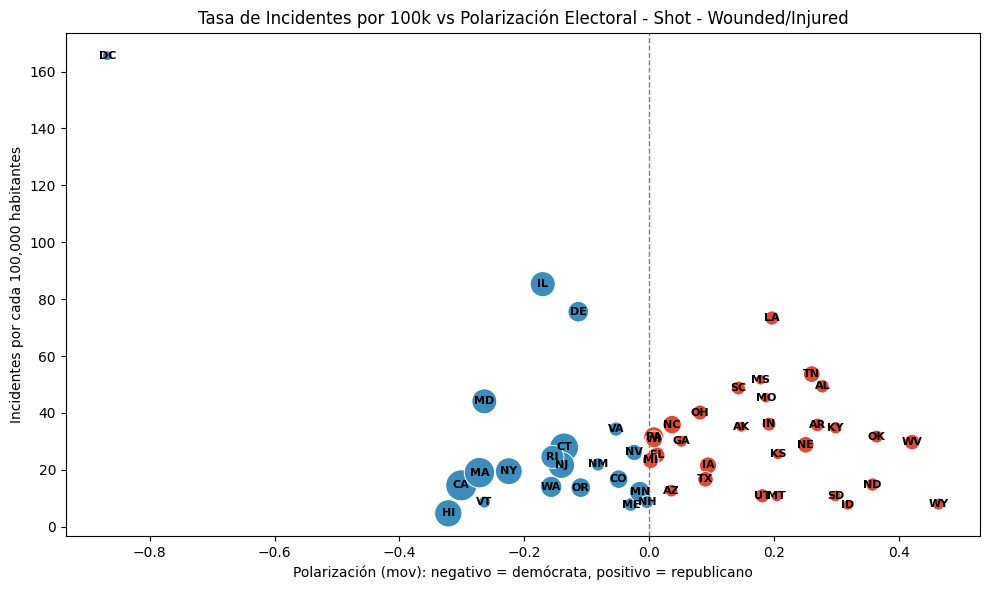

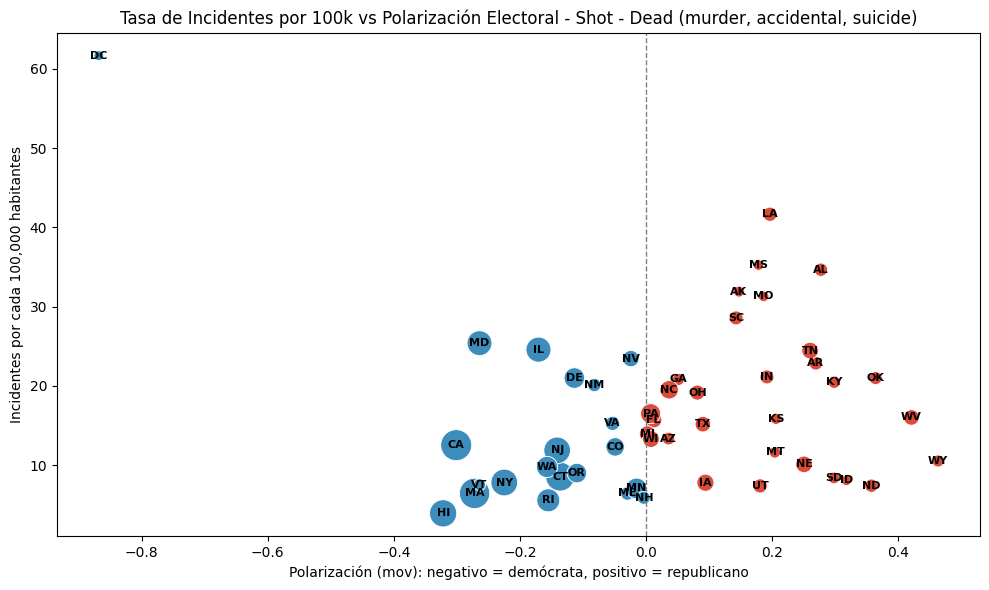

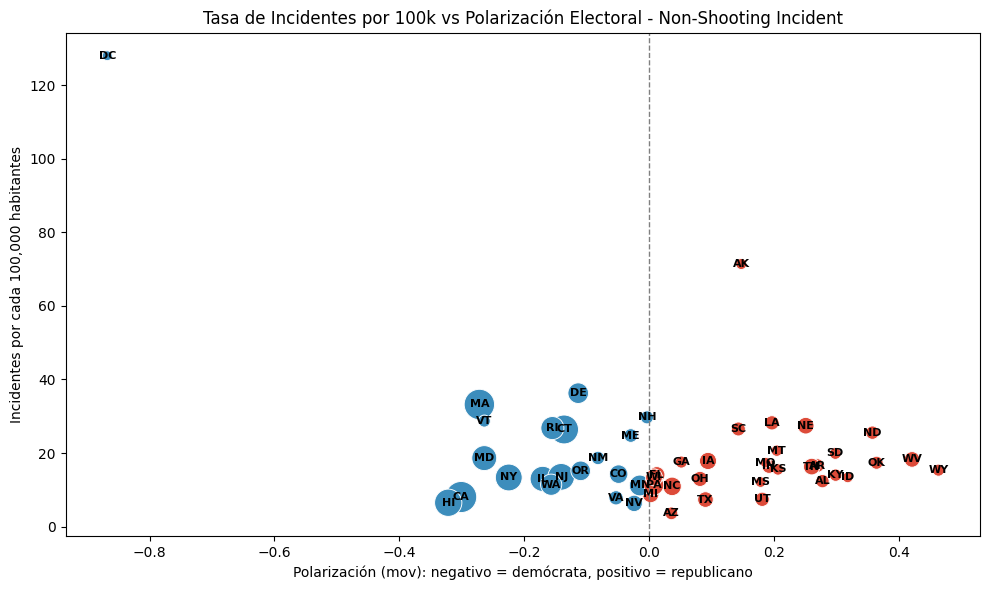

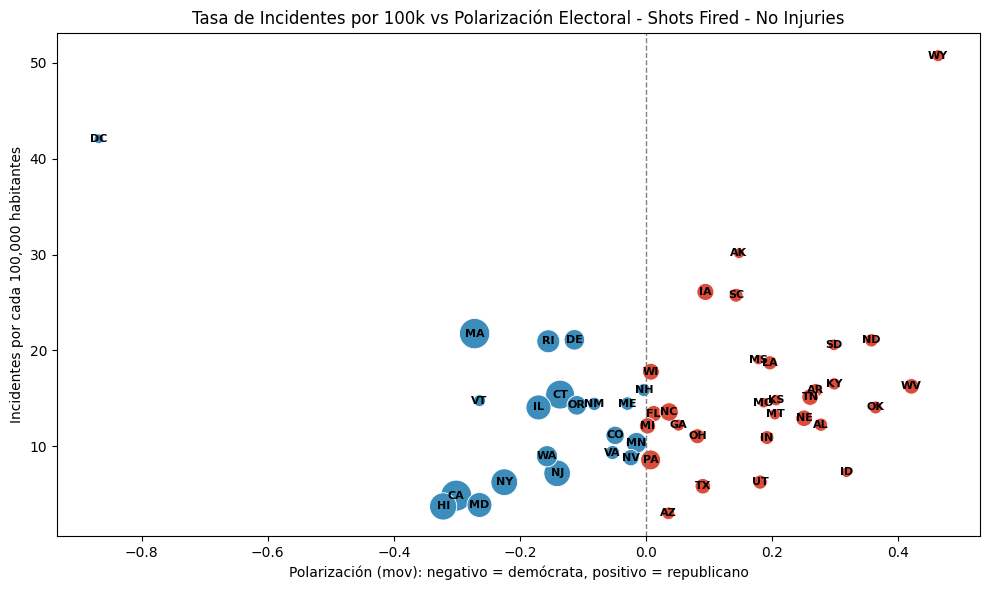

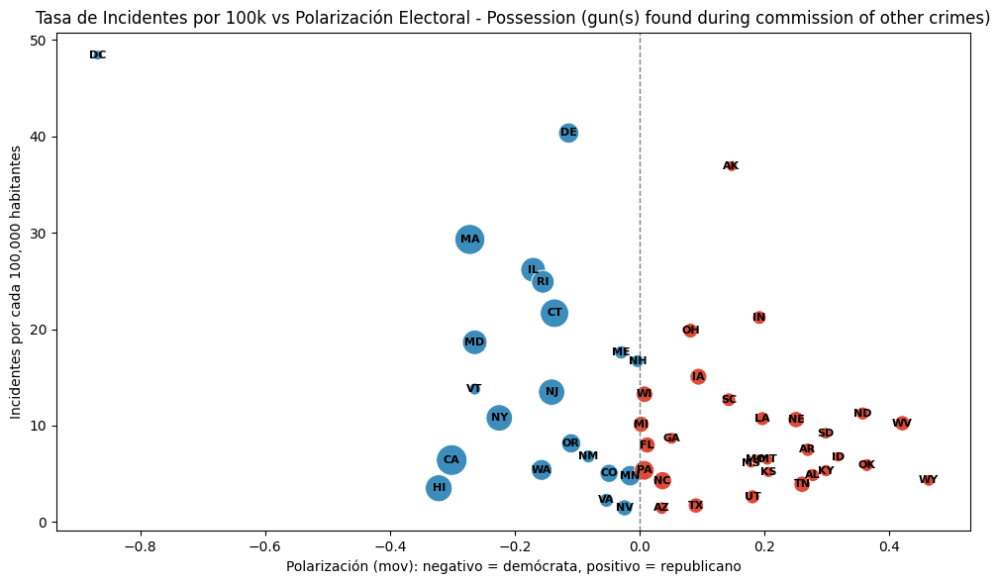

...

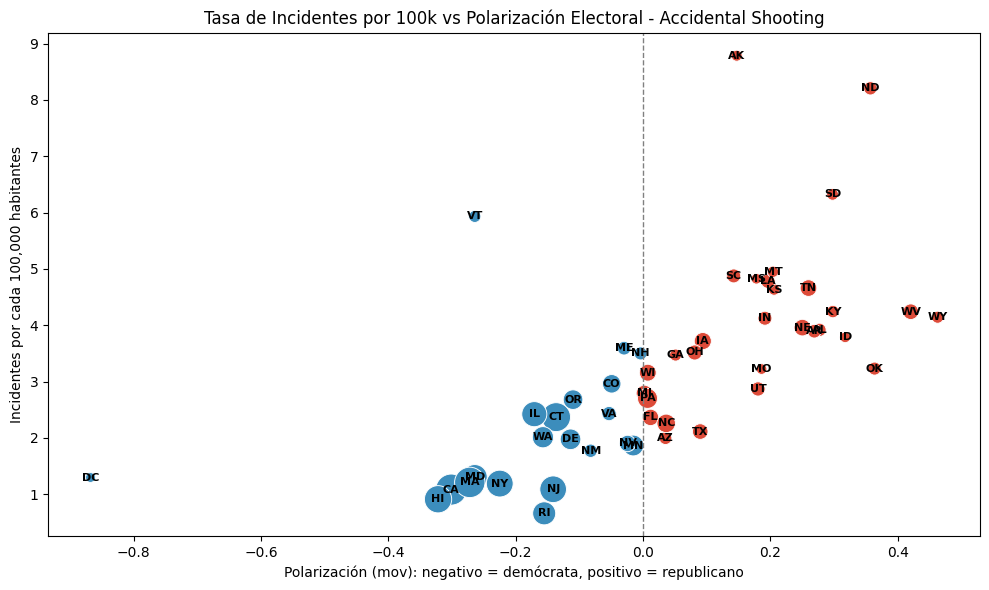

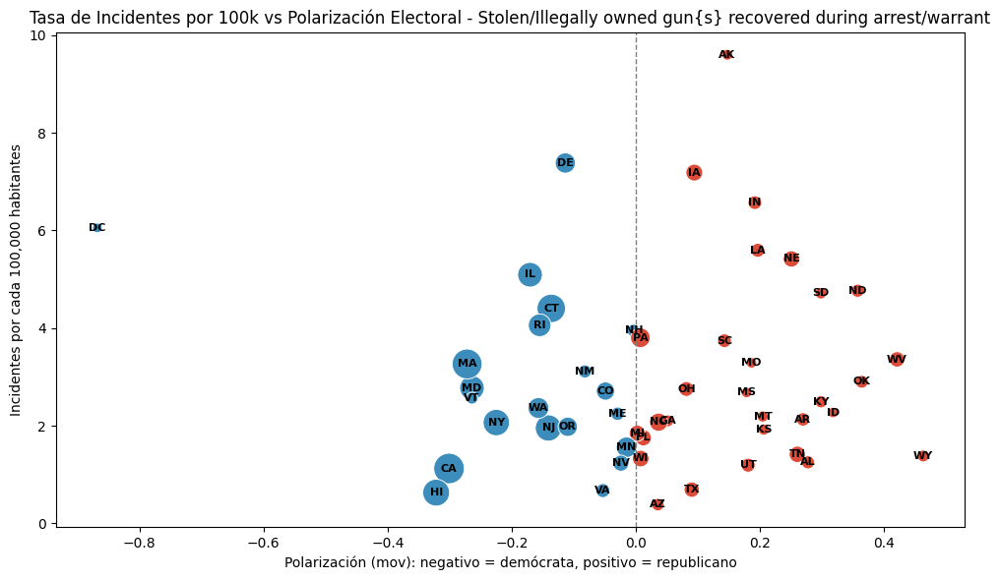

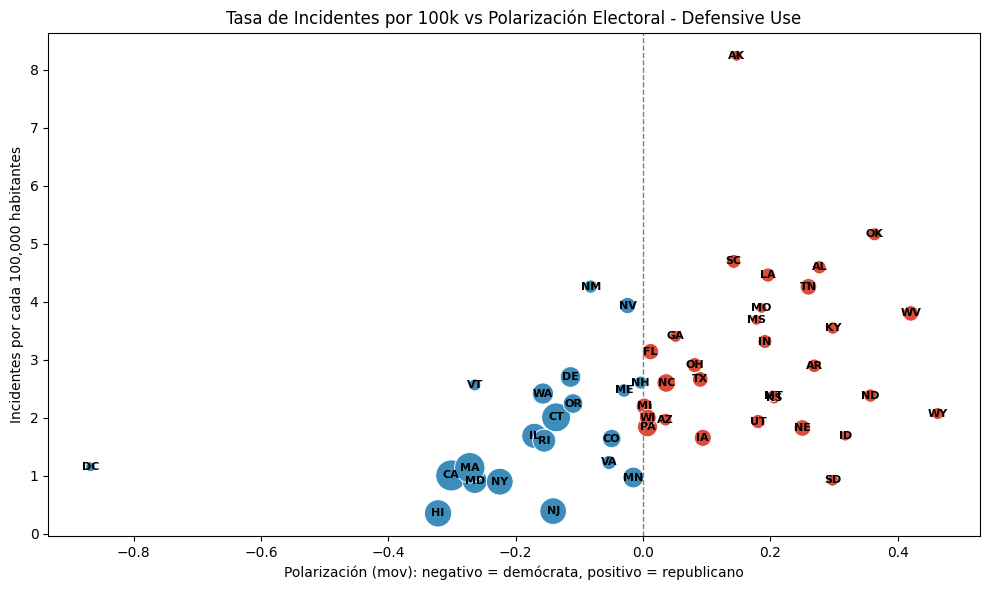

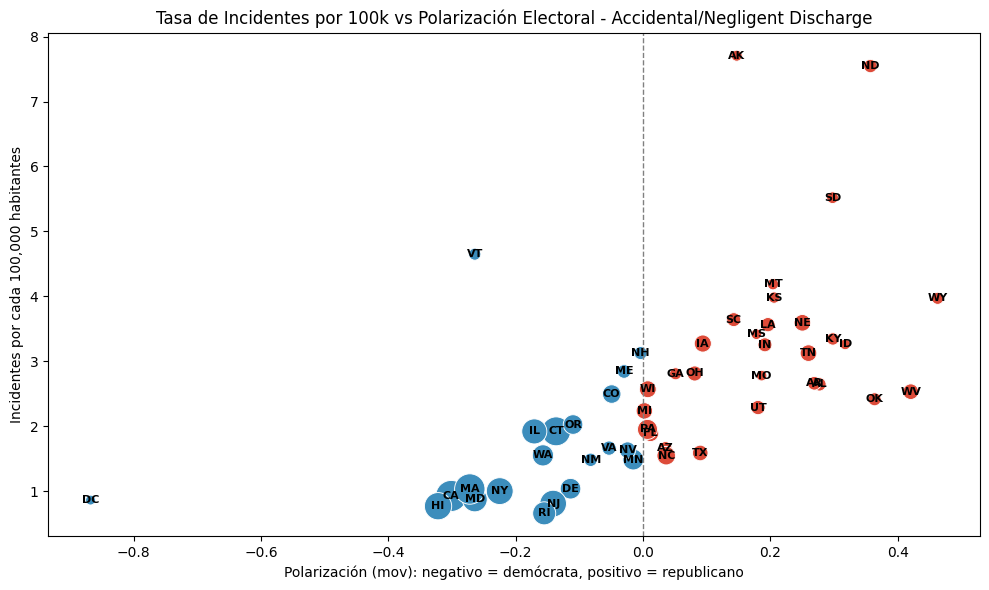

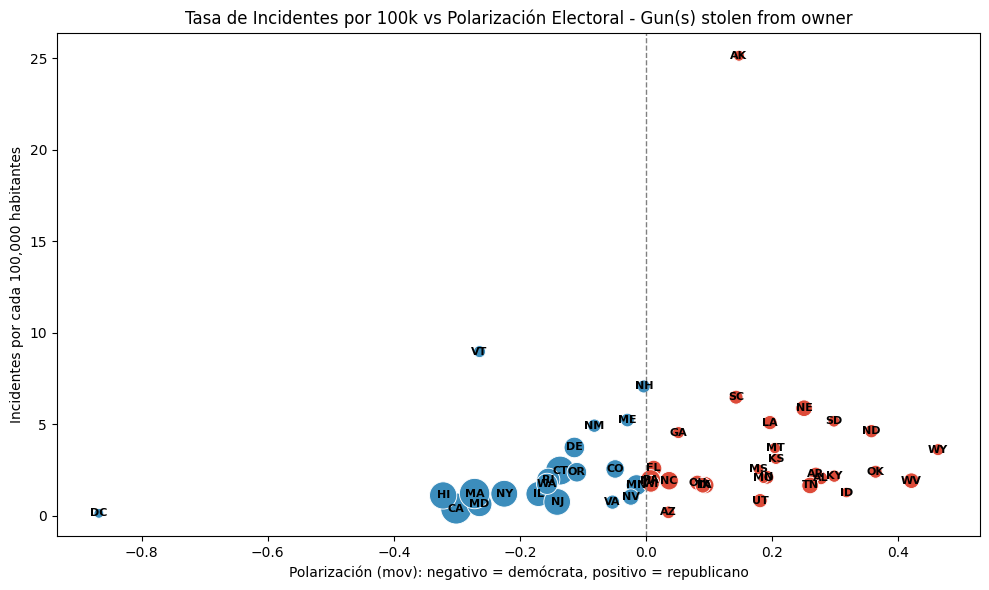

In [66]:
# Diccionario de abreviaturas de estados
state_to_code = {
    'District of Columbia':'DC','Mississippi':'MS','Oklahoma':'OK','Delaware':'DE','Minnesota':'MN','Illinois':'IL',
    'Arkansas':'AR','New Mexico':'NM','Indiana':'IN','Maryland':'MD','Louisiana':'LA','Idaho':'ID','Wyoming':'WY',
    'Tennessee':'TN','Arizona':'AZ','Iowa':'IA','Michigan':'MI','Kansas':'KS','Utah':'UT','Virginia':'VA','Oregon':'OR',
    'Connecticut':'CT','Montana':'MT','California':'CA','Massachusetts':'MA','West Virginia':'WV','South Carolina':'SC',
    'New Hampshire':'NH','Wisconsin':'WI','Vermont':'VT','Georgia':'GA','North Dakota':'ND','Pennsylvania':'PA',
    'Florida':'FL','Alaska':'AK','Kentucky':'KY','Hawaii':'HI','Nebraska':'NE','Missouri':'MO','Ohio':'OH','Alabama':'AL',
    'Rhode Island':'RI','South Dakota':'SD','Colorado':'CO','New Jersey':'NJ','Washington':'WA','North Carolina':'NC',
    'New York':'NY','Texas':'TX','Nevada':'NV','Maine':'ME'
}

for caracteristica in solo_caracteristicas:
    print(f"Generando scatter estático para: {caracteristica}")

    df_filtrado = df[df[caracteristica] == 1]
    incidents_by_state = df_filtrado.groupby("state").size().reset_index(name="incidents")
    merged = incidents_by_state.merge(StatesPop, on="state", how="left")
    merged["gun_laws"] = merged["state"].map(laws_2017).fillna(0)
    merged["incidents_per_100k"] = (merged["incidents"] / merged["POPESTIMATE2017"]) * 100000
    merged["mov_signed"] = merged.apply(
        lambda row: row["mov"] if row["republican indicator"] == 1 else -row["mov"], axis=1
    )

    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=merged,
        x="mov_signed",
        y="incidents_per_100k",
        size="gun_laws",
        sizes=(50, 500),
        hue="republican indicator",
        palette={0: "#3c8dbc", 1: "#dd4b39"},
        legend=False
    )

    # Abreviaturas en negro para resaltar
    for _, row in merged.iterrows():
        abbr = state_to_code.get(row["state"], row["state"][:3].upper())
        plt.text(row["mov_signed"], row["incidents_per_100k"], abbr,
                 ha="center", va="center", fontsize=8, color="black", weight="bold")

    plt.axvline(0, color="gray", linestyle="--", linewidth=1)
    plt.title(f"Tasa de Incidentes por 100k vs Polarización Electoral - {caracteristica}")
    plt.xlabel("Polarización (mov): negativo = demócrata, positivo = republicano")
    plt.ylabel("Incidentes por cada 100,000 habitantes")
    plt.tight_layout()

    # timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    # filename = f"scatter_{clean_filename(caracteristica)}_{timestamp}.png"
    # plt.savefig(filename, dpi=300)
    # print(f"Gráfico guardado como: {filename}")
    # plt.show()


In [ ]:
df[df['Domestic Violence'] == 1]

239678

In [ ]:
df[(df['Domestic Violence'] == 1) & (df['notes'] == 'Boy shot and killed his mother.')]